In [5]:
import photutils

from astropy.io import fits

from astropy.wcs import WCS
import astropy.units as u
from astropy.coordinates import SkyCoord

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
%matplotlib inline





In [6]:
image_hdu=fits.open('/Users/neal/Documents/PhD/projects/SED-fitting/Clump/Cutouts_galaxies/goodss_107_f435w_images.fits')
science_image = image_hdu[0].data
wcs_435 = WCS(image_hdu[0].header)
image_hdu.close()


## Doing the procedure for one galaxy- No 57 with 3 clumps

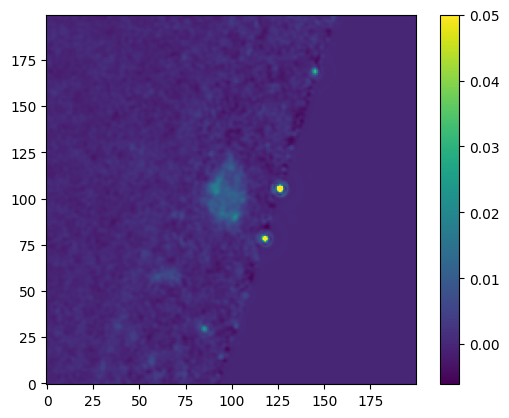

In [7]:
plt.imshow(science_image, origin='lower', vmax=0.05)
plt.colorbar()
plt.show()

In [8]:
goodss=pd.read_csv('/Users/neal/Documents/PhD/projects/SED-fitting/Clump/results/catalog_n/goodsslast.csv')

####  No. 57 is no longer in our clump cataloge! So I changed this to number 107 with three clumps

In [9]:
f_data= goodss[(goodss['CANDELS_ID'] == 107) & (goodss['Clump_ID'] == 1)]
f_data_2= goodss[(goodss['CANDELS_ID'] == 107) & (goodss['Clump_ID'] == 2)]
f_data_3= goodss[(goodss['CANDELS_ID'] == 107) & (goodss['Clump_ID'] == 3)]

# Selecting the RA and DEC of the clump
ra_dec_clump1 =f_data[['RA_clump', 'DEC_clump']]
ra_dec_clump2 =f_data_2[['RA_clump', 'DEC_clump']]
ra_dec_clump3 =f_data_3[['RA_clump', 'DEC_clump']]

In [10]:
f_data

,Unnamed: 0,Field,CANDELS_ID,z,RA_gal,DEC_gal,A,Clump_ID,dist_clump,flux_ratio,restuv_flux,RA_clump,DEC_clump
21,21,goodss,107,0.616,53.085105,-27.948368,9.569,1,10.137653,0.070392,0.90567,53.085064,-27.948525


In [11]:
# print(ra_dec_clump['DEC_clump'])

coords = SkyCoord(ra=ra_dec_clump['RA_clump'], dec=ra_dec_clump['DEC_clump'], unit='deg')

coords_2 = SkyCoord(ra=ra_dec_clump2['RA_clump'], dec=ra_dec_clump2['DEC_clump'], unit='deg')

coords_3 = SkyCoord(ra=ra_dec_clump3['RA_clump'], dec=ra_dec_clump3['DEC_clump'], unit='deg')

NameError: name 'ra_dec_clump' is not defined

/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_36340/367054818.py:1: DeprecationWarning: `photutils.SkyCircularAperture` is a deprecated alias for `photutils.aperture.SkyCircularAperture` and will be removed in the future. Instead, please use `from photutils.aperture import SkyCircularAperture` to silence this warning.
  aper_sky = photutils.SkyCircularAperture(positions=coords, r=0.18 * u.arcsec)
/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_36340/367054818.py:4: DeprecationWarning: `photutils.SkyCircularAperture` is a deprecated alias for `photutils.aperture.SkyCircularAperture` and will be removed in the future. Instead, please use `from photutils.aperture import SkyCircularAperture` to silence this warning.
  aper_sky_2 = photutils.SkyCircularAperture(positions=coords_2, r=0.18 * u.arcsec)
/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_36340/367054818.py:7: DeprecationWarning: `photutils.SkyCircularAperture` is a deprecated alias for `photutils.

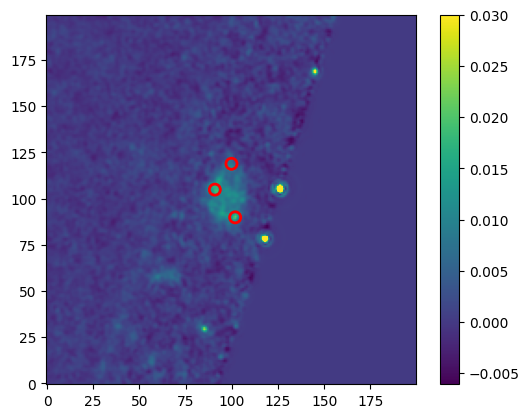

In [ ]:
aper_sky = photutils.SkyCircularAperture(positions=coords, r=0.18 * u.arcsec)
aper = aper_sky.to_pixel(wcs=wcs_435)

aper_sky_2 = photutils.SkyCircularAperture(positions=coords_2, r=0.18 * u.arcsec)
aper_2 = aper_sky_2.to_pixel(wcs=wcs_435)

aper_sky_3 = photutils.SkyCircularAperture(positions=coords_3, r=0.18 * u.arcsec)
aper_3 = aper_sky_3.to_pixel(wcs=wcs_435)

plt.imshow(science_image, origin='lower', vmax=0.03)
plt.colorbar()

aper.plot(color="red", lw=2., fill=False)

aper_2.plot(color="red", lw=2., fill=False)

aper_3.plot(color="red", lw=2., fill=False)
plt.show()



In [ ]:
phot_table = photutils.aperture_photometry(data=science_image, apertures=aper)

print(phot_table)

/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_36340/2779989057.py:1: DeprecationWarning: `photutils.aperture_photometry` is a deprecated alias for `photutils.aperture.aperture_photometry` and will be removed in the future. Instead, please use `from photutils.aperture import aperture_photometry` to silence this warning.
  phot_table = photutils.aperture_photometry(data=science_image, apertures=aper)


 id      xcenter            ycenter          aperture_sum   
           pix                pix                           
--- ------------------ ----------------- -------------------
  1 101.81259138626456 89.82769635015757 0.35830342761102163


### Creating Masks for Clump 1: masking out clump no 2 and 3

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


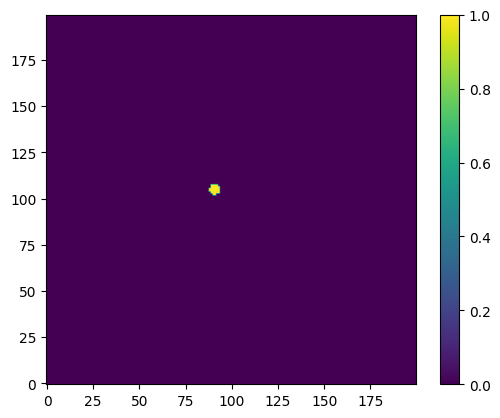

In [ ]:
mask2 = aper_2.to_mask(method='center')
print(mask2[0].to_image(science_image.shape))

plt.imshow(mask2[0].to_image(science_image.shape), origin='lower')
plt.colorbar()
plt.show()

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


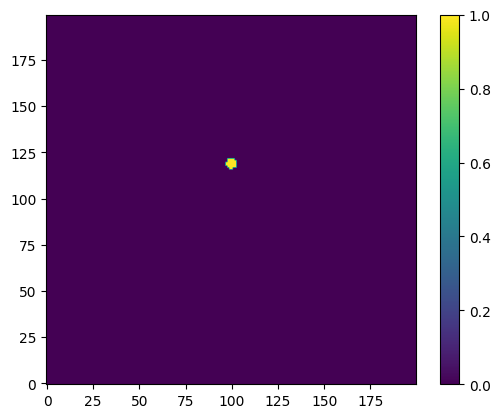

In [ ]:
mask3 = aper_3.to_mask(method='center')
print(mask3[0].to_image(science_image.shape))

plt.imshow(mask3[0].to_image(science_image.shape), origin='lower')
plt.colorbar()
plt.show()

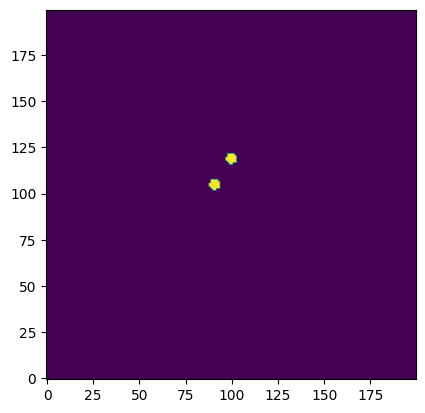

In [ ]:
mask_clumps_2_3 = mask2[0].to_image(science_image.shape) + mask3[0].to_image(science_image.shape)

plt.imshow(mask_clumps_2_3, origin='lower')
plt.show()

# mask out clumps 2 and 3
# adding 1 to everything
mask_clumps_2_3 += 1

# making the pixels that equal 2 zero
masked_pixels_clumps_2_3 = np.where((mask_clumps_2_3 == 2))

mask_clumps_2_3[masked_pixels_clumps_2_3[0], masked_pixels_clumps_2_3[1]] = 0

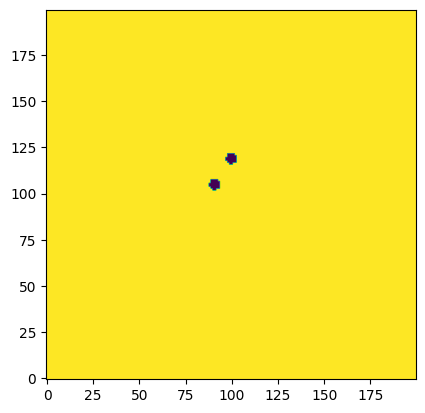

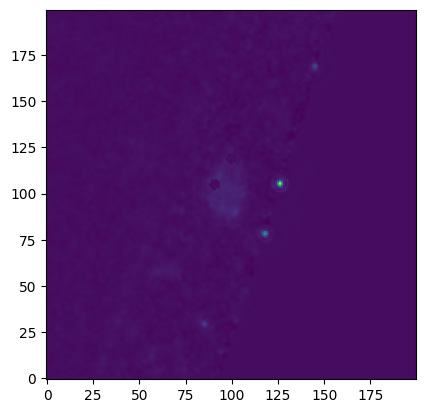

In [ ]:
plt.imshow(mask_clumps_2_3, origin='lower')
plt.show()

plt.imshow(mask_clumps_2_3 * science_image, origin='lower')
plt.show()

# Applying Mask and doing the photometry:

In [ ]:
masked_science_image = np.copy(science_image)  # Create a copy to modify
masked_science_image[mask_clumps_2_3 == 0] = 0
#masked_science_image[mask_clumps_2_3 == 0] = np.nan  ####ASK ALEX

# Now perform aperture photometry on the masked image
phot_table = photutils.aperture_photometry(data=masked_science_image, apertures=aper)

print(phot_table)

 id      xcenter            ycenter          aperture_sum   
           pix                pix                           
--- ------------------ ----------------- -------------------
  1 101.81259138626456 89.82769635015757 0.35830342761102163


/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_36340/1918372233.py:6: DeprecationWarning: `photutils.aperture_photometry` is a deprecated alias for `photutils.aperture.aperture_photometry` and will be removed in the future. Instead, please use `from photutils.aperture import aperture_photometry` to silence this warning.
  phot_table = photutils.aperture_photometry(data=masked_science_image, apertures=aper)


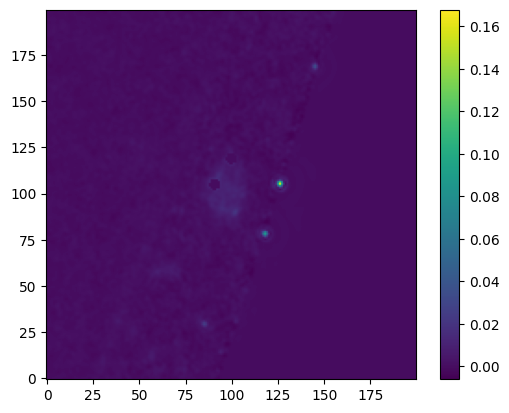

In [ ]:
plt.imshow(masked_science_image, origin='lower')
plt.colorbar()
plt.show()


## Background :

### Step 1: 
defining annulus aperture for background

In [ ]:
# Should adjust the inner and outer radii as needed based on image

annulus_sky_1 =  photutils.SkyCircularAnnulus(positions=coords, r_in=0.25 * u.arcsec, r_out=0.4 * u.arcsec)
annulus_1 = annulus_sky_1.to_pixel(wcs=wcs_435)


/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_36340/196039812.py:3: DeprecationWarning: `photutils.SkyCircularAnnulus` is a deprecated alias for `photutils.aperture.SkyCircularAnnulus` and will be removed in the future. Instead, please use `from photutils.aperture import SkyCircularAnnulus` to silence this warning.
  annulus_sky_1 =  photutils.SkyCircularAnnulus(positions=coords, r_in=0.25 * u.arcsec, r_out=0.4 * u.arcsec)


### Step 2:
background photometry

In [ ]:
# Calculate background flux for the first clump
background_1 = photutils.aperture_photometry(data=science_image, apertures=annulus_1)
area_annulus_1 = annulus_1.area  # Access area as a property, not a method
background_per_pixel_1 = background_1['aperture_sum'] / area_annulus_1 # get avg BG light per pixel for clump 1


/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_36340/4034555311.py:2: DeprecationWarning: `photutils.aperture_photometry` is a deprecated alias for `photutils.aperture.aperture_photometry` and will be removed in the future. Instead, please use `from photutils.aperture import aperture_photometry` to silence this warning.
  background_1 = photutils.aperture_photometry(data=science_image, apertures=annulus_1)


### Step 3:
scale background flux and adjust clump flux

In [ ]:
# Calculate the clump's aperture area
area_aper_1 = aper.area
# Scale background flux to the clump's aperture area
scaled_background_flux_1 = background_per_pixel_1 * area_aper_1

# Assume 'phot_table' contains the original flux measurement for the clump
# Subtract the scaled background from the clump's flux
phot_table['background_corrected_flux'] = phot_table['aperture_sum'] - scaled_background_flux_1

In [ ]:
print(phot_table)

 id      xcenter       ...     aperture_sum    background_corrected_flux
           pix         ...                                              
--- ------------------ ... ------------------- -------------------------
  1 101.81259138626456 ... 0.35830342761102163       0.19111032476383208


# For 2nd and 3rd clump:

In [ ]:

# First, reset the index for each DataFrame to make concatenation easier
ra_dec_clump1 = ra_dec_clump1.reset_index(drop=True)
ra_dec_clump2 = ra_dec_clump2.reset_index(drop=True)
ra_dec_clump3 = ra_dec_clump3.reset_index(drop=True)

# Add a 'Clump_ID' column to each DataFrame
ra_dec_clump1['Clump_ID'] = 1
ra_dec_clump2['Clump_ID'] = 2
ra_dec_clump3['Clump_ID'] = 3

# Reorder columns to have 'Clump_ID' first, if desired
ra_dec_clump1 = ra_dec_clump1[['Clump_ID', 'RA_clump', 'DEC_clump']]
ra_dec_clump2 = ra_dec_clump2[['Clump_ID', 'RA_clump', 'DEC_clump']]
ra_dec_clump3 = ra_dec_clump3[['Clump_ID', 'RA_clump', 'DEC_clump']]

# Concatenate the DataFrames
clumps = pd.concat([ra_dec_clump1, ra_dec_clump2, ra_dec_clump3], ignore_index=True)

# Print the concatenated DataFrame
print(clumps)


   Clump_ID   RA_clump  DEC_clump
0         1  53.085064 -27.948525
1         2  53.085272 -27.948275
2         3  53.085102 -27.948042


In [ ]:
def automated_photometry(clumps, wcs, science_image):
    results = []
    
    # Ensure the science image is a float array to avoid type issues
    science_image = np.array(science_image, dtype=float)
    
    for index, target_clump in clumps.iterrows():
        # Convert RA and DEC of the target clump to a SkyCoord object for astropy.
        target_coords = SkyCoord(ra=target_clump['RA_clump']*u.degree, dec=target_clump['DEC_clump']*u.degree)
        
        # Create a copy of the science image for this iteration to apply masks
        science_image_masked = np.copy(science_image)
        
        # Iterate over all other clumps to mask them out from the target clump's analysis.
        for _, other_clump in clumps.drop(index).iterrows():
            other_coords = SkyCoord(ra=other_clump['RA_clump']*u.degree, dec=other_clump['DEC_clump']*u.degree)
            # Create an aperture for the other clump
            mask_aperture = photutils.SkyCircularAperture(other_coords, r=0.18*u.arcsec).to_pixel(wcs=wcs_435)
            mask = mask_aperture.to_mask(method='center')
            # Manually construct the slices numpy array indexing using the bounding box of the mask.
            bbox_slices = (slice(mask.bbox.iymin, mask.bbox.iymax), slice(mask.bbox.ixmin, mask.bbox.ixmax))
            # Access the specific section of the masked image that corresponds to the current mask.
            science_image_masked_section = science_image_masked[bbox_slices]
            mask_data = mask.data.astype(bool)
            science_image_masked_section[mask_data] = 0
            science_image_masked[bbox_slices] = science_image_masked_section

        # Perform aperture photometry on the masked image
        target_aperture = photutils.SkyCircularAperture(target_coords, r=0.18*u.arcsec).to_pixel(wcs)
        photometry =photutils.aperture_photometry(science_image_masked, target_aperture)

        # Background subtraction using an annulus
        annulus_aperture = photutils.SkyCircularAnnulus(target_coords, r_in=0.25*u.arcsec, r_out=0.4*u.arcsec).to_pixel(wcs=wcs_435)
        background_1 = photutils.aperture_photometry(science_image, annulus_aperture)
        area_annulus_1 = annulus_aperture.area  # Area of the annulus

        # Calculate the average background light per pixel within the annulus
        background_per_pixel_1 = background_1['aperture_sum'][0] / area_annulus_1

        # Calculate the total background light within the aperture area
        total_background_light = background_per_pixel_1 * target_aperture.area

        # Subtract the background contribution to get the corrected flux
        corrected_flux = photometry['aperture_sum'][0] - total_background_light

        results.append({
            'Clump_ID': target_clump['Clump_ID'],
            'Raw_Flux': photometry['aperture_sum'].item(),
            'Background_Flux': total_background_light,
            'Corrected_Flux': corrected_flux.item()
        })

    return pd.DataFrame(results)


In [ ]:
results_df = automated_photometry(clumps, wcs_435, science_image)
print(results_df)

   Clump_ID  Raw_Flux  Background_Flux  Corrected_Flux
0       1.0  0.358303         0.167193        0.191110
1       2.0  0.438126         0.222181        0.215945
2       3.0  0.201569         0.096821        0.104747


/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_36340/1070784014.py:18: DeprecationWarning: `photutils.SkyCircularAperture` is a deprecated alias for `photutils.aperture.SkyCircularAperture` and will be removed in the future. Instead, please use `from photutils.aperture import SkyCircularAperture` to silence this warning.
  mask_aperture = photutils.SkyCircularAperture(other_coords, r=0.18*u.arcsec).to_pixel(wcs=wcs_435)
/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_36340/1070784014.py:29: DeprecationWarning: `photutils.SkyCircularAperture` is a deprecated alias for `photutils.aperture.SkyCircularAperture` and will be removed in the future. Instead, please use `from photutils.aperture import SkyCircularAperture` to silence this warning.
  target_aperture = photutils.SkyCircularAperture(target_coords, r=0.18*u.arcsec).to_pixel(wcs)
/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_36340/1070784014.py:30: DeprecationWarning: `photutils.aperture_photometry

# REPETING EVERYTHING with plots, bcz I thought the automated function is not working fine, it is fine.

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.wcs import WCS
import astropy.units as u
from astropy.coordinates import SkyCoord
import photutils
from photutils.aperture import SkyCircularAperture, SkyCircularAnnulus, aperture_photometry

def automated_photometry(clumps, wcs, science_image):
    results = []
    science_image = np.array(science_image, dtype=float)  # Ensure float type for image data
    
    for index, target_clump in clumps.iterrows():
        target_coords = SkyCoord(ra=target_clump['RA_clump']*u.degree, dec=target_clump['DEC_clump']*u.degree)
        pix_coords = wcs.world_to_pixel(target_coords)
        # Debug: Visualize aperture placement
        plt.imshow(science_image, origin='lower', cmap='gray', vmax=0.05)
        plt.colorbar()
        plt.scatter(pix_coords[0], pix_coords[1], color='red', s=100, label='Target Clump')
        plt.legend()
        plt.show()
        
        science_image_masked = np.copy(science_image)
        
        for _, other_clump in clumps.drop(index).iterrows():
            other_coords = SkyCoord(ra=other_clump['RA_clump']*u.degree, dec=other_clump['DEC_clump']*u.degree)
            mask_aperture = SkyCircularAperture(other_coords, r=0.18*u.arcsec).to_pixel(wcs)
            mask = mask_aperture.to_mask(method='center')
            bbox_slices = (slice(mask.bbox.iymin, mask.bbox.iymax), slice(mask.bbox.ixmin, mask.bbox.ixmax))
            
            mask_data = mask.data > 0
            science_image_masked_section = science_image_masked[bbox_slices]
            science_image_masked_section[mask_data] = 0
            science_image_masked[bbox_slices] = science_image_masked_section

        target_aperture = SkyCircularAperture(target_coords, r=0.18*u.arcsec).to_pixel(wcs)
        photometry = aperture_photometry(science_image_masked, target_aperture)

        annulus_aperture = SkyCircularAnnulus(target_coords, r_in=0.25*u.arcsec, r_out=0.4*u.arcsec).to_pixel(wcs)
        background = aperture_photometry(science_image, annulus_aperture)
        area_annulus = annulus_aperture.area
        
        background_per_pixel = background['aperture_sum'][0] / area_annulus
        total_background_light = background_per_pixel * target_aperture.area
        
        corrected_flux = photometry['aperture_sum'][0] - total_background_light

        # Debug: Print intermediate values
        print(f"Clump {target_clump['Clump_ID']}: Raw Flux = {photometry['aperture_sum'][0]}, Background = {total_background_light}, Corrected Flux = {corrected_flux}")

        results.append({
            'Clump_ID': target_clump['Clump_ID'],
            'Raw_Flux': photometry['aperture_sum'].item(),
            'Background_Flux': total_background_light,
            'Corrected_Flux': corrected_flux.item()
        })

    return pd.DataFrame(results)

# Assuming 'goodss' DataFrame and 'wcs_435' are already defined and loaded as shown previously
# Example call (replace 'goodss' and 'wcs_435' with actual variables if they differ):
# results_df = automated_photometry(goodss, wcs_435, science_image)
# print(results_df)


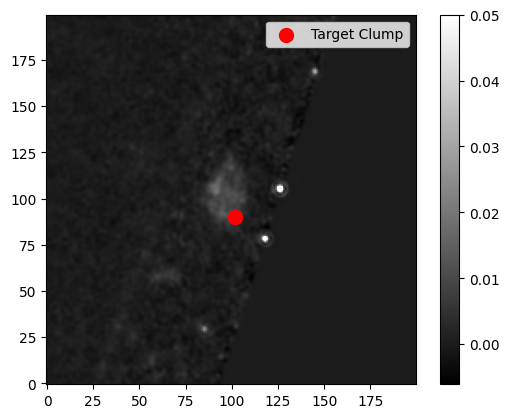

Clump 1.0: Raw Flux = 0.35830342761102163, Background = 0.16719310284718955, Corrected Flux = 0.19111032476383208


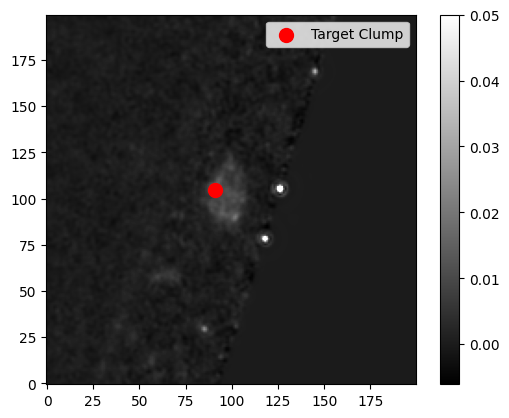

Clump 2.0: Raw Flux = 0.4381258216853329, Background = 0.22218127285934813, Corrected Flux = 0.21594454882598474


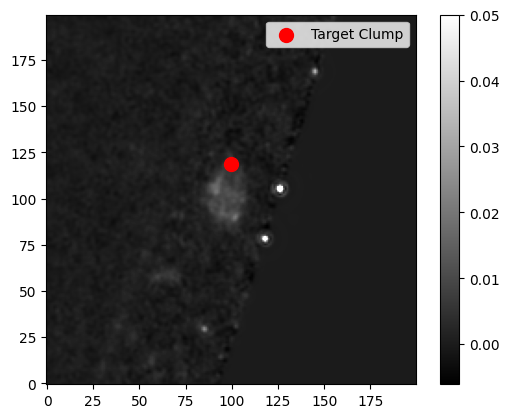

Clump 3.0: Raw Flux = 0.20156892383466937, Background = 0.096821466256181, Corrected Flux = 0.10474745757848837
   Clump_ID  Raw_Flux  Background_Flux  Corrected_Flux
0       1.0  0.358303         0.167193        0.191110
1       2.0  0.438126         0.222181        0.215945
2       3.0  0.201569         0.096821        0.104747


In [ ]:
results_df = automated_photometry(clumps, wcs_435, science_image)
print(results_df)

In [ ]:
import numpy as np
import pandas as pd
from astropy.io import fits
from astropy.wcs import WCS
import astropy.units as u
from astropy.coordinates import SkyCoord
import photutils
from photutils.aperture import SkyCircularAperture, SkyCircularAnnulus, aperture_photometry

def automated_photometry(clumps, wcs, science_image, mask_aperture_size=0.24, annulus_inner=0.24, annulus_outer=0.36):
    results = []
    
    science_image = np.array(science_image, dtype=float)
    
    for index, target_clump in clumps.iterrows():
        target_coords = SkyCoord(ra=target_clump['RA_clump']*u.degree, dec=target_clump['DEC_clump']*u.degree)
        science_image_masked = np.copy(science_image)
        
        for _, other_clump in clumps.drop(index).iterrows():
            other_coords = SkyCoord(ra=other_clump['RA_clump']*u.degree, dec=other_clump['DEC_clump']*u.degree)
            mask_aperture = SkyCircularAperture(other_coords, r=mask_aperture_size*u.arcsec).to_pixel(wcs)
            mask = mask_aperture.to_mask(method='center')
            bbox_slices = (slice(mask.bbox.iymin, mask.bbox.iymax), slice(mask.bbox.ixmin, mask.bbox.ixmax))
            science_image_masked_section = science_image_masked[bbox_slices]
            mask_data = mask.data.astype(bool)
            science_image_masked_section[mask_data] = 0
            science_image_masked[bbox_slices] = science_image_masked_section

        target_aperture = SkyCircularAperture(target_coords, r=0.18*u.arcsec).to_pixel(wcs)
        photometry = aperture_photometry(science_image_masked, target_aperture)

        annulus_aperture = SkyCircularAnnulus(target_coords, r_in=annulus_inner*u.arcsec, r_out=annulus_outer*u.arcsec).to_pixel(wcs)
        background = aperture_photometry(science_image, annulus_aperture)
        area_annulus = annulus_aperture.area
        background_per_pixel = background['aperture_sum'][0] / area_annulus
        total_background_light = background_per_pixel * target_aperture.area
        corrected_flux = photometry['aperture_sum'][0] - total_background_light

        results.append({
            'CANDELS_ID': target_clump['CANDELS_ID'],
            'Clump_ID': target_clump['Clump_ID'],
            'Raw_Flux': photometry['aperture_sum'].item(),
            'Background_Flux': total_background_light,
            'Corrected_Flux': corrected_flux.item()
        })

    return pd.DataFrame(results)

# Load the clump catalog
clump_catalog_path = '/Users/neal/Documents/PhD/projects/SED-fitting/Clump/results/catalog_n/goodsslast.csv'
clump_catalog = pd.read_csv(clump_catalog_path)

In [ ]:
import pandas as pd

# Load the catalog
clump_catalog_path = '/Users/neal/Documents/PhD/projects/SED-fitting/Clump/results/catalog_n/goodsslast.csv'
clump_catalog = pd.read_csv(clump_catalog_path)


In [ ]:
# Initialize dictionaries
wcs_dict = {}
image_data_dict = {}

# Loop through each galaxy ID in the catalog
for candels_id in clump_catalog['CANDELS_ID'].unique():
    # Define the path to the FITS file (this is an example, adjust the path as needed)
    fits_path = f'/Users/neal/Documents/PhD/projects/SED-fitting/Clump/Cutouts_galaxies/goodss_{candels_id}_f435w_images.fits'
    
    # Load the FITS file
    with fits.open(fits_path) as hdul:
        # Create the WCS object from the header
        wcs_dict[candels_id] = WCS(hdul[0].header)
        # Load the science image data
        image_data_dict[candels_id] = hdul[0].data

In [ ]:
# Prepare new columns for photometry results in the original clump_catalog
clump_catalog['Raw_Flux'] = np.nan
clump_catalog['Background_Flux'] = np.nan
clump_catalog['Corrected_Flux'] = np.nan

for candels_id in clump_catalog['CANDELS_ID'].unique():
    galaxy_clumps = clump_catalog[(clump_catalog['CANDELS_ID'] == candels_id) & (clump_catalog['DEC_clump'] <= 90) & (clump_catalog['DEC_clump'] >= -90)].copy()
    
    if not galaxy_clumps.empty and candels_id in wcs_dict and candels_id in image_data_dict:
        wcs = wcs_dict[candels_id]
        science_image = image_data_dict[candels_id]
        photometry_results = automated_photometry(galaxy_clumps, wcs, science_image)
        
        # Update the original clump_catalog with the results
        for index, row in photometry_results.iterrows():
            mask = (clump_catalog['CANDELS_ID'] == row['CANDELS_ID']) & (clump_catalog['Clump_ID'] == row['Clump_ID'])
            clump_catalog.loc[mask, 'Raw_Flux'] = row['Raw_Flux']
            clump_catalog.loc[mask, 'Background_Flux'] = row['Background_Flux']
            clump_catalog.loc[mask, 'Corrected_Flux'] = row['Corrected_Flux']

# Save the updated clump catalog with photometry results
clump_catalog.to_csv('/Users/neal/Documents/PhD/projects/SED-fitting/Clump/results/updated_goodss_photometry_results.csv', index=False)


In [ ]:
# all_results = pd.DataFrame()

# for candels_id in clump_catalog['CANDELS_ID'].unique():
#     galaxy_clumps = clump_catalog[(clump_catalog['CANDELS_ID'] == candels_id) & (clump_catalog['DEC_clump'] <= 90) & (clump_catalog['DEC_clump'] >= -90)]
    
#     # Continue only if there are valid clumps for this galaxy
#     if not galaxy_clumps.empty:
#         wcs = wcs_dict[candels_id]
#         science_image = image_data_dict[candels_id]
#         galaxy_results = automated_photometry(galaxy_clumps, wcs, science_image)
#         all_results = pd.concat([all_results, galaxy_results], ignore_index=True)

# # Save the results to a CSV file
# all_results.to_csv('/Users/neal/Documents/PhD/projects/SED-fitting/Clump/results/catalog_n/goodss_photometry_results.csv', index=False)


# But this removes other columns, doing it again to preserves the columns in cat.

# Trying to add this directly to the cataloge:

# Next problem is that my code sets phot =0 for the ones that onnly have one clump. Fixing that:

In [ ]:
def automated_photometry(clumps, wcs, science_image, mask_aperture_size=0.24, annulus_inner=0.24, annulus_outer=0.36):
    results = []

    science_image = np.array(science_image, dtype=float)

    for index, target_clump in clumps.iterrows():
        target_coords = SkyCoord(ra=target_clump['RA_clump']*u.degree, dec=target_clump['DEC_clump']*u.degree)
        science_image_masked = np.copy(science_image)

        if len(clumps) > 1:
            # Only perform masking if there are other clumps present
            for _, other_clump in clumps.drop(index).iterrows():
                other_coords = SkyCoord(ra=other_clump['RA_clump']*u.degree, dec=other_clump['DEC_clump']*u.degree)
                mask_aperture = SkyCircularAperture(other_coords, r=mask_aperture_size*u.arcsec).to_pixel(wcs)
                mask = mask_aperture.to_mask(method='center')
                bbox_slices = (slice(mask.bbox.iymin, mask.bbox.iymax), slice(mask.bbox.ixmin, mask.bbox.ixmax))
                science_image_masked_section = science_image_masked[bbox_slices]
                mask_data = mask.data.astype(bool)
                science_image_masked_section[mask_data] = 0
                science_image_masked[bbox_slices] = science_image_masked_section

        # Proceed with photometry for the target clump, whether masked or not
        target_aperture = SkyCircularAperture(target_coords, r=0.18*u.arcsec).to_pixel(wcs)
        photometry = aperture_photometry(science_image_masked, target_aperture)

        annulus_aperture = SkyCircularAnnulus(target_coords, r_in=annulus_inner*u.arcsec, r_out=annulus_outer*u.arcsec).to_pixel(wcs)
        background = aperture_photometry(science_image_masked, annulus_aperture)
        area_annulus = annulus_aperture.area
        background_per_pixel = background['aperture_sum'][0] / area_annulus
        total_background_light = background_per_pixel * target_aperture.area
        corrected_flux = photometry['aperture_sum'][0] - total_background_light

        results.append({
            'CANDELS_ID': target_clump['CANDELS_ID'],
            'Clump_ID': target_clump['Clump_ID'],
            'Raw_Flux': photometry['aperture_sum'].item(),
            'Background_Flux': total_background_light,
            'Corrected_Flux': corrected_flux.item()
        })

    return pd.DataFrame(results)


In [ ]:
# Load the catalog
clump_catalog_path = '/Users/neal/Documents/PhD/projects/SED-fitting/Clump/results/catalog_n/goodsslast.csv'
clump_catalog = pd.read_csv(clump_catalog_path)


In [ ]:
# Initialize dictionaries
wcs_dict = {}
image_data_dict = {}

# Loop through each galaxy ID in the catalog
for candels_id in clump_catalog['CANDELS_ID'].unique():
    # Define the path to the FITS file (this is an example, adjust the path as needed)
    fits_path = f'/Users/neal/Documents/PhD/projects/SED-fitting/Clump/Cutouts_galaxies/goodss_{candels_id}_f435w_images.fits'
    
    # Load the FITS file
    with fits.open(fits_path) as hdul:
        # Create the WCS object from the header
        wcs_dict[candels_id] = WCS(hdul[0].header)
        # Load the science image data
        image_data_dict[candels_id] = hdul[0].data

In [ ]:
# Prepare new columns for photometry results in the original clump_catalog
clump_catalog['Raw_Flux'] = np.nan
clump_catalog['Background_Flux'] = np.nan
clump_catalog['Corrected_Flux'] = np.nan

for candels_id in clump_catalog['CANDELS_ID'].unique():
    galaxy_clumps = clump_catalog[(clump_catalog['CANDELS_ID'] == candels_id) & (clump_catalog['DEC_clump'] <= 90) & (clump_catalog['DEC_clump'] >= -90)].copy()
    
    if not galaxy_clumps.empty and candels_id in wcs_dict and candels_id in image_data_dict:
        wcs = wcs_dict[candels_id]
        science_image = image_data_dict[candels_id]
        photometry_results = automated_photometry(galaxy_clumps, wcs, science_image)
        
        # Update the original clump_catalog with the results
        for index, row in photometry_results.iterrows():
            mask = (clump_catalog['CANDELS_ID'] == row['CANDELS_ID']) & (clump_catalog['Clump_ID'] == row['Clump_ID'])
            clump_catalog.loc[mask, 'Raw_Flux'] = row['Raw_Flux']
            clump_catalog.loc[mask, 'Background_Flux'] = row['Background_Flux']
            clump_catalog.loc[mask, 'Corrected_Flux'] = row['Corrected_Flux']

# Save the updated clump catalog with photometry results
clump_catalog.to_csv('/Users/neal/Documents/PhD/projects/SED-fitting/Clump/results/updated_second_goodss_photometry_results.csv', index=False)


In [ ]:
# bandpasses = ['f125w', 'f140w', 'f160w', 'f275w', 'f435w', 'f606w', 'f775w', 'f850lp']


In [ ]:
def automated_photometry(clumps, wcs, science_image, mask_aperture_size=0.24, annulus_inner=0.24, annulus_outer=0.36):
    results = []

    # Convert the science image to a floating point array if not already
    science_image = np.array(science_image, dtype=float)

    for index, target_clump in clumps.iterrows():
        # Check if the target clump has valid coordinates
        if target_clump['DEC_clump'] == -99.0:
            print(f"Skipping clump due to invalid coordinates: {target_clump['CANDELS_ID']}, {target_clump['Clump_ID']}")
            continue

        target_coords = SkyCoord(ra=target_clump['RA_clump']*u.degree, dec=target_clump['DEC_clump']*u.degree)
        science_image_masked = np.copy(science_image)

        # Mask other clumps only if more than one clump is present
        if len(clumps) > 1:
            for _, other_clump in clumps.drop(index).iterrows():
                other_coords = SkyCoord(ra=other_clump['RA_clump']*u.degree, dec=other_clump['DEC_clump']*u.degree)
                mask_aperture = SkyCircularAperture(other_coords, r=mask_aperture_size*u.arcsec).to_pixel(wcs)
                mask = mask_aperture.to_mask(method='center')
                bbox_slices = (slice(mask.bbox.iymin, mask.bbox.iymax), slice(mask.bbox.ixmin, mask.bbox.ixmax))
                science_image_masked_section = science_image_masked[bbox_slices]
                mask_data = mask.data.astype(bool)
                science_image_masked_section[mask_data] = 0
                science_image_masked[bbox_slices] = science_image_masked_section

        # Perform photometry on the target clump
        target_aperture = SkyCircularAperture(target_coords, r=0.18*u.arcsec).to_pixel(wcs)
        photometry = aperture_photometry(science_image_masked, target_aperture)

        # Check if photometry result is unexpected
        if photometry['aperture_sum'][0] == 0:
            print(f"Zero flux detected for clump: {target_clump['CANDELS_ID']}, {target_clump['Clump_ID']}")

        # Background subtraction
        annulus_aperture = SkyCircularAnnulus(target_coords, r_in=annulus_inner*u.arcsec, r_out=annulus_outer*u.arcsec).to_pixel(wcs)
        background = aperture_photometry(science_image_masked, annulus_aperture)
        area_annulus = annulus_aperture.area
        background_per_pixel = background['aperture_sum'][0] / area_annulus
        total_background_light = background_per_pixel * target_aperture.area
        corrected_flux = photometry['aperture_sum'][0] - total_background_light

        results.append({
            'CANDELS_ID': target_clump['CANDELS_ID'],
            'Clump_ID': target_clump['Clump_ID'],
            'Raw_Flux': photometry['aperture_sum'].item(),
            'Background_Flux': total_background_light,
            'Corrected_Flux': corrected_flux.item()
        })

    return pd.DataFrame(results)


In [ ]:
# Prepare new columns for photometry results in the original clump_catalog
clump_catalog['Raw_Flux'] = np.nan
clump_catalog['Background_Flux'] = np.nan
clump_catalog['Corrected_Flux'] = np.nan

for candels_id in clump_catalog['CANDELS_ID'].unique():
    galaxy_clumps = clump_catalog[(clump_catalog['CANDELS_ID'] == candels_id) & (clump_catalog['DEC_clump'] <= 90) & (clump_catalog['DEC_clump'] >= -90)].copy()
    
    if not galaxy_clumps.empty and candels_id in wcs_dict and candels_id in image_data_dict:
        wcs = wcs_dict[candels_id]
        science_image = image_data_dict[candels_id]
        photometry_results = automated_photometry(galaxy_clumps, wcs, science_image)
        
        # Update the original clump_catalog with the results
        for index, row in photometry_results.iterrows():
            mask = (clump_catalog['CANDELS_ID'] == row['CANDELS_ID']) & (clump_catalog['Clump_ID'] == row['Clump_ID'])
            clump_catalog.loc[mask, 'Raw_Flux'] = row['Raw_Flux']
            clump_catalog.loc[mask, 'Background_Flux'] = row['Background_Flux']
            clump_catalog.loc[mask, 'Corrected_Flux'] = row['Corrected_Flux']

# Save the updated clump catalog with photometry results
clump_catalog.to_csv('/Users/neal/Documents/PhD/projects/SED-fitting/Clump/results/updated_second_goodss_photometry_results.csv', index=False)


Zero flux detected for clump: 133, 1
Zero flux detected for clump: 139, 1
Zero flux detected for clump: 172, 1
Zero flux detected for clump: 263, 1
Zero flux detected for clump: 263, 2
Zero flux detected for clump: 263, 3
Zero flux detected for clump: 3001, 1
Zero flux detected for clump: 3162, 1
Zero flux detected for clump: 3408, 1
Zero flux detected for clump: 3475, 1
Zero flux detected for clump: 3475, 2
Zero flux detected for clump: 3475, 3
Zero flux detected for clump: 3776, 1
Zero flux detected for clump: 3776, 2
Zero flux detected for clump: 14672, 1
Zero flux detected for clump: 14672, 2
Zero flux detected for clump: 15058, 1
Zero flux detected for clump: 16643, 1
Zero flux detected for clump: 16756, 1
Zero flux detected for clump: 18646, 1
Zero flux detected for clump: 18646, 2
Zero flux detected for clump: 19267, 1
Zero flux detected for clump: 19267, 2
Zero flux detected for clump: 19461, 1
Zero flux detected for clump: 23773, 1
Zero flux detected for clump: 23773, 2
Zero f

# So zero phot happens also in galaxies with some clumps!

In [ ]:
# Example of validating a single clump's coordinates
from astropy.wcs.utils import skycoord_to_pixel

candels_id = 133  # Sample CANDELS ID
target_clump = clump_catalog[(clump_catalog['CANDELS_ID'] == candels_id) & (clump_catalog['Clump_ID'] == 1)].iloc[0]

wcs = wcs_dict[candels_id]
coords = SkyCoord(ra=target_clump['RA_clump']*u.degree, dec=target_clump['DEC_clump']*u.degree)
pixel_coords = skycoord_to_pixel(coords, wcs)

print(f"Pixel coordinates for clump {target_clump['Clump_ID']}: {pixel_coords}")


Pixel coordinates for clump 1: (array(100.81295775), array(98.82603529))


# checking for exmaple: no 133:

In [ ]:
image_hdu=fits.open('/Users/neal/Documents/PhD/projects/SED-fitting/Clump/Cutouts_galaxies/goodss_133_f606w_images.fits')
science_image = image_hdu[0].data
wcs_435 = WCS(image_hdu[0].header)
image_hdu.close()

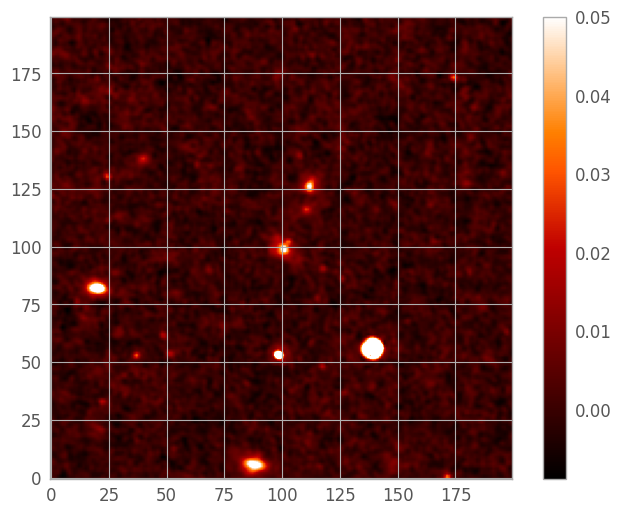

In [ ]:
plt.imshow(science_image, origin='lower', vmax=0.05)
plt.colorbar()
plt.show()

### finding: So the problme here is taht in f435W, galaxy 133 image is completely black.

### NOw doing this for all bands:

In [ ]:
# Load the catalog
clump_catalog_path = '/Users/neal/Documents/PhD/projects/SED-fitting/Clump/results/catalog_n/goodsslast.csv'
clump_catalog = pd.read_csv(clump_catalog_path)

In [ ]:
import os

# List of bands to process
bands = ['f125w', 'f140w', 'f160w', 'f275w', 'f435w', 'f606w', 'f775w', 'f850lp']

# Initialize a dictionary to hold the WCS objects and science image data for each band
wcs_dict = {band: {} for band in bands}
image_data_dict = {band: {} for band in bands}

# Populate the dictionaries with WCS and image data for each band and galaxy
for candels_id in clump_catalog['CANDELS_ID'].unique():
    for band in bands:
        fits_path = f'/Users/neal/Documents/PhD/projects/SED-fitting/Clump/Cutouts_galaxies/goodss_{candels_id}_{band}_images.fits'
        
        # Check if the FITS file exists
        if os.path.exists(fits_path):
            with fits.open(fits_path) as hdul:
                wcs_dict[band][candels_id] = WCS(hdul[0].header)
                image_data_dict[band][candels_id] = hdul[0].data

# Perform photometry for each band and galaxy, and add results to the catalog
for candels_id in clump_catalog['CANDELS_ID'].unique():
    galaxy_clumps = clump_catalog[(clump_catalog['CANDELS_ID'] == candels_id) & (clump_catalog['DEC_clump'] <= 90) & (clump_catalog['DEC_clump'] >= -90)].copy()
    
    for band in bands:
        # Check if the galaxy has data in this band
        if candels_id in wcs_dict[band] and candels_id in image_data_dict[band]:
            wcs = wcs_dict[band][candels_id]
            science_image = image_data_dict[band][candels_id]
            
            # Check if the science image is not empty or nearly black
            if not np.all(science_image == 0):
                photometry_results = automated_photometry(galaxy_clumps, wcs, science_image)
                
                # Update the original clump_catalog with the results
                for index, row in photometry_results.iterrows():
                    mask = (clump_catalog['CANDELS_ID'] == row['CANDELS_ID']) & (clump_catalog['Clump_ID'] == row['Clump_ID'])
                    clump_catalog.loc[mask, f'Raw_Flux_{band}'] = row['Raw_Flux']
                    clump_catalog.loc[mask, f'Background_Flux_{band}'] = row['Background_Flux']
                    clump_catalog.loc[mask, f'Corrected_Flux_{band}'] = row['Corrected_Flux']

# Save the updated clump catalog with photometry results
clump_catalog.to_csv('/Users/neal/Documents/PhD/projects/SED-fitting/Clump/results/multi_band_photometry_results.csv', index=False)


OSError: [Errno 24] Too many open files

## Checking the units of fluxes: for the first galaxy no.18:

In [ ]:
image_hdu=fits.open('/Users/neal/Documents/PhD/projects/SED-fitting/Clump/Cutouts_galaxies/goodss_18_f606w_images.fits')
science_image = image_hdu[0].data
wcs_435 = WCS(image_hdu[0].header)
image_hdu.close()


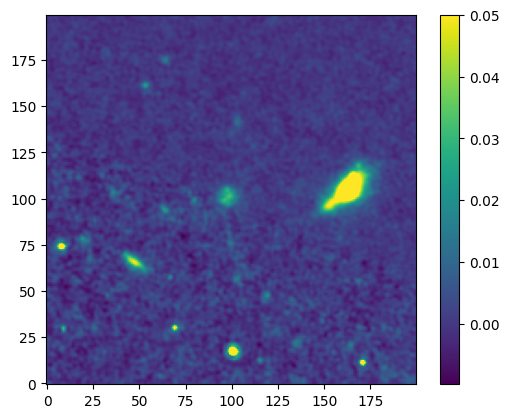

In [ ]:
plt.imshow(science_image, origin='lower', vmax=0.05)
plt.colorbar()
plt.show()

In [ ]:
ex_data= goodss[(goodss['CANDELS_ID'] == 18) & (goodss['Clump_ID'] == 1)]
ex_data_2= goodss[(goodss['CANDELS_ID'] == 18) & (goodss['Clump_ID'] == 2)]


# Selecting the RA and DEC of the clump
radec_clump1 =ex_data[['RA_clump', 'DEC_clump']]
radec_clump2 =ex_data_2[['RA_clump', 'DEC_clump']]


In [ ]:
coords1 = SkyCoord(ra=radec_clump1['RA_clump'], dec=radec_clump1['DEC_clump'], unit='deg')

coords2 = SkyCoord(ra=radec_clump2['RA_clump'], dec=radec_clump2['DEC_clump'], unit='deg')


/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_15019/1266197364.py:1: DeprecationWarning: `photutils.SkyCircularAperture` is a deprecated alias for `photutils.aperture.SkyCircularAperture` and will be removed in the future. Instead, please use `from photutils.aperture import SkyCircularAperture` to silence this warning.
  aper_sky_1 = photutils.SkyCircularAperture(positions=coords1, r=0.18 * u.arcsec)
/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_15019/1266197364.py:4: DeprecationWarning: `photutils.SkyCircularAperture` is a deprecated alias for `photutils.aperture.SkyCircularAperture` and will be removed in the future. Instead, please use `from photutils.aperture import SkyCircularAperture` to silence this warning.
  aper_sky_2 = photutils.SkyCircularAperture(positions=coords2, r=0.18 * u.arcsec)


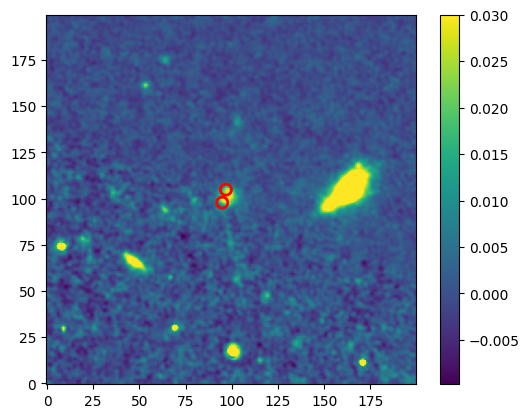

In [ ]:
aper_sky_1 = photutils.SkyCircularAperture(positions=coords1, r=0.18 * u.arcsec)
aper_1 = aper_sky_1.to_pixel(wcs=wcs_435)

aper_sky_2 = photutils.SkyCircularAperture(positions=coords2, r=0.18 * u.arcsec)
aper_2 = aper_sky_2.to_pixel(wcs=wcs_435)



plt.imshow(science_image, origin='lower', vmax=0.03)
plt.colorbar()

aper_1.plot(color="red", lw=2., fill=False)

aper_2.plot(color="red", lw=2., fill=False)


plt.show()



## Searching for conversion in header:

In [ ]:
# We'll execute the provided code with some modifications to troubleshoot the issue.

from astropy.io import fits

# Open the FITS file
fits_path = '/Users/neal/Documents/PhD/projects/SED-fitting/Clump/Cutouts_galaxies/goodss_18_f606w_images.fits'
try:
    # Try to open the FITS file
    with fits.open(fits_path) as hdul:
        # Print a statement to confirm the file is opened
        print("FITS file opened successfully.")
        
        # Check the primary header first
        primary_header = hdul[0].header
        print("Primary Header:")
        print(primary_header)

        # Check for specific keywords in the primary header
        if 'PHOTFLAM' in primary_header:
            photflam = primary_header['PHOTFLAM']
            print(f"PHOTFLAM found in primary header: {photflam}")
        else:
            print("PHOTFLAM not found in primary header.")
            
        if 'PHOTFNU' in primary_header:
            photfnu = primary_header['PHOTFNU']
            print(f"PHOTFNU found in primary header: {photfnu}")
        else:
            print("PHOTFNU not found in primary header.")
            
        if 'PHOTPLAM' in primary_header:
            photplam = primary_header['PHOTPLAM']
            print(f"PHOTPLAM found in primary header: {photplam}")
        else:
            print("PHOTPLAM not found in primary header.")

        # If not found in the primary header, check other extensions
        for i in range(1, len(hdul)):
            print(f"Checking header of extension {i}...")
            header = hdul[i].header
            print(header)

            if 'PHOTFLAM' in header:
                photflam = header['PHOTFLAM']
                print(f"PHOTFLAM found in extension {i}: {photflam}")
            else:
                print(f"PHOTFLAM not found in extension {i}.")
                
            if 'PHOTFNU' in header:
                photfnu = header['PHOTFNU']
                print(f"PHOTFNU found in extension {i}: {photfnu}")
            else:
                print(f"PHOTFNU not found in extension {i}.")
                
            if 'PHOTPLAM' in header:
                photplam = header['PHOTPLAM']
                print(f"PHOTPLAM found in extension {i}: {photplam}")
            else:
                print(f"PHOTPLAM not found in extension {i}.")
except FileNotFoundError:
    print("File not found. Please check the file path.")


FITS file opened successfully.
Primary Header:
SIMPLE  =                    T / conforms to FITS standard                      BITPIX  =                  -64 / array data type                                NAXIS   =                    2 / number of array dimensions                     NAXIS1  =                  200                                                  NAXIS2  =                  200                                                  EXTEND  =                    T                                                  WCSAXES =                    2 / Number of coordinate axes                      CRPIX1  =               -918.5 / Pixel coordinate of reference point            CRPIX2  =               9184.5 / Pixel coordinate of reference point            PC1_1   =        -1.666667E-05 / Coordinate transformation matrix element       PC2_2   =         1.666667E-05 / Coordinate transformation matrix element       CDELT1  =                  1.0 / [deg] Coordinate increment at reference 

## So it does not have those three, but it has phot_zp


In [ ]:
from astropy.io import fits

# Open the FITS file
fits_path = '/Users/neal/Documents/PhD/projects/SED-fitting/Clump/Cutouts_galaxies/goodss_18_f606w_images.fits'
try:
    # Try to open the FITS file
    with fits.open(fits_path) as hdul:
        # Print a statement to confirm the file is opened
        print("FITS file opened successfully.")
        
        # Initialize phot_zp to None
        phot_zp = None
        
        # Check the primary header first for PHOT_ZP
        primary_header = hdul[0].header
        if 'PHOT_ZP' in primary_header:
            phot_zp = primary_header['PHOT_ZP']
            print(f"PHOT_ZP found in primary header: {phot_zp}")
        else:
            print("PHOT_ZP not found in primary header. Checking extensions...")
            
        # If PHOT_ZP not found in the primary header, check other extensions
        for i in range(1, len(hdul)):
            if 'PHOT_ZP' in hdul[i].header:
                phot_zp = hdul[i].header['PHOT_ZP']
                print(f"PHOT_ZP found in extension {i}: {phot_zp}")
                break

        if phot_zp is None:
            print("No known conversion factor found in header. Please check the documentation or data release notes for conversion information.")
        else:
            # Apply PHOT_ZP to convert the science image to flux units
            science_image = hdul[0].data * phot_zp
            print("Conversion to flux units done using PHOT_ZP.")
            
except FileNotFoundError:
    print("File not found. Please check the file path.")


FITS file opened successfully.
PHOT_ZP found in primary header: 9.19489282721315e-08
Conversion to flux units done using PHOT_ZP.


# Editting the code for flux units:

In [ ]:
import photutils

from astropy.io import fits

from astropy.wcs import WCS
import astropy.units as u
from astropy.coordinates import SkyCoord

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
%matplotlib inline

from photutils.aperture import SkyCircularAperture, SkyCircularAnnulus, aperture_photometry

In [ ]:
clumps.iterrows

NameError: name 'clumps' is not defined

In [ ]:
def automated_photometry(clumps, wcs, science_image,phot_zp, mask_aperture_size=0.24, annulus_inner=0.24, annulus_outer=0.36):
    results = []

    # Convert the science image to a floating point array if not already
    science_image = np.array(science_image, dtype=float)

    # Iterates over each clump
    for index, target_clump in clumps.iterrows():
        # Check if the target clump has valid coordinates. Skips processing if the DEC value of the clump is set to a (-99.0), 
        # which indicates invalid or missing data.
        if target_clump['DEC_clump'] == -99.0:
            print(f"Skipping clump due to invalid coordinates: {target_clump['CANDELS_ID']}, {target_clump['Clump_ID']}")
            continue

        # Converts the RA and DEC of the target clump to a SkyCoord object
        target_coords = SkyCoord(ra=target_clump['RA_clump']*u.degree, dec=target_clump['DEC_clump']*u.degree)

        # Creates a copy of the original image to mask out other clumps, 
        # so that they do not affect the photometry of the target clump.
        science_image_masked = np.copy(science_image)

        # Mask other clumps only if more than one clump is present, (by setting their pixel values to 0)
        if len(clumps) > 1:
            for _, other_clump in clumps.drop(index).iterrows():
                other_coords = SkyCoord(ra=other_clump['RA_clump']*u.degree, dec=other_clump['DEC_clump']*u.degree)
                mask_aperture = SkyCircularAperture(other_coords, r=mask_aperture_size*u.arcsec).to_pixel(wcs)
                mask = mask_aperture.to_mask(method='center')
                # Generates slices for numpy array indexing using the bounding box of the mask.
                bbox_slices = (slice(mask.bbox.iymin, mask.bbox.iymax), slice(mask.bbox.ixmin, mask.bbox.ixmax))
                # Accesses the section of the image to mask out.
                science_image_masked_section = science_image_masked[bbox_slices]
                mask_data = mask.data.astype(bool)
                # Applies the mask to the image 
                science_image_masked_section[mask_data] = 0
                science_image_masked[bbox_slices] = science_image_masked_section
            # #plot mask
            # plt.imshow(science_image_masked)
            # plt.show()


        # Perform photometry on the target clump
        target_aperture = SkyCircularAperture(target_coords, r=0.18*u.arcsec).to_pixel(wcs)
        photometry = aperture_photometry(science_image_masked, target_aperture)

        # Check if photometry result is unexpected!(We get this since some images in some bands are just black)
        if photometry['aperture_sum'][0] == 0:
            print(f"Zero flux detected for clump: {target_clump['CANDELS_ID']}, {target_clump['Clump_ID']}")
            

        # Background subtraction
        annulus_aperture = SkyCircularAnnulus(target_coords, r_in=annulus_inner*u.arcsec, r_out=annulus_outer*u.arcsec).to_pixel(wcs)
        background = aperture_photometry(science_image_masked, annulus_aperture)
        area_annulus = annulus_aperture.area
        # Calculates the average background flux per pixel within the annulus
        background_per_pixel = background['aperture_sum'][0] / area_annulus
        # Scales the average background to the aperture size
        total_background_light = background_per_pixel * target_aperture.area
        corrected_flux = 1.5 *(photometry['aperture_sum'][0] - total_background_light) # aperture correction



        raw_flux_mjy = (photometry['aperture_sum'][0] * phot_zp) * 1e6  # Convert from Jy to μJy
        background_flux_mjy = (total_background_light * phot_zp) * 1e6
        corrected_flux_mjy = (corrected_flux * phot_zp) * 1e6

        # Appends the results for this clump 
        results.append({
            'CANDELS_ID': target_clump['CANDELS_ID'],
            'Clump_ID': target_clump['Clump_ID'],
            'Raw_Flux_mjy': raw_flux_mjy,
            'Background_Flux_mjy': background_flux_mjy,
            'Corrected_Flux_mjy': corrected_flux_mjy
        })
    # Converts the results list into a DataFrame
    return pd.DataFrame(results)


In [ ]:
# Load the catalog
clump_catalog_path = '/Users/neal/Documents/PhD/projects/SED-fitting/Clump/results/catalog_n/goodsslast.csv'
clump_catalog = pd.read_csv(clump_catalog_path)

In [ ]:
# Initialize dictionaries
wcs_dict = {}
image_data_dict = {}
phot_zp_dict={}

# Loop through each galaxy ID in the catalog
for candels_id in clump_catalog['CANDELS_ID'].unique():
    
    fits_path = f'/Users/neal/Documents/PhD/projects/SED-fitting/Clump/Cutouts_galaxies/goodss_{candels_id}_f435w_images.fits'
    
    # Load the FITS file
    with fits.open(fits_path) as hdul:
        # Create the WCS object from the header
        wcs_dict[candels_id] = WCS(hdul[0].header)
        # Load the science image data
        image_data_dict[candels_id] = hdul[0].data

In [ ]:
import os

# List of bands 
bands = ['f125w', 'f140w', 'f160w', 'f275w', 'f435w', 'f606w', 'f775w', 'f850lp']

# Initialize a dictionary to hold the WCS objects and science image data for each band
wcs_dict = {band: {} for band in bands}
image_data_dict = {band: {} for band in bands}
phot_zp_dict ={band: {} for band in bands}

# Populate the dictionaries with WCS and image data for each band and galaxy
for candels_id in clump_catalog['CANDELS_ID'].unique():

    # if candels_id == 40:
    #     pass
    # else:
    #     continue

    for band in bands:
        fits_path = f'/Users/neal/Documents/PhD/projects/SED-fitting/Clump/Cutouts_galaxies/goodss_{candels_id}_{band}_images.fits'
        
        # Check if the FITS file exists
        if os.path.exists(fits_path):
            with fits.open(fits_path) as hdul:
                wcs_dict[band][candels_id] = WCS(hdul[0].header)
                image_data_dict[band][candels_id] = hdul[0].data


                # Read the conversion factor from the header
                if 'PHOT_ZP' in hdul[0].header:
                    phot_zp_dict[band][candels_id] = hdul[0].header['PHOT_ZP']
                else:
                    print(f"PHOT_ZP keyword not found in header of {fits_path}. Using default value.")
                    # phot_zp_dict[candels_id] = default_phot_zp  # Use a default value or handle as appropriate
                    phot_zp_dict[(candels_id, band)] = phot_zp

# Perform photometry for each band and galaxy, and add results to the catalog
for candels_id in clump_catalog['CANDELS_ID'].unique():
    galaxy_clumps = clump_catalog[(clump_catalog['CANDELS_ID'] == candels_id) & (clump_catalog['DEC_clump'] <= 90) & (clump_catalog['DEC_clump'] >= -90)].copy()
    
    for band in bands:
        # Check if the galaxy has data in this band
        if candels_id in wcs_dict[band] and candels_id in image_data_dict[band]:
            wcs = wcs_dict[band][candels_id]
            science_image = image_data_dict[band][candels_id]
            phot_zp = phot_zp_dict[band][candels_id]  # Get the photometric zero point for the current band and galaxy

            # Check if the science image is not empty or  black
            if not np.all(science_image == 0):
                photometry_results = automated_photometry(galaxy_clumps, wcs, science_image,phot_zp)
                
                #  Update the original clump_catalog with the converted flux results
                for index, row in photometry_results.iterrows():
                    mask = (clump_catalog['CANDELS_ID'] == row['CANDELS_ID']) & (clump_catalog['Clump_ID'] == row['Clump_ID'])
                    clump_catalog.loc[mask, f'Raw_Flux_{band}_mjy'] = row['Raw_Flux_mjy']
                    clump_catalog.loc[mask, f'Background_Flux_{band}_mjy'] = row['Background_Flux_mjy']
                    clump_catalog.loc[mask, f'Corrected_Flux_{band}_mjy'] = row['Corrected_Flux_mjy']

# Save the updated clump catalog with photometry results
clump_catalog.to_csv('/Users/neal/Documents/PhD/projects/SED-fitting/Clump/results/aperturecorrected_changedphotzpall_microjansky_multi_band_photometry_results.csv', index=False)


Zero flux detected for clump: 18, 1
Zero flux detected for clump: 18, 2
Zero flux detected for clump: 172, 1
Zero flux detected for clump: 263, 1
Zero flux detected for clump: 263, 2
Zero flux detected for clump: 263, 3
Zero flux detected for clump: 3575, 1
Zero flux detected for clump: 3575, 4
Zero flux detected for clump: 3776, 1
Zero flux detected for clump: 3776, 2
Zero flux detected for clump: 4956, 1
Zero flux detected for clump: 4956, 2
Zero flux detected for clump: 5159, 1
Zero flux detected for clump: 5159, 2
Zero flux detected for clump: 5159, 3
Zero flux detected for clump: 5159, 4
Zero flux detected for clump: 6588, 1
Zero flux detected for clump: 6588, 2
Zero flux detected for clump: 6588, 3
Zero flux detected for clump: 6588, 4
Zero flux detected for clump: 6588, 5
Zero flux detected for clump: 6588, 6
Zero flux detected for clump: 6588, 7
Zero flux detected for clump: 7021, 1
Zero flux detected for clump: 7466, 1
Zero flux detected for clump: 7466, 2
Zero flux detected f

In [ ]:
from astropy.io import ascii

my_catalog = ascii.read('/Users/neal/Documents/PhD/projects/SED-fitting/Clump/results/aperturecorrected_changedphotzpall_microjansky_multi_band_photometry_results.csv')

my_vandercat_complete = ascii.read('/Users/neal/Documents/PhD/projects/SED-fitting/Clump/results/last_aperturecorrcted_vander.csv').to_pandas()



/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_17367/809293992.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  guo_matches['dist_diff'] = (guo_matches['Dist'] - norm_dist_my).abs()
/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_17367/809293992.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  guo_matches['dist_diff'] = (guo_matches['Dist'] - norm_dist_my).abs()
/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_17367/809293992.py:52: SettingWithCopyWarning: 
A value i

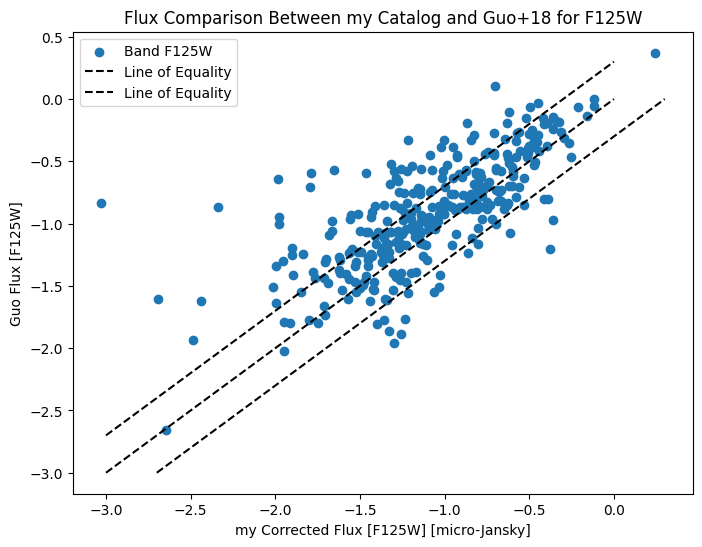

/Users/neal/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/neal/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


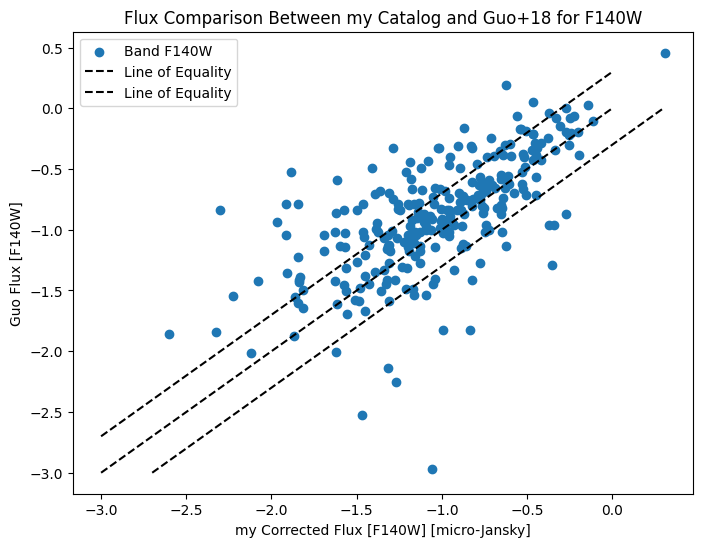

/Users/neal/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


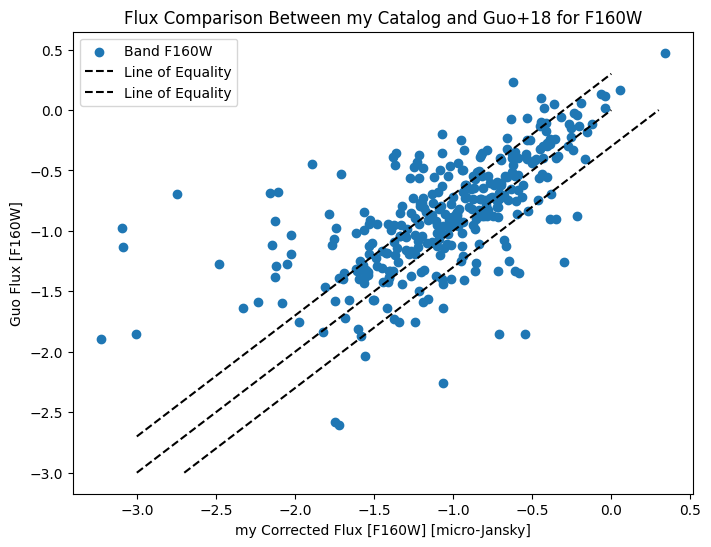

/Users/neal/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


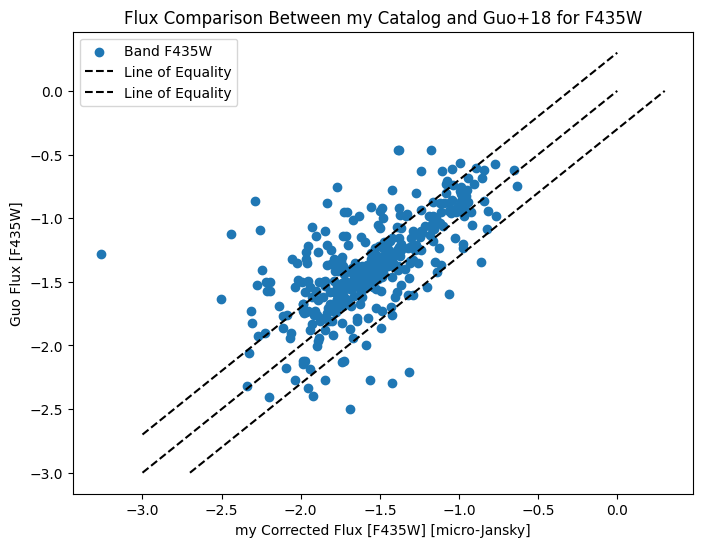

/Users/neal/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


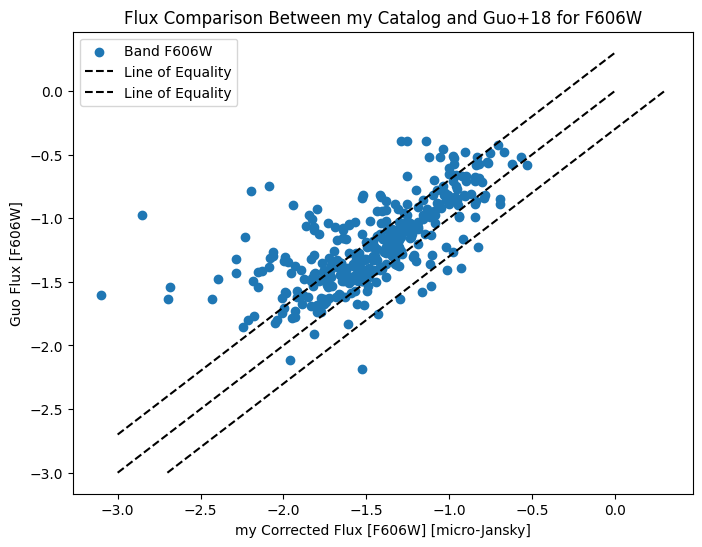

/Users/neal/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


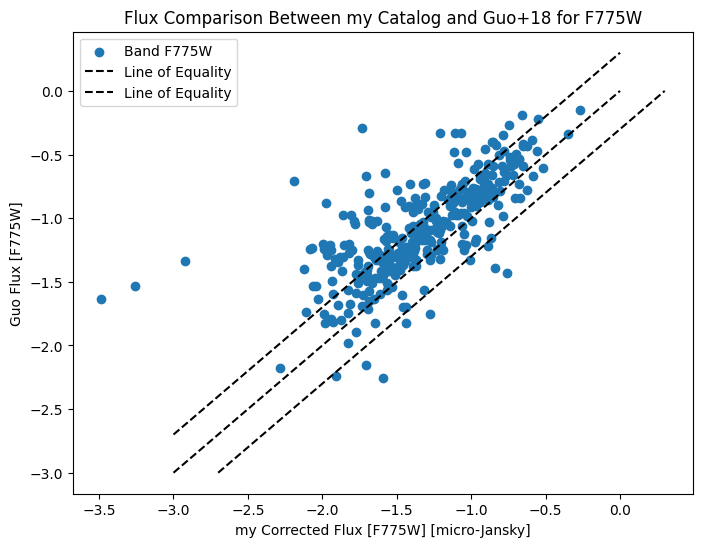

/Users/neal/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


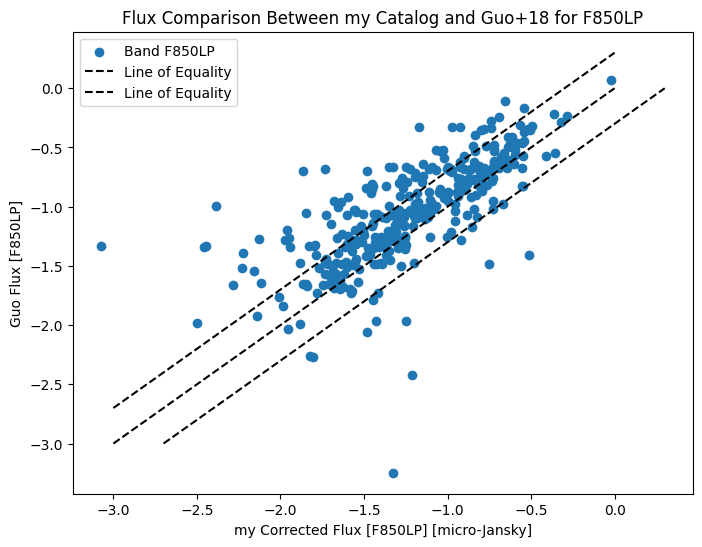

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from astropy.table import Table
# from astropy.io import ascii



# Filter Guo+18 catalog to the section with fiducial background subtraction
# guo_catalog_filtered = guo_catalog.iloc[15965:19158].reset_index(drop=True)
# guo_catalog_filtered = guo_catalog.iloc[9579:12772].reset_index(drop=True)
guo_catalog_filtered = guo_catalog.iloc[12772:15967].reset_index(drop=True)
#guo_catalog_filtered = guo_catalog[guo_catalog['BSC'] == 'bgsub_v4']

# Define the band suffixes formy catalog and the corresponding column names in Guo+18 catalog
bands = {
    'f125w': 'F125W',
    'f140w': 'F140W',
    'f160w': 'F160W',
    # 'f275w': 'F275W', 
    'f435w': 'F435W',
    'f606w': 'F606W',
    'f775w': 'F775W',
    'f850lp': 'F850LP',
}

# Remove the bands that do not exist in Guo's catalog
bands = {k: v for k, v in bands.items() if v in guo_catalog_filtered.columns}

# Check all bands exist inmy catalog
for band_suffix in bands.keys():
   my_flux_col = f'Corrected_Flux_{band_suffix}_mjy'
   assert my_flux_col in my_vandercat_complete.columns, f"Column '{my_flux_col}' not found in my catalog"

# Continue with the rest of the script for matching and plotting...

# Calculate normalized distance for mycatalog (dist_clump/r)
my_vandercat_complete['norm_dist_clump'] =(0.06* my_vandercat_complete['dist_clump']) / my_vandercat_complete['r']

# Set a threshold for the difference in normalized distances for matching
distance_threshold = 0.05

# Create an empty list to store matches
matches = []

# Iterate over my catalog and find matches in Guo's catalog based on CANDELS ID and normalized distance
for index, my_clump in my_vandercat_complete.iterrows():
    candels_id = my_clump['CANDELS_ID']
    norm_dist_my= my_clump['norm_dist_clump']

    # Find potential matches in Guo's catalog
    guo_matches = guo_catalog_filtered[guo_catalog_filtered['Gal'] == candels_id]
    guo_matches['dist_diff'] = (guo_matches['Dist'] - norm_dist_my).abs()

    # Identify the closest match within the threshold
    close_matches = guo_matches[guo_matches['dist_diff'] <= distance_threshold]
    if not close_matches.empty:
        closest_match = close_matches.loc[close_matches['dist_diff'].idxmin()]
        matches.append({
            'my_Catalog_Galaxy_ID': candels_id,
            'my_Clump_ID': index,
            'Guo_Clump_ID': closest_match.name,
            'my_Dist_Norm': norm_dist_my,
            'Guo_Dist_Norm': closest_match['Dist'],
            'Distance_Difference': closest_match['dist_diff']
        })


matches_df = pd.DataFrame(matches)

# Plot the flux comparison for each band
for band_suffix, guo_col_name in bands.items():
    my_flux_col = f'Corrected_Flux_{band_suffix}_mjy'
    
    # Merge matched flux data
    matched_fluxes = pd.merge(matches_df, my_vandercat_complete, left_on='my_Clump_ID', right_index=True)
    matched_fluxes = pd.merge(matched_fluxes, guo_catalog_filtered, left_on='Guo_Clump_ID', right_index=True, suffixes=('_my', '_guo'))

    # Plot myfluxes vs. Guo's for matched clumps
    plt.figure(figsize=(8, 6))
    plt.scatter(np.log10(matched_fluxes[my_flux_col]), np.log10(matched_fluxes[guo_col_name]), label=f'Band {band_suffix.upper()}')
    plt.xlabel(f'my Corrected Flux [{band_suffix.upper()}] [micro-Jansky]')
    plt.ylabel(f'Guo Flux [{guo_col_name}]')
    plt.title(f'Flux Comparison Between my Catalog and Guo+18 for {band_suffix.upper()}')
    plt.plot([-3,0 ], 
             [-3, 0], 'k--', label='Line of Equality')
    plt.plot([-3,0 ], 
             [-2.7, 0.3], 'k--', label='Line of Equality')
    plt.plot([-2.7,0.3 ], 
             [-3, 0], 'k--')
    plt.legend()
    plt.show()



# Add Additional condition:

/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_14561/1753392854.py:54: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  guo_matches['dist_diff'] = (guo_matches['Dist'] - norm_dist_my).abs()
/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_14561/1753392854.py:54: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  guo_matches['dist_diff'] = (guo_matches['Dist'] - norm_dist_my).abs()
/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_14561/1753392854.py:54: SettingWithCopyWarning: 
A valu

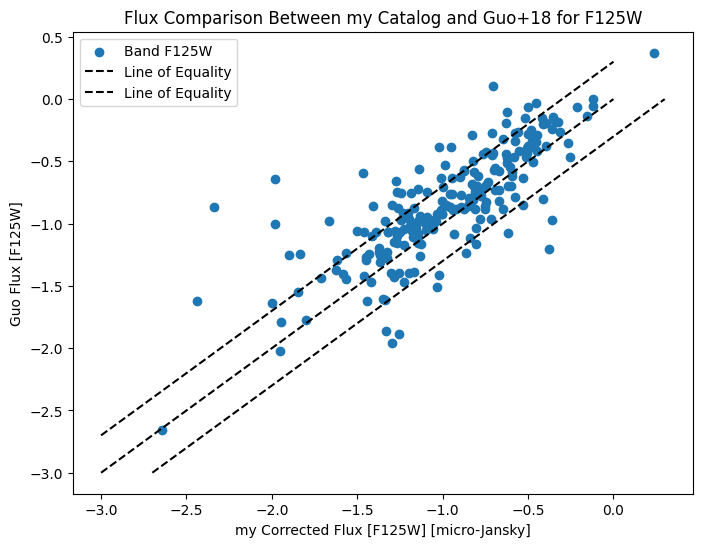

/Users/neal/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/neal/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


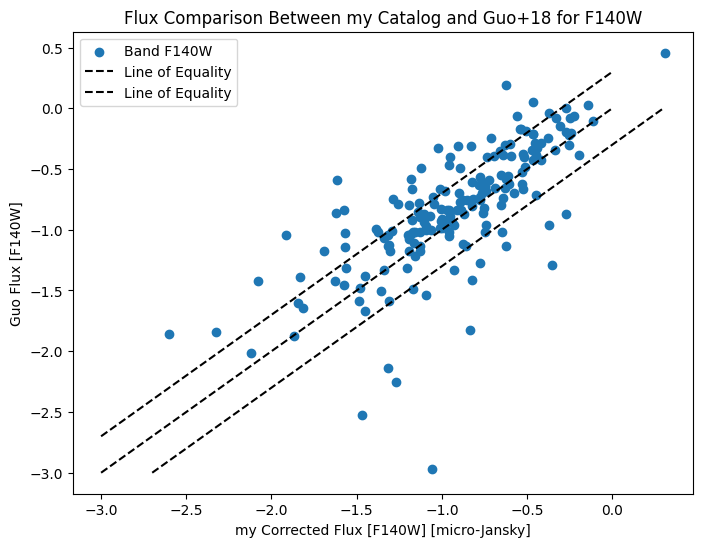

/Users/neal/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


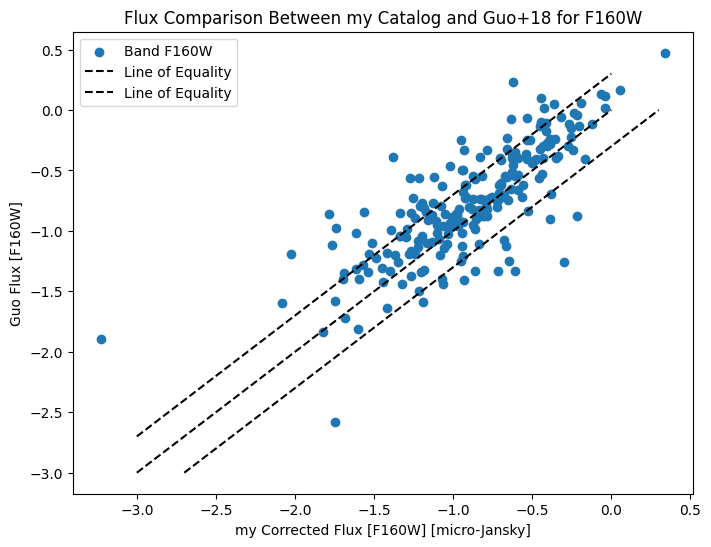

/Users/neal/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


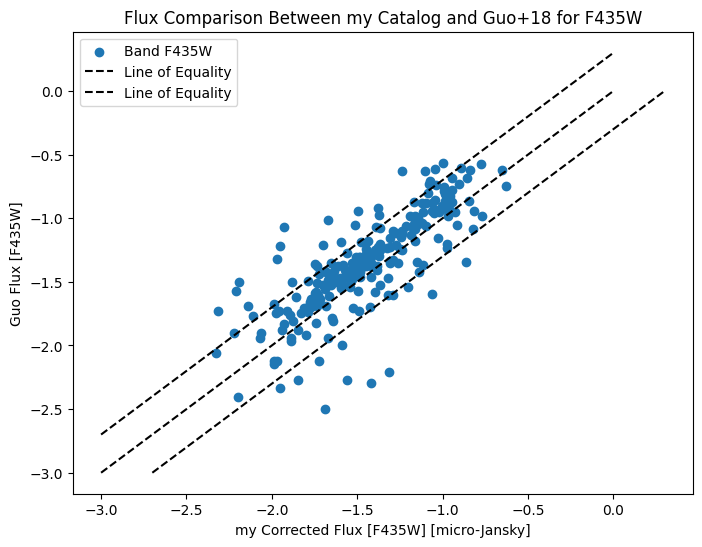

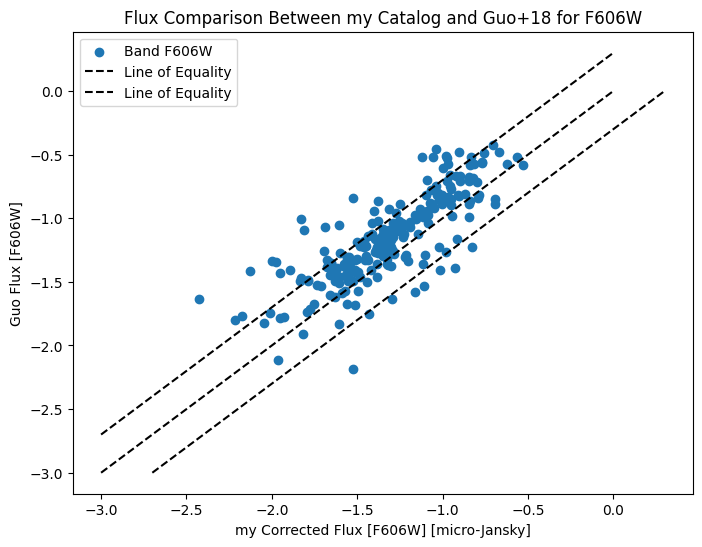

/Users/neal/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


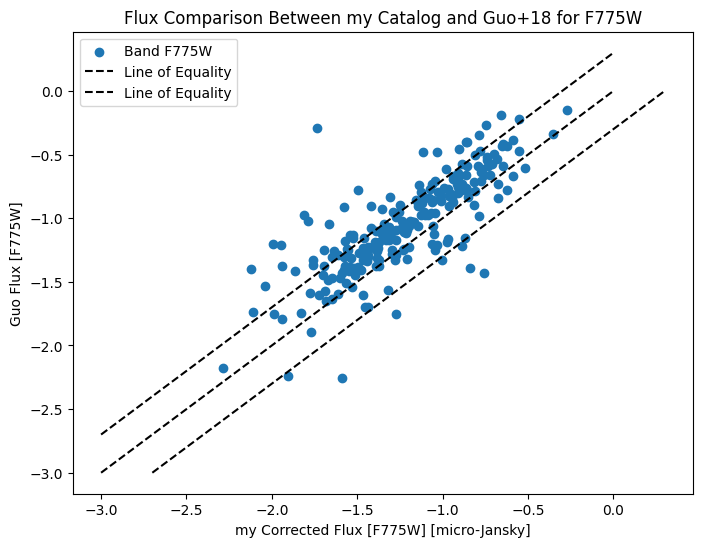

/Users/neal/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


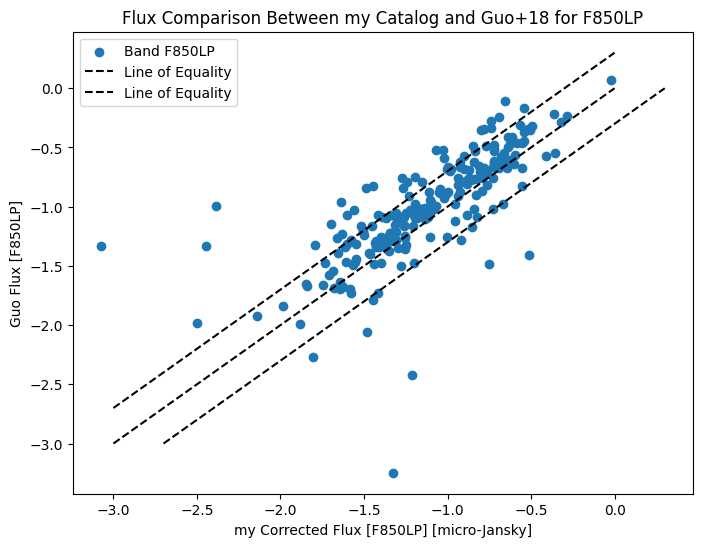

In [12]:
import pandas as pd
import matplotlib.pyplot as plt
from astropy.table import Table
# from astropy.io import ascii

guo_catalog = Table.read('/Users/neal/Downloads/asu-2.fit').to_pandas()

guo_catalog_filtered = guo_catalog.iloc[12772:15967].reset_index(drop=True)

# Define the band suffixes formy catalog and the corresponding column names in Guo+18 catalog
bands = {
    'f125w': 'F125W',
    'f140w': 'F140W',
    'f160w': 'F160W',
    # 'f275w': 'F275W', 
    'f435w': 'F435W',
    'f606w': 'F606W',
    'f775w': 'F775W',
    'f850lp': 'F850LP',
}

# Remove the bands that do not exist in Guo's catalog
bands = {k: v for k, v in bands.items() if v in guo_catalog_filtered.columns}

# Check all bands exist inmy catalog
for band_suffix in bands.keys():
   my_flux_col = f'Corrected_Flux_{band_suffix}_mjy'
   assert my_flux_col in my_vandercat_complete.columns, f"Column '{my_flux_col}' not found in my catalog"

# Continue with the rest of the script for matching and plotting...

# Calculate normalized distance for mycatalog (dist_clump/r)
my_vandercat_complete['norm_dist_clump'] =(0.06* my_vandercat_complete['dist_clump']) / my_vandercat_complete['r']

# Set a threshold for the difference in normalized distances for matching
distance_threshold = 0.05

# Create an empty list to store matches
matches = []

# Iterate over my catalog and find matches in Guo's catalog based on CANDELS ID and normalized distance
for index, my_clump in my_vandercat_complete.iterrows():
    candels_id = my_clump['CANDELS_ID']
    norm_dist_my= my_clump['norm_dist_clump']
    my_flux_ratio = my_clump['flux_ratio']  



    # Only proceed if the flux_ratio is at least 0.05
    if my_flux_ratio >= 0.05:

        # Find potential matches in Guo's catalog
        guo_matches = guo_catalog_filtered[guo_catalog_filtered['Gal'] == candels_id]
        guo_matches['dist_diff'] = (guo_matches['Dist'] - norm_dist_my).abs()

        # Identify the closest match within the threshold
        close_matches = guo_matches[guo_matches['dist_diff'] <= distance_threshold]
        if not close_matches.empty:
            closest_match = close_matches.loc[close_matches['dist_diff'].idxmin()]
            matches.append({
                'my_Catalog_Galaxy_ID': candels_id,
                'my_Clump_ID': index,
                'Guo_Clump_ID': closest_match.name,
                'my_Dist_Norm': norm_dist_my,
                'Guo_Dist_Norm': closest_match['Dist'],
                'Distance_Difference': closest_match['dist_diff']
            })


matches_df = pd.DataFrame(matches)

# Plot the flux comparison for each band
for band_suffix, guo_col_name in bands.items():
    my_flux_col = f'Corrected_Flux_{band_suffix}_mjy'
    
    # Merge matched flux data
    matched_fluxes = pd.merge(matches_df, my_vandercat_complete, left_on='my_Clump_ID', right_index=True)
    matched_fluxes = pd.merge(matched_fluxes, guo_catalog_filtered, left_on='Guo_Clump_ID', right_index=True, suffixes=('_my', '_guo'))

    # Plot myfluxes vs. Guo's for matched clumps
    plt.figure(figsize=(8, 6))
    plt.scatter(np.log10(matched_fluxes[my_flux_col]), np.log10(matched_fluxes[guo_col_name]), label=f'Band {band_suffix.upper()}')
    plt.xlabel(f'my Corrected Flux [{band_suffix.upper()}] [micro-Jansky]')
    plt.ylabel(f'Guo Flux [{guo_col_name}]')
    plt.title(f'Flux Comparison Between my Catalog and Guo+18 for {band_suffix.upper()}')
    plt.plot([-3,0 ], 
             [-3, 0], 'k--', label='Line of Equality')
    plt.plot([-3,0 ], 
             [-2.7, 0.3], 'k--', label='Line of Equality')
    plt.plot([-2.7,0.3 ], 
             [-3, 0], 'k--')
    plt.legend()
    plt.show()



# Add bias and scatter on each plot:

In [26]:
def calculate_nmad(data):
    median = np.median(data)
    abs_dev = np.abs(data - median)
    nmad = np.median(abs_dev) * 1.48
    return nmad

/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_14561/2210660722.py:54: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  guo_matches['dist_diff'] = (guo_matches['Dist'] - norm_dist_my).abs()
/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_14561/2210660722.py:54: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  guo_matches['dist_diff'] = (guo_matches['Dist'] - norm_dist_my).abs()
/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_14561/2210660722.py:54: SettingWithCopyWarning: 
A valu

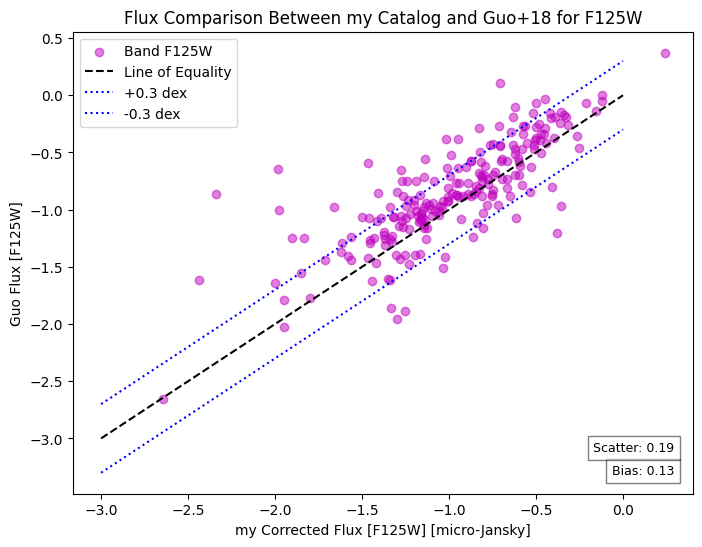

/Users/neal/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/neal/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_14561/2210660722.py:113: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "k--" (-> linestyle='--'). The keyword argument will take precedence.
  plt.plot([-3, 0], [-3, 0], 'k--', label='Line of Equality',linestyle='dashed')
/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_14561/2210660722.py:114: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "k--" (-> linestyle='--'). The keyword argument will take precedence.
  plt.plot([-3, 0], [-2.7, 0.3], 'k--'

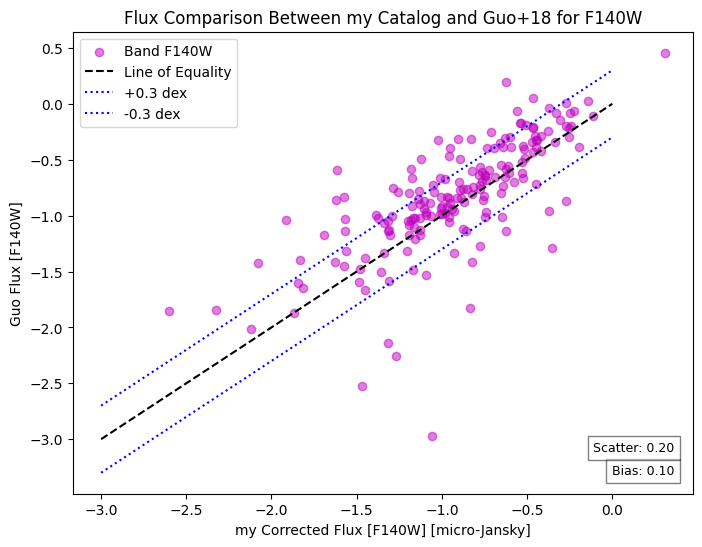

/Users/neal/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_14561/2210660722.py:113: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "k--" (-> linestyle='--'). The keyword argument will take precedence.
  plt.plot([-3, 0], [-3, 0], 'k--', label='Line of Equality',linestyle='dashed')
/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_14561/2210660722.py:114: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "k--" (-> linestyle='--'). The keyword argument will take precedence.
  plt.plot([-3, 0], [-2.7, 0.3], 'k--', label='+0.3 dex',linestyle='dotted',color='b')
/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_14561/2210660722.py:114: UserWarning: color is redundantly defined by the 'col

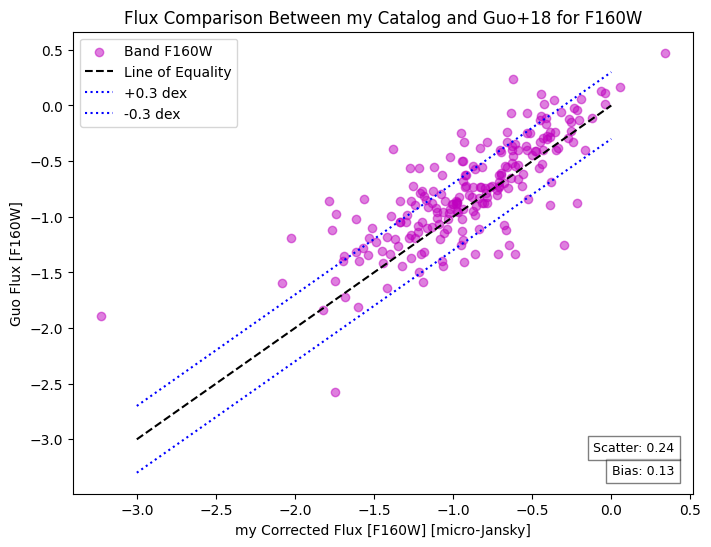

/Users/neal/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_14561/2210660722.py:113: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "k--" (-> linestyle='--'). The keyword argument will take precedence.
  plt.plot([-3, 0], [-3, 0], 'k--', label='Line of Equality',linestyle='dashed')
/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_14561/2210660722.py:114: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "k--" (-> linestyle='--'). The keyword argument will take precedence.
  plt.plot([-3, 0], [-2.7, 0.3], 'k--', label='+0.3 dex',linestyle='dotted',color='b')
/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_14561/2210660722.py:114: UserWarning: color is redundantly defined by the 'co

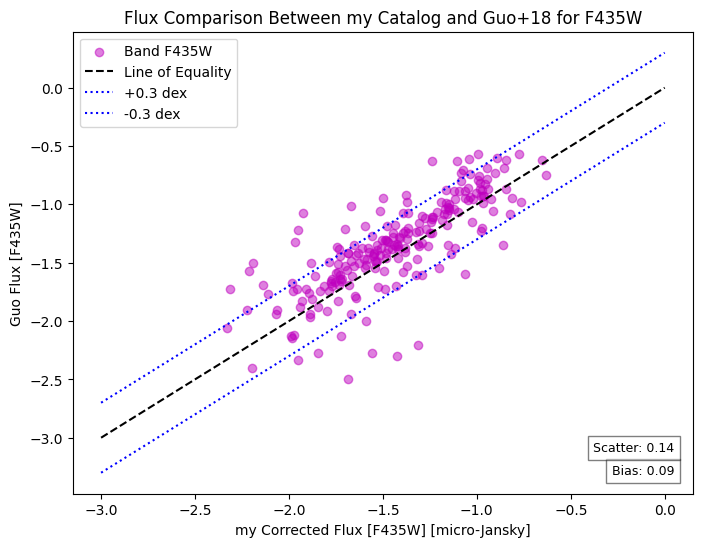

/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_14561/2210660722.py:113: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "k--" (-> linestyle='--'). The keyword argument will take precedence.
  plt.plot([-3, 0], [-3, 0], 'k--', label='Line of Equality',linestyle='dashed')
/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_14561/2210660722.py:114: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "k--" (-> linestyle='--'). The keyword argument will take precedence.
  plt.plot([-3, 0], [-2.7, 0.3], 'k--', label='+0.3 dex',linestyle='dotted',color='b')
/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_14561/2210660722.py:114: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([-3, 0], [-2.7, 0.3], 'k--', label='+0.3 dex',linestyle='dotted',colo

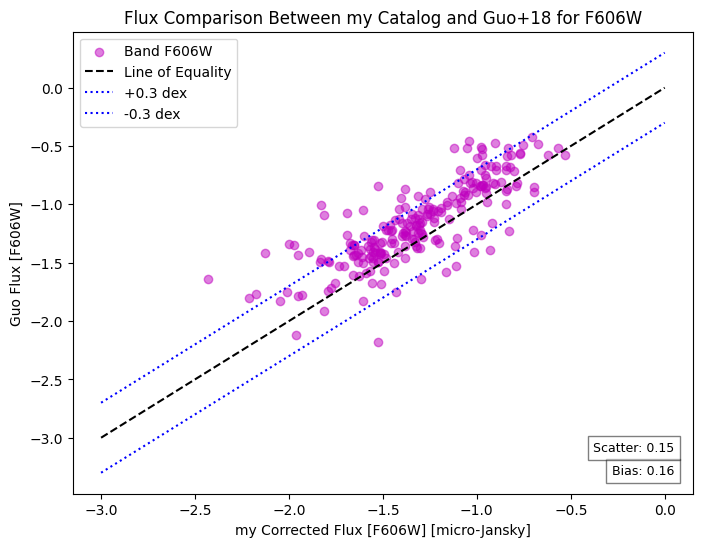

/Users/neal/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_14561/2210660722.py:113: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "k--" (-> linestyle='--'). The keyword argument will take precedence.
  plt.plot([-3, 0], [-3, 0], 'k--', label='Line of Equality',linestyle='dashed')
/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_14561/2210660722.py:114: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "k--" (-> linestyle='--'). The keyword argument will take precedence.
  plt.plot([-3, 0], [-2.7, 0.3], 'k--', label='+0.3 dex',linestyle='dotted',color='b')
/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_14561/2210660722.py:114: UserWarning: color is redundantly defined by the 'col

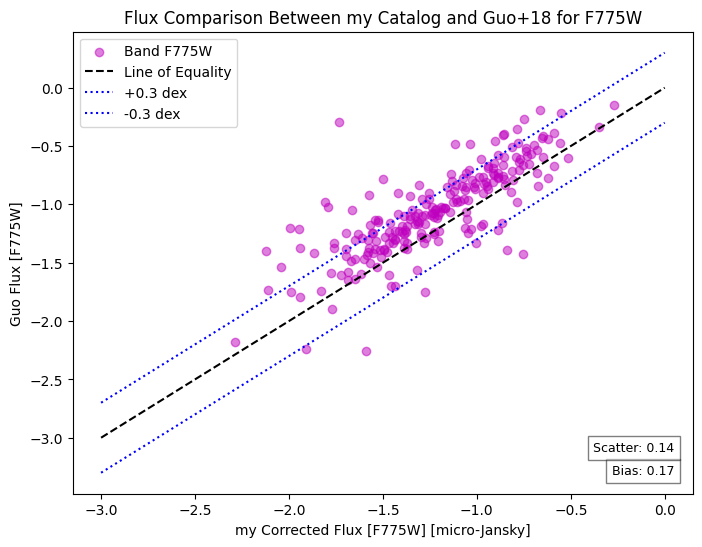

/Users/neal/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_14561/2210660722.py:113: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "k--" (-> linestyle='--'). The keyword argument will take precedence.
  plt.plot([-3, 0], [-3, 0], 'k--', label='Line of Equality',linestyle='dashed')
/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_14561/2210660722.py:114: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "k--" (-> linestyle='--'). The keyword argument will take precedence.
  plt.plot([-3, 0], [-2.7, 0.3], 'k--', label='+0.3 dex',linestyle='dotted',color='b')
/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_14561/2210660722.py:114: UserWarning: color is redundantly defined by the 'col

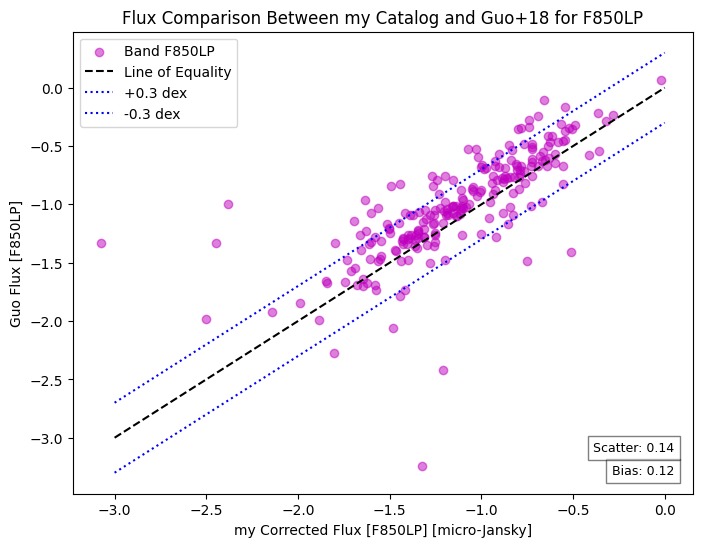

In [35]:
import pandas as pd
import matplotlib.pyplot as plt
from astropy.table import Table
# from astropy.io import ascii

guo_catalog = Table.read('/Users/neal/Downloads/asu-2.fit').to_pandas()

guo_catalog_filtered = guo_catalog.iloc[12772:15967].reset_index(drop=True)

# Define the band suffixes formy catalog and the corresponding column names in Guo+18 catalog
bands = {
    'f125w': 'F125W',
    'f140w': 'F140W',
    'f160w': 'F160W',
    # 'f275w': 'F275W', 
    'f435w': 'F435W',
    'f606w': 'F606W',
    'f775w': 'F775W',
    'f850lp': 'F850LP',
}

# Remove the bands that do not exist in Guo's catalog
bands = {k: v for k, v in bands.items() if v in guo_catalog_filtered.columns}

# Check all bands exist inmy catalog
for band_suffix in bands.keys():
   my_flux_col = f'Corrected_Flux_{band_suffix}_mjy'
   assert my_flux_col in my_vandercat_complete.columns, f"Column '{my_flux_col}' not found in my catalog"



# Calculate normalized distance for mycatalog (dist_clump/r)
my_vandercat_complete['norm_dist_clump'] =(0.06* my_vandercat_complete['dist_clump']) / my_vandercat_complete['r']

# Set a threshold for the difference in normalized distances for matching
distance_threshold = 0.05

# Create an empty list to store matches
matches = []

# Iterate over my catalog and find matches in Guo's catalog based on CANDELS ID and normalized distance
for index, my_clump in my_vandercat_complete.iterrows():
    candels_id = my_clump['CANDELS_ID']
    norm_dist_my= my_clump['norm_dist_clump']
    my_flux_ratio = my_clump['flux_ratio']  



    # Only proceed if the flux_ratio is at least 0.05
    if my_flux_ratio >= 0.05:

        # Find potential matches in Guo's catalog
        guo_matches = guo_catalog_filtered[guo_catalog_filtered['Gal'] == candels_id]
        guo_matches['dist_diff'] = (guo_matches['Dist'] - norm_dist_my).abs()

        # Identify the closest match within the threshold
        close_matches = guo_matches[guo_matches['dist_diff'] <= distance_threshold]
        if not close_matches.empty:
            closest_match = close_matches.loc[close_matches['dist_diff'].idxmin()]
            matches.append({
                'my_Catalog_Galaxy_ID': candels_id,
                'my_Clump_ID': index,
                'Guo_Clump_ID': closest_match.name,
                'my_Dist_Norm': norm_dist_my,
                'Guo_Dist_Norm': closest_match['Dist'],
                'Distance_Difference': closest_match['dist_diff']
            })


matches_df = pd.DataFrame(matches)

def calculate_bias_scatter(matched_fluxes, my_flux_col, guo_col_name):
    # Filter out non-positive values to avoid NaN issues with the log function
    valid_fluxes = matched_fluxes[(matched_fluxes[my_flux_col] > 0) & (matched_fluxes[guo_col_name] > 0)]
    if len(valid_fluxes) == 0:
        return np.nan, np.nan  # Return NaN if no valid fluxes remain after filtering
    diff = np.log10(valid_fluxes[guo_col_name]) - np.log10(valid_fluxes[my_flux_col])
    bias = np.mean(diff)
    scatter = calculate_nmad(diff)
    return bias, scatter

# Plot the flux comparison for each band
for band_suffix, guo_col_name in bands.items():
    my_flux_col = f'Corrected_Flux_{band_suffix}_mjy'
    
    # Merge matched flux data
    matched_fluxes = pd.merge(matches_df, my_vandercat_complete, left_on='my_Clump_ID', right_index=True)
    matched_fluxes = pd.merge(matched_fluxes, guo_catalog_filtered, left_on='Guo_Clump_ID', right_index=True, suffixes=('_my', '_guo'))
    
    # Calculate bias and scatter
    bias, scatter = calculate_bias_scatter(matched_fluxes, my_flux_col, guo_col_name)

    # Plot myfluxes vs. Guo's for matched clumps
    plt.figure(figsize=(8, 6))
    plt.scatter(np.log10(matched_fluxes[my_flux_col]), np.log10(matched_fluxes[guo_col_name]), label=f'Band {band_suffix.upper()}',color='m',alpha=0.5)


   

    
    plt.annotate(f'Bias: {bias:.2f}', xy=(0.97, 0.05), xycoords='axes fraction', 
                 ha='right', va='center', fontsize=9, 
                 bbox=dict(facecolor='white', alpha=0.5))
    plt.annotate(f'Scatter: {scatter:.2f}', xy=(0.97, 0.10), xycoords='axes fraction', 
                 ha='right', va='center', fontsize=9, 
                 bbox=dict(facecolor='white', alpha=0.5))

    plt.xlabel(f'my Corrected Flux [{band_suffix.upper()}] [micro-Jansky]')
    plt.ylabel(f'Guo Flux [{guo_col_name}]')
    plt.title(f'Flux Comparison Between my Catalog and Guo+18 for {band_suffix.upper()}')
    
    # Add the line of equality and other lines if needed
    plt.plot([-3, 0], [-3, 0], 'k--', label='Line of Equality',linestyle='dashed')
    plt.plot([-3, 0], [-2.7, 0.3], 'k--', label='+0.3 dex',linestyle='dotted',color='b')
    plt.plot([-3, 0], [-3.3, -0.3], 'k--', label='-0.3 dex',linestyle='dotted',color='b')
    plt.legend()
    plt.show()

In [ ]:
matched_fluxes

,my_Catalog_Galaxy_ID,my_Clump_ID,Guo_Clump_ID,my_Dist_Norm,Guo_Dist_Norm,Distance_Difference,Unnamed: 0,Field,CANDELS_ID,z_my,...,e_CBmag,CVmag,e_CVmag,logUVSFR,e_logUVSFR,UVE_B-V_,e_UVE_B-V_,VRFlag,BMFlag,EFlag
0,40,6,996,0.431139,0.447,0.015861,6,goodss,40,1.0560,...,0.064,-19.100,0.033,0.00000,0.00000,0.000000e+00,0.000000,0,0,0
1,79,14,0,0.989545,1.038,0.048455,14,goodss,79,1.0120,...,0.184,-17.410,0.083,0.00000,0.00000,0.000000e+00,0.000000,0,0,0
2,79,15,0,0.994684,1.038,0.043316,15,goodss,79,1.0120,...,0.184,-17.410,0.083,0.00000,0.00000,0.000000e+00,0.000000,0,0,0
3,79,16,2,1.859950,1.904,0.044050,16,goodss,79,1.0120,...,0.095,-17.637,0.066,0.00000,0.00000,0.000000e+00,0.000000,0,0,0
4,171,32,11,0.706213,0.711,0.004787,32,goodss,171,0.6202,...,0.042,-17.234,0.045,0.00000,0.00000,0.000000e+00,0.000000,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
220,26255,3940,2716,1.344909,1.347,0.002091,3940,goodss,26255,1.0421,...,0.070,-17.916,0.046,0.00000,0.00000,0.000000e+00,0.000000,0,0,0
221,26355,3971,2720,1.435678,1.438,0.002322,3971,goodss,26355,1.8100,...,0.059,-18.932,0.074,0.18287,0.22095,1.686800e-01,0.063165,0,0,0
222,26355,3973,2723,0.843449,0.869,0.025551,3973,goodss,26355,1.8100,...,0.032,-19.459,0.045,0.63301,0.16433,2.610200e-01,0.047531,0,0,0
223,26554,4002,2732,1.673125,1.692,0.018875,4002,goodss,26554,1.6040,...,0.256,-17.120,0.484,-0.63909,5.11410,4.831600e-02,0.091687,0,0,0


In [ ]:
[print(col) for col in matched_fluxes.columns]

my_Catalog_Galaxy_ID
my_Clump_ID
Guo_Clump_ID
my_Dist_Norm
Guo_Dist_Norm
Distance_Difference
Unnamed: 0
Field
CANDELS_ID
z_my
RA_gal
DEC_gal
A
Clump_ID
dist_clump
flux_ratio
restuv_flux
RA_clump
DEC_clump
Raw_Flux_f125w_mjy
Background_Flux_f125w_mjy
Corrected_Flux_f125w_mjy
Raw_Flux_f160w_mjy
Background_Flux_f160w_mjy
Corrected_Flux_f160w_mjy
Raw_Flux_f275w_mjy
Background_Flux_f275w_mjy
Corrected_Flux_f275w_mjy
Raw_Flux_f435w_mjy
Background_Flux_f435w_mjy
Corrected_Flux_f435w_mjy
Raw_Flux_f606w_mjy
Background_Flux_f606w_mjy
Corrected_Flux_f606w_mjy
Raw_Flux_f775w_mjy
Background_Flux_f775w_mjy
Corrected_Flux_f775w_mjy
Raw_Flux_f850lp_mjy
Background_Flux_f850lp_mjy
Corrected_Flux_f850lp_mjy
Raw_Flux_f140w_mjy
Background_Flux_f140w_mjy
Corrected_Flux_f140w_mjy
Fld
F
ID
W
RAJ2000_my
DEJ2000_my
Q
mag
e_mag
r
e_r
n
e_n
q_lc
e_q
PA
e_PA
S_N
COSMOS
GOODS
recno
GroupID
GroupSize
Separation
norm_dist_clump
Gal
RAGdeg
DEGdeg
z_guo
logM_
e_logM_
logSFR
e_logSFR
GUmag
GVmag
GJmag
Rad
e_Rad
CID
RAJ2

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

# Find the outliers:

In [ ]:
large_flux_difference = matched_fluxes[matched_fluxes['F160W'] >= 10 * matched_fluxes['Corrected_Flux_f160w_mjy']]

# Display the filtered DataFrame
print(large_flux_difference)

     my_Catalog_Galaxy_ID  my_Clump_ID  Guo_Clump_ID  my_Dist_Norm  \
4                     171           32            11      0.706213   
10                    528           92          1042      3.249132   
11                    528           95          1042      3.304966   
20                    792          158          1084      1.206550   
33                   1442          304          2778      1.310097   
44                   2551          501          1204      1.931590   
56                   3207          646          1245      1.144055   
60                   3475          700          2838      1.321051   
72                   3996          815          1333      1.193101   
139                  8740         1505          1613      1.913004   
140                  8902         1523          1631      1.669413   
141                  8902         1524          1632      1.373893   
154                 10457         1715          1680      1.221242   
157                 

# Take a look at the images:

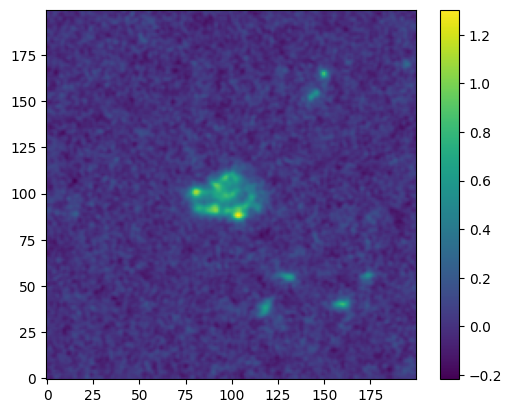

In [ ]:
image_hdu=fits.open('/Users/neal/Documents/PhD/projects/SED-fitting/Clump/Cutouts_galaxies/goodss_792_f435w_images.fits')
science_image = image_hdu[0].data
wcs_435 = WCS(image_hdu[0].header)
image_hdu.close()
plt.imshow(np.arcsinh(science_image / 0.01), origin='lower')
plt.colorbar()
plt.show()

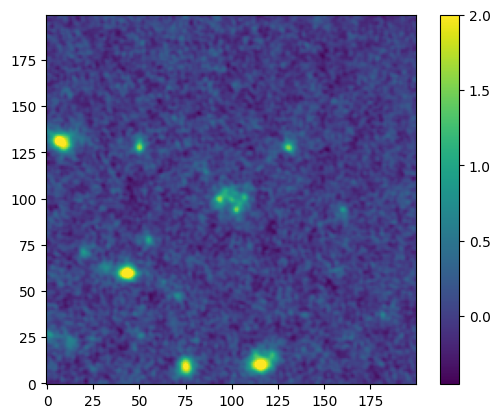

In [ ]:
image_hdu=fits.open('/Users/neal/Documents/PhD/projects/SED-fitting/Clump/Cutouts_galaxies/goodss_1442_f606w_images.fits')
science_image = image_hdu[0].data
wcs_435 = WCS(image_hdu[0].header)
image_hdu.close()
plt.imshow(np.arcsinh(science_image / 0.01), origin='lower', vmax=2)
plt.colorbar()
plt.show()

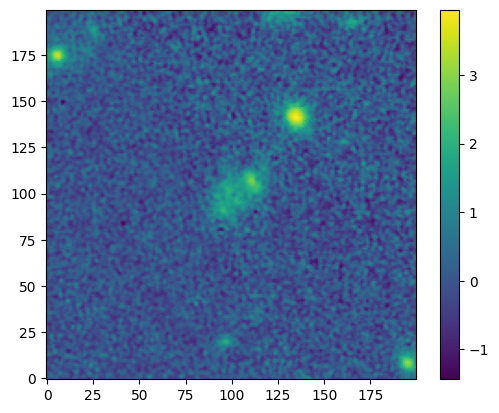

In [ ]:
image_hdu=fits.open('/Users/neal/Documents/PhD/projects/SED-fitting/Clump/Cutouts_galaxies/goodss_1270_f125w_images.fits')
science_image = image_hdu[0].data
wcs_435 = WCS(image_hdu[0].header)
image_hdu.close()
plt.imshow(np.arcsinh(science_image / 0.01), origin='lower')
plt.colorbar()
plt.show()

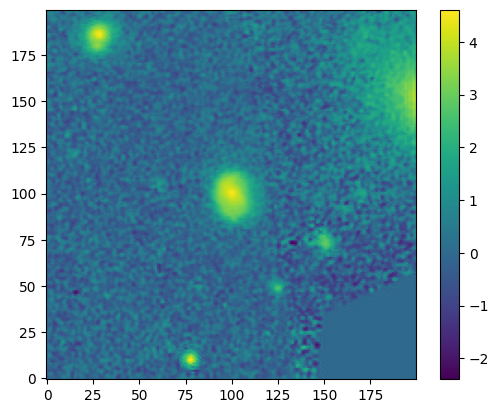

In [ ]:
image_hdu=fits.open('/Users/neal/Documents/PhD/projects/SED-fitting/Clump/Cutouts_galaxies/goodss_1785_f125w_images.fits')
science_image = image_hdu[0].data
wcs_435 = WCS(image_hdu[0].header)
image_hdu.close()
plt.imshow(np.arcsinh(science_image / 0.01), origin='lower')
plt.colorbar()
plt.show()

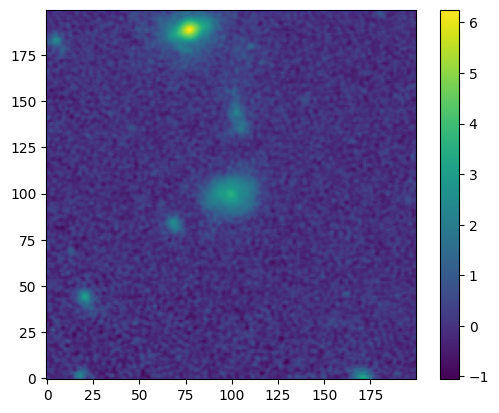

In [ ]:
image_hdu=fits.open('/Users/neal/Documents/PhD/projects/SED-fitting/Clump/Cutouts_galaxies/goodss_3790_f125w_images.fits')
science_image = image_hdu[0].data
wcs_435 = WCS(image_hdu[0].header)
image_hdu.close()
plt.imshow(np.arcsinh(science_image / 0.01), origin='lower')
plt.colorbar()
plt.show()

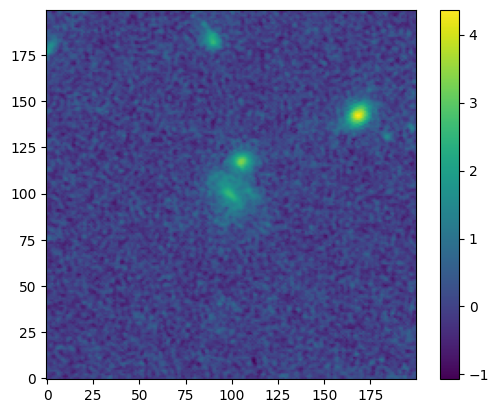

In [ ]:
image_hdu=fits.open('/Users/neal/Documents/PhD/projects/SED-fitting/Clump/Cutouts_galaxies/goodss_3996_f125w_images.fits')
science_image = image_hdu[0].data
wcs_435 = WCS(image_hdu[0].header)
image_hdu.close()
plt.imshow(np.arcsinh(science_image / 0.01), origin='lower')
plt.colorbar()
plt.show()

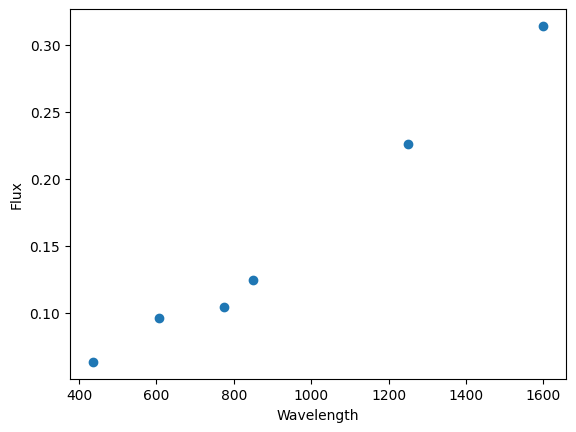

In [ ]:

ten_clump = my_vandercat_complete.iloc[200]

# WL
wavelengths = {
    'f125w': 1250,
    'f140w': 1400,
    'f160w': 1600,
    'f435w': 435,
    'f606w': 606,
    'f775w': 775,
    'f850lp': 850
}


band_wavelengths = {band: wavelengths[band] for band in bands.keys()}

# Get flux data for the first clump
fluxes = [ten_clump[f'Corrected_Flux_{band}_mjy'] for band in band_wavelengths.keys()]

# Plot

plt.scatter(band_wavelengths.values(), fluxes)
plt.xlabel('Wavelength')
plt.ylabel('Flux')
plt.show()


In [ ]:
matches_df

,my_Catalog_Galaxy_ID,my_Clump_ID,Guo_Clump_ID,my_Dist_Norm,Guo_Dist_Norm,Distance_Difference
0,40,4,999,1.820483,1.892,0.071517
1,40,5,998,0.823156,0.725,0.098156
2,40,6,996,0.431139,0.447,0.015861
3,40,8,999,1.978160,1.892,0.086160
4,79,14,0,0.989545,1.038,0.048455
...,...,...,...,...,...,...
618,26554,4003,2733,1.491554,1.485,0.006554
619,26554,4004,2734,1.382240,1.453,0.070760
620,26554,4005,2732,1.660756,1.692,0.031244
621,26732,4036,3188,0.712896,0.736,0.023104


# NMAD:?

In [ ]:
import numpy as np

def compute_nmad(data):
    median = np.median(data)
    deviations = np.abs(data - median)
    nmad = 1.4826 * np.median(deviations)
    return nmad

# Initialize a dictionary to store NMAD values for each band
nmad_values = {}

# Merge matched flux data once for all 
merged_data = pd.merge(matches_df, my_vandercat_complete, left_on='my_Clump_ID', right_index=True)
merged_data = pd.merge(merged_data, guo_catalog_filtered, left_on='Guo_Clump_ID', right_index=True, suffixes=('_my', '_guo'))

# Compute NMAD for each band
for band_suffix, guo_col_name in bands.items():
    my_flux_col = f'Corrected_Flux_{band_suffix}_mjy'
    
    # Calculate flux differences
    merged_data['flux_difference'] = merged_data[my_flux_col] - merged_data[guo_col_name]

    # Calculate NMAD for the flux differences
    nmad = compute_nmad(merged_data['flux_difference'])
    nmad_values[band_suffix] = nmad

# Output the NMAD values for each band
print("NMAD values for each band:")
for band, value in nmad_values.items():
    print(f"{band}: {value}")


NMAD values for each band:
f125w: 0.0595911511297475
f140w: nan
f160w: 0.07569266404281667
f435w: nan
f606w: 0.02469703808822289
f775w: 0.03162629637681631
f850lp: 0.03586159591873715


In [ ]:
merged_data

,my_Catalog_Galaxy_ID,my_Clump_ID,Guo_Clump_ID,my_Dist_Norm,Guo_Dist_Norm,Distance_Difference,Unnamed: 0,Field,CANDELS_ID,z_my,...,CVmag,e_CVmag,logUVSFR,e_logUVSFR,UVE_B-V_,e_UVE_B-V_,VRFlag,BMFlag,EFlag,flux_difference
0,40,4,999,1.820483,1.892,0.071517,4,goodss,40,1.056,...,-15.333,0.943,0.00000,0.00000,0.000000e+00,0.000000,1,0,0,0.033488
3,40,8,999,1.978160,1.892,0.086160,8,goodss,40,1.056,...,-15.333,0.943,0.00000,0.00000,0.000000e+00,0.000000,1,0,0,0.056985
1,40,5,998,0.823156,0.725,0.098156,5,goodss,40,1.056,...,-18.785,0.038,0.00000,0.00000,0.000000e+00,0.000000,0,0,0,-0.062253
2,40,6,996,0.431139,0.447,0.015861,6,goodss,40,1.056,...,-19.100,0.033,0.00000,0.00000,0.000000e+00,0.000000,0,0,0,-0.143319
4,79,14,0,0.989545,1.038,0.048455,14,goodss,79,1.012,...,-17.410,0.083,0.00000,0.00000,0.000000e+00,0.000000,0,0,0,-0.096011
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
620,26554,4005,2732,1.660756,1.692,0.031244,4005,goodss,26554,1.604,...,-17.120,0.484,-0.63909,5.11410,4.831600e-02,0.091687,0,0,0,-0.013470
618,26554,4003,2733,1.491554,1.485,0.006554,4003,goodss,26554,1.604,...,-17.502,0.318,0.11656,0.39492,2.467900e-01,0.109140,0,0,0,-0.024091
619,26554,4004,2734,1.382240,1.453,0.070760,4004,goodss,26554,1.604,...,-16.919,0.580,-0.43758,0.88992,1.058100e-01,0.114540,0,0,0,-0.011305
621,26732,4036,3188,0.712896,0.736,0.023104,4036,goodss,26732,2.617,...,-19.275,0.133,-0.14630,5.93160,-6.758200e-07,0.043031,0,0,0,-0.011765


# Without 1.5:

In [ ]:
def automated_photometry(clumps, wcs, science_image,phot_zp, mask_aperture_size=0.24, annulus_inner=0.24, annulus_outer=0.36):
    results = []

    # Convert the science image to a floating point array if not already
    science_image = np.array(science_image, dtype=float)

    # Iterates over each clump
    for index, target_clump in clumps.iterrows():
        # Check if the target clump has valid coordinates. Skips processing if the DEC value of the clump is set to a (-99.0), 
        # which indicates invalid or missing data.
        if target_clump['DEC_clump'] == -99.0:
            print(f"Skipping clump due to invalid coordinates: {target_clump['CANDELS_ID']}, {target_clump['Clump_ID']}")
            continue

        # Converts the RA and DEC of the target clump to a SkyCoord object
        target_coords = SkyCoord(ra=target_clump['RA_clump']*u.degree, dec=target_clump['DEC_clump']*u.degree)

        # Creates a copy of the original image to mask out other clumps, 
        # so that they do not affect the photometry of the target clump.
        science_image_masked = np.copy(science_image)

        # Mask other clumps only if more than one clump is present, (by setting their pixel values to 0)
        if len(clumps) > 1:
            for _, other_clump in clumps.drop(index).iterrows():
                other_coords = SkyCoord(ra=other_clump['RA_clump']*u.degree, dec=other_clump['DEC_clump']*u.degree)
                mask_aperture = SkyCircularAperture(other_coords, r=mask_aperture_size*u.arcsec).to_pixel(wcs)
                mask = mask_aperture.to_mask(method='center')
                # Generates slices for numpy array indexing using the bounding box of the mask.
                bbox_slices = (slice(mask.bbox.iymin, mask.bbox.iymax), slice(mask.bbox.ixmin, mask.bbox.ixmax))
                # Accesses the section of the image to mask out.
                science_image_masked_section = science_image_masked[bbox_slices]
                mask_data = mask.data.astype(bool)
                # Applies the mask to the image 
                science_image_masked_section[mask_data] = 0
                science_image_masked[bbox_slices] = science_image_masked_section
            # #plot mask
            # plt.imshow(science_image_masked)
            # plt.show()


        # Perform photometry on the target clump
        target_aperture = SkyCircularAperture(target_coords, r=0.18*u.arcsec).to_pixel(wcs)
        photometry = aperture_photometry(science_image_masked, target_aperture)

        # Check if photometry result is unexpected!(We get this since some images in some bands are just black)
        if photometry['aperture_sum'][0] == 0:
            print(f"Zero flux detected for clump: {target_clump['CANDELS_ID']}, {target_clump['Clump_ID']}")
            

        # Background subtraction
        annulus_aperture = SkyCircularAnnulus(target_coords, r_in=annulus_inner*u.arcsec, r_out=annulus_outer*u.arcsec).to_pixel(wcs)
        background = aperture_photometry(science_image_masked, annulus_aperture)
        area_annulus = annulus_aperture.area
        # Calculates the average background flux per pixel within the annulus
        background_per_pixel = background['aperture_sum'][0] / area_annulus
        # Scales the average background to the aperture size
        total_background_light = background_per_pixel * target_aperture.area
        corrected_flux = (photometry['aperture_sum'][0] - total_background_light) # aperture correction



        raw_flux_mjy = (photometry['aperture_sum'][0] * phot_zp) * 1e6  # Convert from Jy to μJy
        background_flux_mjy = (total_background_light * phot_zp) * 1e6
        corrected_flux_mjy = (corrected_flux * phot_zp) * 1e6

        # Appends the results for this clump 
        results.append({
            'CANDELS_ID': target_clump['CANDELS_ID'],
            'Clump_ID': target_clump['Clump_ID'],
            'Raw_Flux_mjy': raw_flux_mjy,
            'Background_Flux_mjy': background_flux_mjy,
            'Corrected_Flux_mjy': corrected_flux_mjy
        })
    # Converts the results list into a DataFrame
    return pd.DataFrame(results)


In [ ]:
# Load the catalog
clump_catalog_path = '/Users/neal/Documents/PhD/projects/SED-fitting/Clump/results/catalog_n/goodsslast.csv'
clump_catalog = pd.read_csv(clump_catalog_path)

In [ ]:
import os

# List of bands 
bands = ['f125w', 'f140w', 'f160w', 'f275w', 'f435w', 'f606w', 'f775w', 'f850lp']

# Initialize a dictionary to hold the WCS objects and science image data for each band
wcs_dict = {band: {} for band in bands}
image_data_dict = {band: {} for band in bands}
phot_zp_dict ={band: {} for band in bands}

# Populate the dictionaries with WCS and image data for each band and galaxy
for candels_id in clump_catalog['CANDELS_ID'].unique():

    # if candels_id == 40:
    #     pass
    # else:
    #     continue

    for band in bands:
        fits_path = f'/Users/neal/Documents/PhD/projects/SED-fitting/Clump/Cutouts_galaxies/goodss_{candels_id}_{band}_images.fits'
        
        # Check if the FITS file exists
        if os.path.exists(fits_path):
            with fits.open(fits_path) as hdul:
                wcs_dict[band][candels_id] = WCS(hdul[0].header)
                image_data_dict[band][candels_id] = hdul[0].data


                # Read the conversion factor from the header
                if 'PHOT_ZP' in hdul[0].header:
                    phot_zp_dict[band][candels_id] = hdul[0].header['PHOT_ZP']
                else:
                    print(f"PHOT_ZP keyword not found in header of {fits_path}. Using default value.")
                    # phot_zp_dict[candels_id] = default_phot_zp  # Use a default value or handle as appropriate
                    phot_zp_dict[(candels_id, band)] = phot_zp

# Perform photometry for each band and galaxy, and add results to the catalog
for candels_id in clump_catalog['CANDELS_ID'].unique():
    galaxy_clumps = clump_catalog[(clump_catalog['CANDELS_ID'] == candels_id) & (clump_catalog['DEC_clump'] <= 90) & (clump_catalog['DEC_clump'] >= -90)].copy()
    
    for band in bands:
        # Check if the galaxy has data in this band
        if candels_id in wcs_dict[band] and candels_id in image_data_dict[band]:
            wcs = wcs_dict[band][candels_id]
            science_image = image_data_dict[band][candels_id]
            phot_zp = phot_zp_dict[band][candels_id]  # Get the photometric zero point for the current band and galaxy

            # Check if the science image is not empty or  black
            if not np.all(science_image == 0):
                photometry_results = automated_photometry(galaxy_clumps, wcs, science_image,phot_zp)
                
                #  Update the original clump_catalog with the converted flux results
                for index, row in photometry_results.iterrows():
                    mask = (clump_catalog['CANDELS_ID'] == row['CANDELS_ID']) & (clump_catalog['Clump_ID'] == row['Clump_ID'])
                    clump_catalog.loc[mask, f'Raw_Flux_{band}_mjy'] = row['Raw_Flux_mjy']
                    clump_catalog.loc[mask, f'Background_Flux_{band}_mjy'] = row['Background_Flux_mjy']
                    clump_catalog.loc[mask, f'Corrected_Flux_{band}_mjy'] = row['Corrected_Flux_mjy']

# Save the updated clump catalog with photometry results
clump_catalog.to_csv('/Users/neal/Documents/PhD/projects/SED-fitting/Clump/results/withouth1.5_microjansky_multi_band_photometry_results.csv', index=False)


Zero flux detected for clump: 18, 1
Zero flux detected for clump: 18, 2
Zero flux detected for clump: 172, 1
Zero flux detected for clump: 263, 1
Zero flux detected for clump: 263, 2
Zero flux detected for clump: 263, 3
Zero flux detected for clump: 3575, 1
Zero flux detected for clump: 3575, 4
Zero flux detected for clump: 3776, 1
Zero flux detected for clump: 3776, 2
Zero flux detected for clump: 4956, 1
Zero flux detected for clump: 4956, 2
Zero flux detected for clump: 5159, 1
Zero flux detected for clump: 5159, 2
Zero flux detected for clump: 5159, 3
Zero flux detected for clump: 5159, 4
Zero flux detected for clump: 6588, 1
Zero flux detected for clump: 6588, 2
Zero flux detected for clump: 6588, 3
Zero flux detected for clump: 6588, 4
Zero flux detected for clump: 6588, 5
Zero flux detected for clump: 6588, 6
Zero flux detected for clump: 6588, 7
Zero flux detected for clump: 7021, 1
Zero flux detected for clump: 7466, 1
Zero flux detected for clump: 7466, 2
Zero flux detected f

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from astropy.table import Table
# from astropy.io import ascii



# Filter Guo+18 catalog to the section with fiducial background subtraction
# guo_catalog_filtered = guo_catalog.iloc[15965:19158].reset_index(drop=True)
# guo_catalog_filtered = guo_catalog.iloc[9579:12772].reset_index(drop=True)
guo_catalog_filtered = guo_catalog.iloc[12772:15967].reset_index(drop=True)
#guo_catalog_filtered = guo_catalog[guo_catalog['BSC'] == 'bgsub_v4']

# Define the band suffixes formy catalog and the corresponding column names in Guo+18 catalog
bands = {
    'f125w': 'F125W',
    'f140w': 'F140W',
    'f160w': 'F160W',
    # 'f275w': 'F275W', 
    'f435w': 'F435W',
    'f606w': 'F606W',
    'f775w': 'F775W',
    'f850lp': 'F850LP',
}

# Remove the bands that do not exist in Guo's catalog
bands = {k: v for k, v in bands.items() if v in guo_catalog_filtered.columns}

# Check all bands exist inmy catalog
for band_suffix in bands.keys():
   my_flux_col = f'Corrected_Flux_{band_suffix}_mjy'
   assert my_flux_col in my_vandercat_complete.columns, f"Column '{my_flux_col}' not found in my catalog"

# Continue with the rest of the script for matching and plotting...

# Calculate normalized distance for mycatalog (dist_clump/r)
my_vandercat_complete['norm_dist_clump'] =(0.06* my_vandercat_complete['dist_clump']) / my_vandercat_complete['r']

# Set a threshold for the difference in normalized distances for matching
distance_threshold = 0.1

# Create an empty list to store matches
matches = []

# Iterate over my catalog and find matches in Guo's catalog based on CANDELS ID and normalized distance
for index, my_clump in my_vandercat_complete.iterrows():
    candels_id = my_clump['CANDELS_ID']
    norm_dist_my= my_clump['norm_dist_clump']

    # Find potential matches in Guo's catalog
    guo_matches = guo_catalog_filtered[guo_catalog_filtered['Gal'] == candels_id]
    guo_matches['dist_diff'] = (guo_matches['Dist'] - norm_dist_my).abs()

    # Identify the closest match within the threshold
    close_matches = guo_matches[guo_matches['dist_diff'] <= distance_threshold]
    if not close_matches.empty:
        closest_match = close_matches.loc[close_matches['dist_diff'].idxmin()]
        matches.append({
            'my_Catalog_Galaxy_ID': candels_id,
            'my_Clump_ID': index,
            'Guo_Clump_ID': closest_match.name,
            'my_Dist_Norm': norm_dist_my,
            'Guo_Dist_Norm': closest_match['Dist'],
            'Distance_Difference': closest_match['dist_diff']
        })


matches_df = pd.DataFrame(matches)

# Plot the flux comparison for each band
for band_suffix, guo_col_name in bands.items():
    my_flux_col = f'Corrected_Flux_{band_suffix}_mjy'
    
    # Merge matched flux data
    matched_fluxes = pd.merge(matches_df, my_vandercat_complete, left_on='my_Clump_ID', right_index=True)
    matched_fluxes = pd.merge(matched_fluxes, guo_catalog_filtered, left_on='Guo_Clump_ID', right_index=True, suffixes=('_my', '_guo'))

    # Plot myfluxes vs. Guo's for matched clumps
    plt.figure(figsize=(8, 6))
    plt.scatter(np.log10(matched_fluxes[my_flux_col]), np.log10(matched_fluxes[guo_col_name]), label=f'Band {band_suffix.upper()}')
    plt.xlabel(f'my Corrected Flux [{band_suffix.upper()}] [micro-Jansky]')
    plt.ylabel(f'Guo Flux [{guo_col_name}]')
    plt.title(f'Flux Comparison Between my Catalog and Guo+18 for {band_suffix.upper()}')
    plt.plot([-3,0 ], 
             [-3, 0], 'k--', label='Line of Equality')
    plt.plot([-3,0 ], 
             [-2.7, 0.3], 'k--', label='Line of Equality')
    plt.plot([-2.7,0.3 ], 
             [-3, 0], 'k--')
    plt.legend()
    plt.show()



In [ ]:
phot_zp_dict

{'f125w': {40: 1.15097454169191e-07},
 'f140w': {40: 9.5292464e-08},
 'f160w': {40: 1.5053973e-07},
 'f275w': {40: 7.76331976666666e-07},
 'f435w': {40: 1.93389146670262e-07},
 'f606w': {40: 9.19489282721315e-08},
 'f775w': {40: 1.94359405207791e-07},
 'f850lp': {40: 4.19781326250537e-07}}

# Checking the f140 photzp:

In [ ]:
image_hdu=fits.open('/Users/neal/Documents/PhD/projects/SED-fitting/Clump/Cutouts_galaxies/goodss_31_f140w_images.fits')
science_image_2 = image_hdu[0].data
wcs_435 = WCS(image_hdu[0].header)
image_hdu.close()

In [ ]:
ex_data= goodss[(goodss['CANDELS_ID'] == 31) & (goodss['Clump_ID'] == 1)]
ex_data_2= goodss[(goodss['CANDELS_ID'] == 31) & (goodss['Clump_ID'] == 2)]

/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_15019/1185394103.py:8: DeprecationWarning: `photutils.SkyCircularAperture` is a deprecated alias for `photutils.aperture.SkyCircularAperture` and will be removed in the future. Instead, please use `from photutils.aperture import SkyCircularAperture` to silence this warning.
  aper_sky_1 = photutils.SkyCircularAperture(positions=coords1, r=0.18 * u.arcsec)
/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_15019/1185394103.py:11: DeprecationWarning: `photutils.SkyCircularAperture` is a deprecated alias for `photutils.aperture.SkyCircularAperture` and will be removed in the future. Instead, please use `from photutils.aperture import SkyCircularAperture` to silence this warning.
  aper_sky_2 = photutils.SkyCircularAperture(positions=coords2, r=0.18 * u.arcsec)


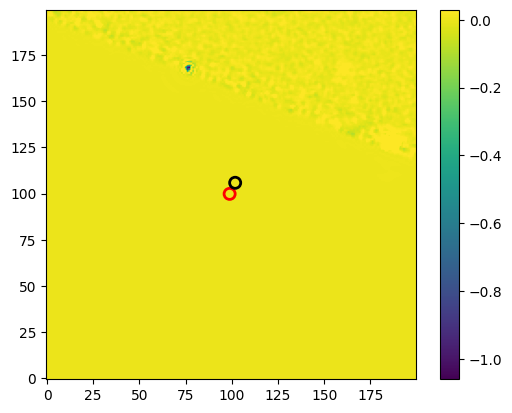

In [ ]:
# Selecting the RA and DEC of the clump
radec_clump1 =ex_data[['RA_clump', 'DEC_clump']]
radec_clump2 =ex_data_2[['RA_clump', 'DEC_clump']]

coords1 = SkyCoord(ra=radec_clump1['RA_clump'], dec=radec_clump1['DEC_clump'], unit='deg')

coords2 = SkyCoord(ra=radec_clump2['RA_clump'], dec=radec_clump2['DEC_clump'], unit='deg')
aper_sky_1 = photutils.SkyCircularAperture(positions=coords1, r=0.18 * u.arcsec)
aper_1 = aper_sky_1.to_pixel(wcs=wcs_435)

aper_sky_2 = photutils.SkyCircularAperture(positions=coords2, r=0.18 * u.arcsec)
aper_2 = aper_sky_2.to_pixel(wcs=wcs_435)



plt.imshow(science_image_2, origin='lower', vmax=0.03)
plt.colorbar()

aper_1.plot(color="red", lw=2., fill=False)

aper_2.plot(color="black", lw=2., fill=False)


plt.show()


In [ ]:
#  Function to check for significant pixels around a clump
def check_significant_pixels(image_data, wcs, clump_coords, threshold=3, box_size=5):
    # Convert clump sky coordinates to pixel coordinates
    clump_pixel_coords = wcs.world_to_pixel(clump_coords)
    x, y = int(clump_pixel_coords[0]), int(clump_pixel_coords[1])
    
    # Create a small box around the clump
    x_min = max(0, x - box_size)
    x_max = min(image_data.shape[1], x + box_size + 1)
    y_min = max(0, y - box_size)
    y_max = min(image_data.shape[0], y + box_size + 1)
    
    # Check the pixel values within this box
    box_data = image_data[y_min:y_max, x_min:x_max]
    return np.any(box_data > threshold)

# Automated photometry function with significant pixel check
def automated_photometry(clumps, wcs, science_image, phot_zp, 
                         mask_aperture_size=0.24, annulus_inner=0.24, annulus_outer=0.36,
                         significance_threshold=3, box_size=5):
    results = []
    # Convert the science image to a floating point array if not already
    science_image = np.array(science_image, dtype=float)

    # Iterates over each clump
    for index, target_clump in clumps.iterrows():
        # Skip if DEC is -99, indicating invalid data
        if target_clump['DEC_clump'] == -99.0:
            continue
        
        # Converts the RA and DEC of the target clump to a SkyCoord object
        target_coords = SkyCoord(ra=target_clump['RA_clump']*u.degree, dec=target_clump['DEC_clump']*u.degree)
        
        # Check for significant pixels around the clump
        if not check_significant_pixels(science_image, wcs, target_coords,
                                        threshold=significance_threshold, box_size=box_size):
            print(f"Skipping clump due to lack of significant pixels: {target_clump['CANDELS_ID']}, {target_clump['Clump_ID']}")
            continue
        # Converts the RA and DEC of the target clump to a SkyCoord object
        target_coords = SkyCoord(ra=target_clump['RA_clump']*u.degree, dec=target_clump['DEC_clump']*u.degree)

        # Creates a copy of the original image to mask out other clumps, 
        # so that they do not affect the photometry of the target clump.
        science_image_masked = np.copy(science_image)

        # Mask other clumps only if more than one clump is present, (by setting their pixel values to 0)
        if len(clumps) > 1:
            for _, other_clump in clumps.drop(index).iterrows():
                other_coords = SkyCoord(ra=other_clump['RA_clump']*u.degree, dec=other_clump['DEC_clump']*u.degree)
                mask_aperture = SkyCircularAperture(other_coords, r=mask_aperture_size*u.arcsec).to_pixel(wcs)
                mask = mask_aperture.to_mask(method='center')
                # Generates slices for numpy array indexing using the bounding box of the mask.
                bbox_slices = (slice(mask.bbox.iymin, mask.bbox.iymax), slice(mask.bbox.ixmin, mask.bbox.ixmax))
                # Accesses the section of the image to mask out.
                science_image_masked_section = science_image_masked[bbox_slices]
                mask_data = mask.data.astype(bool)
                # Applies the mask to the image 
                science_image_masked_section[mask_data] = 0
                science_image_masked[bbox_slices] = science_image_masked_section

        # Perform photometry on the target clump
        target_aperture = SkyCircularAperture(target_coords, r=0.18*u.arcsec).to_pixel(wcs)
        photometry = aperture_photometry(science_image_masked, target_aperture)

        # Check if photometry result is unexpected!(We get this since some images in some bands are just black)
        if photometry['aperture_sum'][0] == 0:
            print(f"Zero flux detected for clump: {target_clump['CANDELS_ID']}, {target_clump['Clump_ID']}")
            

        # Background subtraction
        annulus_aperture = SkyCircularAnnulus(target_coords, r_in=annulus_inner*u.arcsec, r_out=annulus_outer*u.arcsec).to_pixel(wcs)
        background = aperture_photometry(science_image_masked, annulus_aperture)
        area_annulus = annulus_aperture.area
        # Calculates the average background flux per pixel within the annulus
        background_per_pixel = background['aperture_sum'][0] / area_annulus
        # Scales the average background to the aperture size
        total_background_light = background_per_pixel * target_aperture.area
        corrected_flux = photometry['aperture_sum'][0] - total_background_light



        raw_flux_mjy = (photometry['aperture_sum'][0] * phot_zp) * 1e6  # Convert from Jy to μJy
        background_flux_mjy = (total_background_light * phot_zp) * 1e6
        corrected_flux_mjy = (corrected_flux * phot_zp) * 1e6

        # Appends the results for this clump 
        results.append({
            'CANDELS_ID': target_clump['CANDELS_ID'],
            'Clump_ID': target_clump['Clump_ID'],
            'Raw_Flux_mjy': raw_flux_mjy,
            'Background_Flux_mjy': background_flux_mjy,
            'Corrected_Flux_mjy': corrected_flux_mjy
        })
    # Converts the results list into a DataFrame
    return pd.DataFrame(results)


In [ ]:
# Initialize dictionaries
wcs_dict = {}
image_data_dict = {}
phot_zp_dict={}

# Loop through each galaxy ID in the catalog
for candels_id in clump_catalog['CANDELS_ID'].unique():
    
    fits_path = f'/Users/neal/Documents/PhD/projects/SED-fitting/Clump/Cutouts_galaxies/goodss_{candels_id}_f435w_images.fits'
    
    # Load the FITS file
    with fits.open(fits_path) as hdul:
        # Create the WCS object from the header
        wcs_dict[candels_id] = WCS(hdul[0].header)
        # Load the science image data
        image_data_dict[candels_id] = hdul[0].data

NameError: name 'clump_catalog' is not defined

In [ ]:
import os

# List of bands 
bands = ['f125w', 'f140w', 'f160w', 'f275w', 'f435w', 'f606w', 'f775w', 'f850lp']

# Initialize a dictionary to hold the WCS objects and science image data for each band
wcs_dict = {band: {} for band in bands}
image_data_dict = {band: {} for band in bands}

# Populate the dictionaries with WCS and image data for each band and galaxy
for candels_id in clump_catalog['CANDELS_ID'].unique():
    for band in bands:
        fits_path = f'/Users/neal/Documents/PhD/projects/SED-fitting/Clump/Cutouts_galaxies/goodss_{candels_id}_{band}_images.fits'
        
        # Check if the FITS file exists
        if os.path.exists(fits_path):
            with fits.open(fits_path) as hdul:
                wcs_dict[band][candels_id] = WCS(hdul[0].header)
                image_data_dict[band][candels_id] = hdul[0].data


                # Read the conversion factor from the header
                if 'PHOT_ZP' in hdul[0].header:
                    phot_zp_dict[candels_id] = hdul[0].header['PHOT_ZP']
                else:
                    print(f"PHOT_ZP keyword not found in header of {fits_path}. Using default value.")
                    # phot_zp_dict[candels_id] = default_phot_zp  # Use a default value or handle as appropriate
                    phot_zp_dict[(candels_id, band)] = phot_zp

# Perform photometry for each band and galaxy, and add results to the catalog
for candels_id in clump_catalog['CANDELS_ID'].unique():
    galaxy_clumps = clump_catalog[(clump_catalog['CANDELS_ID'] == candels_id) & (clump_catalog['DEC_clump'] <= 90) & (clump_catalog['DEC_clump'] >= -90)].copy()
    
    for band in bands:
        # Check if the galaxy has data in this band
        if candels_id in wcs_dict[band] and candels_id in image_data_dict[band]:
            wcs = wcs_dict[band][candels_id]
            science_image = image_data_dict[band][candels_id]
            phot_zp = phot_zp_dict[candels_id]  # Get the photometric zero point for the current band and galaxy

            # Check if the science image is not empty or  black
            if not np.all(science_image == 0):
                photometry_results = automated_photometry(galaxy_clumps, wcs, science_image,phot_zp)
                
                #  Update the original clump_catalog with the converted flux results
                for index, row in photometry_results.iterrows():
                    mask = (clump_catalog['CANDELS_ID'] == row['CANDELS_ID']) & (clump_catalog['Clump_ID'] == row['Clump_ID'])
                    clump_catalog.loc[mask, f'Raw_Flux_{band}_mjy'] = row['Raw_Flux_mjy']
                    clump_catalog.loc[mask, f'Background_Flux_{band}_mjy'] = row['Background_Flux_mjy']
                    clump_catalog.loc[mask, f'Corrected_Flux_{band}_mjy'] = row['Corrected_Flux_mjy']

# Save the updated clump catalog with photometry results
clump_catalog.to_csv('/Users/neal/Documents/PhD/projects/SED-fitting/Clump/results/updated_microjansky_multi_band_photometry_results.csv', index=False)


Skipping clump due to lack of significant pixels: 18, 1
Skipping clump due to lack of significant pixels: 18, 2
Skipping clump due to lack of significant pixels: 18, 1
Skipping clump due to lack of significant pixels: 18, 2
Skipping clump due to lack of significant pixels: 18, 1
Skipping clump due to lack of significant pixels: 18, 2
Skipping clump due to lack of significant pixels: 18, 1
Skipping clump due to lack of significant pixels: 18, 2
Skipping clump due to lack of significant pixels: 18, 1
Skipping clump due to lack of significant pixels: 18, 2
Skipping clump due to lack of significant pixels: 18, 1
Skipping clump due to lack of significant pixels: 18, 2
Skipping clump due to lack of significant pixels: 18, 1
Skipping clump due to lack of significant pixels: 18, 2
Skipping clump due to lack of significant pixels: 31, 1
Skipping clump due to lack of significant pixels: 31, 2
Skipping clump due to lack of significant pixels: 31, 1
Skipping clump due to lack of significant pixels

## Checking the second issue:

In [ ]:
image_hdu=fits.open('/Users/neal/Documents/PhD/projects/SED-fitting/Clump/Cutouts_galaxies/goodss_18_f275w_images.fits')
science_image_2 = image_hdu[0].data
wcs_435 = WCS(image_hdu[0].header)
image_hdu.close()

/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_15019/302452065.py:12: DeprecationWarning: `photutils.SkyCircularAperture` is a deprecated alias for `photutils.aperture.SkyCircularAperture` and will be removed in the future. Instead, please use `from photutils.aperture import SkyCircularAperture` to silence this warning.
  aper_sky_1 = photutils.SkyCircularAperture(positions=coords1, r=0.18 * u.arcsec)
/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_15019/302452065.py:15: DeprecationWarning: `photutils.SkyCircularAperture` is a deprecated alias for `photutils.aperture.SkyCircularAperture` and will be removed in the future. Instead, please use `from photutils.aperture import SkyCircularAperture` to silence this warning.
  aper_sky_2 = photutils.SkyCircularAperture(positions=coords2, r=0.18 * u.arcsec)


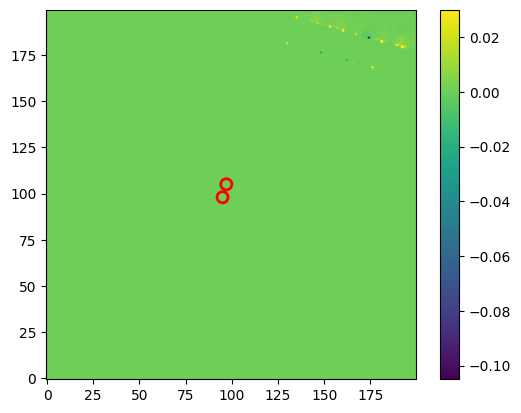

In [ ]:
ex_data= goodss[(goodss['CANDELS_ID'] == 18) & (goodss['Clump_ID'] == 1)]
ex_data_2= goodss[(goodss['CANDELS_ID'] == 18) & (goodss['Clump_ID'] == 2)]


# Selecting the RA and DEC of the clump
radec_clump1 =ex_data[['RA_clump', 'DEC_clump']]
radec_clump2 =ex_data_2[['RA_clump', 'DEC_clump']]

coords1 = SkyCoord(ra=radec_clump1['RA_clump'], dec=radec_clump1['DEC_clump'], unit='deg')

coords2 = SkyCoord(ra=radec_clump2['RA_clump'], dec=radec_clump2['DEC_clump'], unit='deg')
aper_sky_1 = photutils.SkyCircularAperture(positions=coords1, r=0.18 * u.arcsec)
aper_1 = aper_sky_1.to_pixel(wcs=wcs_435)

aper_sky_2 = photutils.SkyCircularAperture(positions=coords2, r=0.18 * u.arcsec)
aper_2 = aper_sky_2.to_pixel(wcs=wcs_435)



plt.imshow(science_image_2, origin='lower', vmax=0.03)
plt.colorbar()

aper_1.plot(color="red", lw=2., fill=False)

aper_2.plot(color="red", lw=2., fill=False)


plt.show()




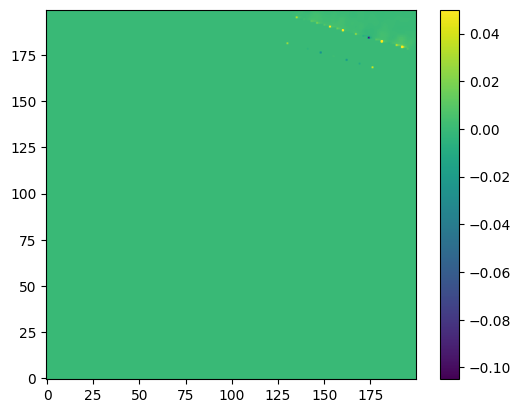

In [ ]:
plt.imshow(science_image_2, origin='lower', vmax=0.05)
plt.colorbar()
plt.show()

/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_15019/1505482013.py:12: DeprecationWarning: `photutils.SkyCircularAperture` is a deprecated alias for `photutils.aperture.SkyCircularAperture` and will be removed in the future. Instead, please use `from photutils.aperture import SkyCircularAperture` to silence this warning.
  aper_sky_1 = photutils.SkyCircularAperture(positions=coords1, r=0.18 * u.arcsec)
/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_15019/1505482013.py:15: DeprecationWarning: `photutils.SkyCircularAperture` is a deprecated alias for `photutils.aperture.SkyCircularAperture` and will be removed in the future. Instead, please use `from photutils.aperture import SkyCircularAperture` to silence this warning.
  aper_sky_2 = photutils.SkyCircularAperture(positions=coords2, r=0.18 * u.arcsec)


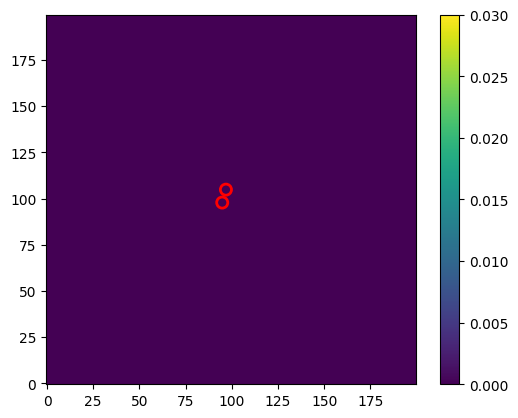

In [ ]:
ex_data= goodss[(goodss['CANDELS_ID'] == 18) & (goodss['Clump_ID'] == 1)]
ex_data_2= goodss[(goodss['CANDELS_ID'] == 18) & (goodss['Clump_ID'] == 2)]


# Selecting the RA and DEC of the clump
radec_clump1 =ex_data[['RA_clump', 'DEC_clump']]
radec_clump2 =ex_data_2[['RA_clump', 'DEC_clump']]

coords1 = SkyCoord(ra=radec_clump1['RA_clump'], dec=radec_clump1['DEC_clump'], unit='deg')

coords2 = SkyCoord(ra=radec_clump2['RA_clump'], dec=radec_clump2['DEC_clump'], unit='deg')
aper_sky_1 = photutils.SkyCircularAperture(positions=coords1, r=0.18 * u.arcsec)
aper_1 = aper_sky_1.to_pixel(wcs=wcs_435)

aper_sky_2 = photutils.SkyCircularAperture(positions=coords2, r=0.18 * u.arcsec)
aper_2 = aper_sky_2.to_pixel(wcs=wcs_435)



plt.imshow(science_image, origin='lower', vmax=0.03)
plt.colorbar()

aper_1.plot(color="red", lw=2., fill=False)

aper_2.plot(color="red", lw=2., fill=False)


plt.show()




In [ ]:
image_hdu=fits.open('/Users/neal/Documents/PhD/projects/SED-fitting/Clump/Cutouts_galaxies/goodss_18_f140w_images.fits')
science_image_3 = image_hdu[0].data
wcs_435 = WCS(image_hdu[0].header)
image_hdu.close()

/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_15019/1679671270.py:12: DeprecationWarning: `photutils.SkyCircularAperture` is a deprecated alias for `photutils.aperture.SkyCircularAperture` and will be removed in the future. Instead, please use `from photutils.aperture import SkyCircularAperture` to silence this warning.
  aper_sky_1 = photutils.SkyCircularAperture(positions=coords1, r=0.18 * u.arcsec)
/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_15019/1679671270.py:15: DeprecationWarning: `photutils.SkyCircularAperture` is a deprecated alias for `photutils.aperture.SkyCircularAperture` and will be removed in the future. Instead, please use `from photutils.aperture import SkyCircularAperture` to silence this warning.
  aper_sky_2 = photutils.SkyCircularAperture(positions=coords2, r=0.18 * u.arcsec)


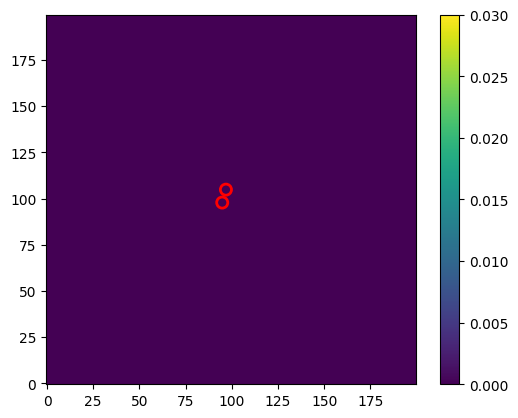

In [ ]:
ex_data= goodss[(goodss['CANDELS_ID'] == 18) & (goodss['Clump_ID'] == 1)]
ex_data_2= goodss[(goodss['CANDELS_ID'] == 18) & (goodss['Clump_ID'] == 2)]


# Selecting the RA and DEC of the clump
radec_clump1 =ex_data[['RA_clump', 'DEC_clump']]
radec_clump2 =ex_data_2[['RA_clump', 'DEC_clump']]

coords1 = SkyCoord(ra=radec_clump1['RA_clump'], dec=radec_clump1['DEC_clump'], unit='deg')

coords2 = SkyCoord(ra=radec_clump2['RA_clump'], dec=radec_clump2['DEC_clump'], unit='deg')
aper_sky_1 = photutils.SkyCircularAperture(positions=coords1, r=0.18 * u.arcsec)
aper_1 = aper_sky_1.to_pixel(wcs=wcs_435)

aper_sky_2 = photutils.SkyCircularAperture(positions=coords2, r=0.18 * u.arcsec)
aper_2 = aper_sky_2.to_pixel(wcs=wcs_435)



plt.imshow(science_image_3, origin='lower', vmax=0.03)
plt.colorbar()

aper_1.plot(color="red", lw=2., fill=False)

aper_2.plot(color="red", lw=2., fill=False)


plt.show()




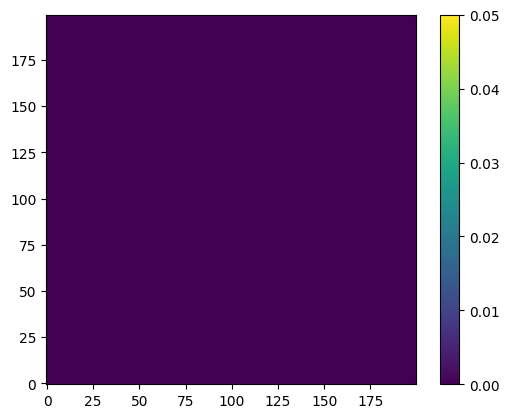

In [ ]:
plt.imshow(science_image_3, origin='lower', vmax=0.05)
plt.colorbar()
plt.show()

### TRYING to match my cat with GUO:

In [ ]:
from astropy.table import Table
import pandas as pd
guo_clumps_table = Table.read('/Users/neal/Downloads/asu-2.fit')

# Convert to a pandas DataFrame
guo_clumps = guo_clumps_table.to_pandas()

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import ascii

my_catalog= ascii.read('/Users/neal/Documents/PhD/projects/SED-fitting/Clump/results/multi_band_photometry_results.csv')
my_catalog =my_catalog.to_pandas()
# Let's add the normalized Distance column

my_catalog['norm_dist_clump'] = my_catalog['dist_clump'] / my_catalog['A']

# Assuming guo_clumps is the Guo+18 catalog already loaded and filtered from row 3193 onwards
# And it contains a column 'dist' which is the normalized distance

# Set a threshold for matching the normalized distances, you may need to adjust this
distance_threshold = 0.05  # This is an example threshold

matches = []  # To store the matches

# Iterate over my catalog
for idx, my_clump in my_catalog.iterrows():
    candels_id = my_clump['CANDELS_ID']
    my_norm_dist = my_clump['norm_dist_clump']

    # Get the subset of Guo's clumps that match the CANDELS_ID
    guo_subset = guo_clumps[guo_clumps['Gal'] == candels_id]

    # Find the closest match in Guo's catalog based on the normalized distance
    guo_subset['dist_diff'] = guo_subset['Dist'].sub(my_norm_dist).abs()
    closest_match = guo_subset.loc[guo_subset['dist_diff'].idxmin()]

    # Check if the closest match is within the acceptable threshold
    if closest_match['dist_diff'] <= distance_threshold:
        match_info = {
            'my_Clump_ID': my_clump['Clump_ID'],
            'Guo_Clump_ID': closest_match.name,  # The index of the match in Guo's catalog
            'Distance_Difference': closest_match['dist_diff']
        }
        matches.append(match_info)

# Convert matches to a DataFrame
matches_df = pd.DataFrame(matches)

# Now you can use matches_df to further analyze or plot my data
# For example, to plot my fluxes against the Guo+ fluxes for the matched clumps:

# Placeholder for actual flux columns
my_flux_column = 'Corrected_Flux_f125w'
guo_flux_column = 'F125W'

# Join my catalog with the matches to get the flux values
matched_fluxes = matches_df.join(my_catalog.set_index('Clump_ID'), on='my_Clump_ID')
matched_fluxes = matched_fluxes.join(guo_clumps.set_index(guo_clumps.index), on='Guo_Clump_ID', rsuffix='_guo')

# Plot
plt.scatter(matched_fluxes[my_flux_column], matched_fluxes[guo_flux_column+'_guo'])
plt.xlabel('Corrected_Flux_f125w')
plt.ylabel('F125W')
plt.title('Flux Comparison')
plt.show()


/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_15019/1301146628.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  guo_subset['dist_diff'] = guo_subset['Dist'].sub(your_norm_dist).abs()
/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_15019/1301146628.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  guo_subset['dist_diff'] = guo_subset['Dist'].sub(your_norm_dist).abs()
/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_15019/1301146628.py:29: SettingWithCopyWarning: 
A va

ValueError: attempt to get argmin of an empty sequence

In [ ]:
print(type(my_catalog))

<class 'astropy.table.table.Table'>


# Trying to fix the error:

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import ascii

# Assuming guo_clumps is loaded correctly as a pandas DataFrame
# and 'Dist' and 'Gal' columns exist in guo_clumps


my_catalog= ascii.read('/Users/neal/Documents/PhD/projects/SED-fitting/Clump/results/microjansky_multi_band_photometry_results.csv')
my_catalog = my_catalog.to_pandas()


from astropy.table import Table
import pandas as pd
guo_clumps_table = Table.read('/Users/neal/Downloads/asu-2.fit')

# Convert to a pandas DataFrame
guo_clumps = guo_clumps_table.to_pandas()

# Filter Guo+18 catalog from row 3193 onwards and reset index if necessary
guo_clumps = guo_clumps.iloc[3193:].reset_index(drop=True)

# Assuming the 'Dist' column in Guo's catalog represents the normalized distance



# Calculate normalized distance in my catalog
my_catalog['norm_dist_clump'] = my_catalog['dist_clump'] / my_catalog['A']

# Set a threshold for the difference in normalized distances
distance_threshold = 0.05

matches = []  # Initialize a list to store matches

# Iterate over each clump in my catalog
for idx, my_clump in my_catalog.iterrows():
    candels_id = my_clump['CANDELS_ID']
    my_norm_dist = my_clump['norm_dist_clump']

    # Filter Guo's catalog for the current CANDELS_ID
    guo_subset = guo_clumps[guo_clumps['Gal'] == candels_id]

    if not guo_subset.empty:
        # Calculate the absolute difference in normalized distances
        guo_subset['dist_diff'] = np.abs(guo_subset['Dist'] - my_norm_dist)

        # Find the Guo clump with the smallest distance difference
        closest_idx = guo_subset['dist_diff'].idxmin()
        closest_diff = guo_subset.loc[closest_idx, 'dist_diff']

        # Check if the closest match is within the threshold
        if closest_diff <= distance_threshold:
            # If yes, append to matches
            matches.append({
                'my_Clump_ID': idx,  # or my_clump['Clump_ID'] if it exists
                'Guo_Clump_ID': closest_idx,
                'Distance_Difference': closest_diff
            })

# Convert matches list to DataFrame
matches_df = pd.DataFrame(matches)


/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_13140/1464761587.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  guo_subset['dist_diff'] = np.abs(guo_subset['Dist'] - your_norm_dist)
/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_13140/1464761587.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  guo_subset['dist_diff'] = np.abs(guo_subset['Dist'] - your_norm_dist)
/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_13140/1464761587.py:50: SettingWithCopyWarning: 
A valu

In [ ]:
print(matches)

[{'Your_Clump_ID': 6, 'Guo_Clump_ID': 998, 'Distance_Difference': 0.03431736647049405}, {'Your_Clump_ID': 8, 'Guo_Clump_ID': 1001, 'Distance_Difference': 0.0014796993138537218}, {'Your_Clump_ID': 14, 'Guo_Clump_ID': 2, 'Distance_Difference': 0.035781343508422214}, {'Your_Clump_ID': 15, 'Guo_Clump_ID': 2, 'Distance_Difference': 0.04163326402911571}, {'Your_Clump_ID': 17, 'Guo_Clump_ID': 2, 'Distance_Difference': 0.02546667901110622}, {'Your_Clump_ID': 19, 'Guo_Clump_ID': 5, 'Distance_Difference': 0.010607135550711133}, {'Your_Clump_ID': 21, 'Guo_Clump_ID': 8, 'Distance_Difference': 0.046573392751494413}, {'Your_Clump_ID': 22, 'Guo_Clump_ID': 8, 'Distance_Difference': 0.03315422750828123}, {'Your_Clump_ID': 33, 'Guo_Clump_ID': 13, 'Distance_Difference': 0.01028090759813094}, {'Your_Clump_ID': 65, 'Guo_Clump_ID': 1028, 'Distance_Difference': 0.04963523363460853}, {'Your_Clump_ID': 66, 'Guo_Clump_ID': 1028, 'Distance_Difference': 0.035683699560556614}, {'Your_Clump_ID': 68, 'Guo_Clump_ID':

In [ ]:
print(guo_clumps.columns)  # Check if 'F125W' is a column

Index(['Gal', 'RAGdeg', 'DEGdeg', 'z', 'logM_', 'e_logM_', 'logSFR',
       'e_logSFR', 'GUmag', 'GVmag', 'GJmag', 'Rad', 'e_Rad', 'CID', 'RAJ2000',
       'DEJ2000', 'Det', 'fLUV', 'BSC', 'F435W', 'e_F435W', 'F606W', 'e_F606W',
       'F775W', 'e_F775W', 'F814W', 'e_F814W', 'F850LP', 'e_F850LP', 'F105W',
       'e_F105W', 'F125W', 'e_F125W', 'F140W', 'e_F140W', 'F160W', 'e_F160W',
       'Dist', 'zphot', 'q_zphot', 'CMass', 'b_CMass', 'b_cmass_lc', 'CSFR',
       'b_CSFR', 'b_csfr_lc', 'E_B-V_', 'b_E_B-V_', 'b_e_b-v__lc', 'logAge',
       'b_logAge', 'b_logage_lc', 'logtau', 'b_logtau', 'b_logtau_lc', 'CUmag',
       'e_CUmag', 'CBmag', 'e_CBmag', 'CVmag', 'e_CVmag', 'logUVSFR',
       'e_logUVSFR', 'UVE_B-V_', 'e_UVE_B-V_', 'VRFlag', 'BMFlag', 'EFlag'],
      dtype='object')


In [ ]:
print(matched_fluxes.columns)  # Check the resulting columns after join


NameError: name 'matched_fluxes' is not defined

In [ ]:
my_flux_column = 'Corrected_Flux_f125w'
guo_flux_column = 'F125W'

# Join  catalog with the matches to get the flux values
matched_fluxes = matches_df.join(my_catalog.set_index('Clump_ID'), on='my_Clump_ID')
matched_fluxes = matched_fluxes.join(guo_clumps.set_index(guo_clumps.index), on='Guo_Clump_ID', rsuffix='_guo')

# Plot
plt.scatter(matched_fluxes[my_flux_column], matched_fluxes[guo_flux_column])
plt.xlabel('Corrected_Flux_f125w')
plt.ylabel('F125W')
plt.title('Flux Comparison')
plt.show()


KeyError: 'Corrected_Flux_f125w'

Trying inverstigate galaxy:31

In [ ]:
import photutils

from astropy.io import fits

from astropy.wcs import WCS
import astropy.units as u
from astropy.coordinates import SkyCoord

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
%matplotlib inline





In [ ]:
image_hdu=fits.open('/Users/neal/Documents/PhD/projects/SED-fitting/Clump/Cutouts_galaxies/goodss_366_f125w_images.fits')
science_image = image_hdu[0].data
wcs_140 = WCS(image_hdu[0].header)
image_hdu.close()


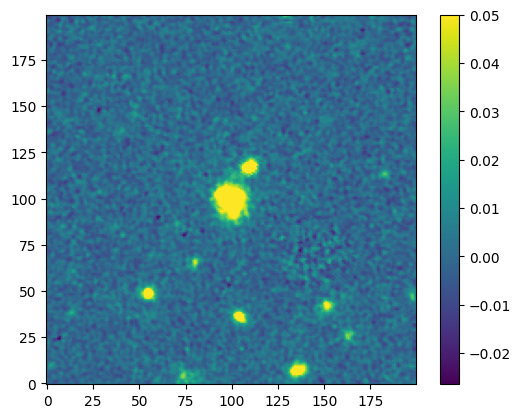

In [ ]:
plt.imshow(science_image, origin='lower', vmax=0.05)
plt.colorbar()
plt.show()


In [ ]:
goodss=pd.read_csv('/Users/neal/Documents/PhD/projects/SED-fitting/Clump/results/catalog_n/goodsslast.csv')

In [ ]:
f_data= goodss[(goodss['CANDELS_ID'] == 366) & (goodss['Clump_ID'] == 1)]
f_data_2= goodss[(goodss['CANDELS_ID'] == 366) & (goodss['Clump_ID'] == 2)]
f_data_3= goodss[(goodss['CANDELS_ID'] == 366) & (goodss['Clump_ID'] == 3)]
# Selecting the RA and DEC of the clump
ra_dec_clump1 =f_data[['RA_clump', 'DEC_clump']]
ra_dec_clump2 =f_data_2[['RA_clump', 'DEC_clump']]
ra_dec_clump3 =f_data_3[['RA_clump', 'DEC_clump']]


In [ ]:
coords = SkyCoord(ra=ra_dec_clump1['RA_clump'], dec=ra_dec_clump1['DEC_clump'], unit='deg')

coords_2 = SkyCoord(ra=ra_dec_clump2['RA_clump'], dec=ra_dec_clump2['DEC_clump'], unit='deg')
coords_3 = SkyCoord(ra=ra_dec_clump3['RA_clump'], dec=ra_dec_clump3['DEC_clump'], unit='deg')

/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_13140/1087387718.py:1: DeprecationWarning: `photutils.SkyCircularAperture` is a deprecated alias for `photutils.aperture.SkyCircularAperture` and will be removed in the future. Instead, please use `from photutils.aperture import SkyCircularAperture` to silence this warning.
  aper_sky = photutils.SkyCircularAperture(positions=coords, r=0.18 * u.arcsec)
/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_13140/1087387718.py:4: DeprecationWarning: `photutils.SkyCircularAperture` is a deprecated alias for `photutils.aperture.SkyCircularAperture` and will be removed in the future. Instead, please use `from photutils.aperture import SkyCircularAperture` to silence this warning.
  aper_sky_3 = photutils.SkyCircularAperture(positions=coords_3, r=0.18 * u.arcsec)


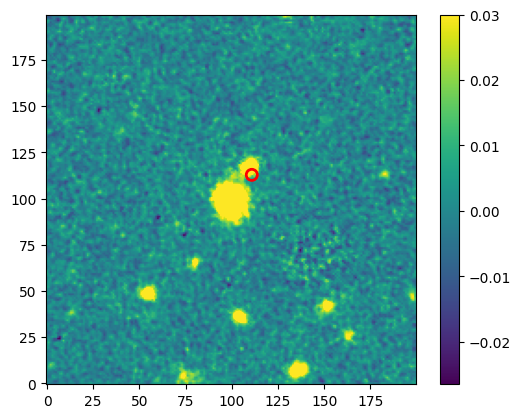

In [ ]:
aper_sky = photutils.SkyCircularAperture(positions=coords, r=0.18 * u.arcsec)
aper = aper_sky.to_pixel(wcs=wcs_140)

aper_sky_3 = photutils.SkyCircularAperture(positions=coords_3, r=0.18 * u.arcsec)
aper_3 = aper_sky_3.to_pixel(wcs=wcs_140)


plt.imshow(science_image, origin='lower', vmax=0.03)
plt.colorbar()

# aper.plot(color="red", lw=2., fill=False)

aper_3.plot(color="red", lw=2., fill=False)





# Matching again:

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import ascii

my_catalog= ascii.read('/Users/neal/Documents/PhD/projects/SED-fitting/Clump/results/microjansky_multi_band_photometry_results.csv')
my_catalog = my_catalog.to_pandas()

In [ ]:
my_catalog.columns

Index(['Unnamed: 0', 'Field', 'CANDELS_ID', 'z', 'RA_gal', 'DEC_gal', 'A',
       'Clump_ID', 'dist_clump', 'flux_ratio', 'restuv_flux', 'RA_clump',
       'DEC_clump', 'Raw_Flux_f125w_mjy', 'Background_Flux_f125w_mjy',
       'Corrected_Flux_f125w_mjy', 'Raw_Flux_f160w_mjy',
       'Background_Flux_f160w_mjy', 'Corrected_Flux_f160w_mjy',
       'Raw_Flux_f275w_mjy', 'Background_Flux_f275w_mjy',
       'Corrected_Flux_f275w_mjy', 'Raw_Flux_f435w_mjy',
       'Background_Flux_f435w_mjy', 'Corrected_Flux_f435w_mjy',
       'Raw_Flux_f606w_mjy', 'Background_Flux_f606w_mjy',
       'Corrected_Flux_f606w_mjy', 'Raw_Flux_f775w_mjy',
       'Background_Flux_f775w_mjy', 'Corrected_Flux_f775w_mjy',
       'Raw_Flux_f850lp_mjy', 'Background_Flux_f850lp_mjy',
       'Corrected_Flux_f850lp_mjy', 'Raw_Flux_f140w_mjy',
       'Background_Flux_f140w_mjy', 'Corrected_Flux_f140w_mjy',
       'norm_dist_clump'],
      dtype='object')

In [ ]:
guo_clumps_filtered.columns

Index(['Gal', 'RAGdeg', 'DEGdeg', 'z', 'logM_', 'e_logM_', 'logSFR',
       'e_logSFR', 'GUmag', 'GVmag', 'GJmag', 'Rad', 'e_Rad', 'CID', 'RAJ2000',
       'DEJ2000', 'Det', 'fLUV', 'BSC', 'F435W', 'e_F435W', 'F606W', 'e_F606W',
       'F775W', 'e_F775W', 'F814W', 'e_F814W', 'F850LP', 'e_F850LP', 'F105W',
       'e_F105W', 'F125W', 'e_F125W', 'F140W', 'e_F140W', 'F160W', 'e_F160W',
       'Dist', 'zphot', 'q_zphot', 'CMass', 'b_CMass', 'b_cmass_lc', 'CSFR',
       'b_CSFR', 'b_csfr_lc', 'E_B-V_', 'b_E_B-V_', 'b_e_b-v__lc', 'logAge',
       'b_logAge', 'b_logage_lc', 'logtau', 'b_logtau', 'b_logtau_lc', 'CUmag',
       'e_CUmag', 'CBmag', 'e_CBmag', 'CVmag', 'e_CVmag', 'logUVSFR',
       'e_logUVSFR', 'UVE_B-V_', 'e_UVE_B-V_', 'VRFlag', 'BMFlag', 'EFlag'],
      dtype='object')

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from astropy.table import Table
from astropy.io import ascii

# Load 
my_catalog_path = '/Users/neal/Documents/PhD/projects/SED-fitting/Clump/results/microjansky_multi_band_photometry_results.csv'
my_catalog = ascii.read(my_catalog_path).to_pandas()

# Load Guo+18 catalog
guo_catalog_path = '/Users/neal/Downloads/asu-2.fit'
guo_catalog = Table.read(guo_catalog_path).to_pandas()

# Assume the Guo+18 catalog starts the relevant data at row 3193 for fiducial background subtraction
guo_catalog_filtered = guo_catalog.iloc[3193:].reset_index(drop=True)

# Calculate normalized distance for  catalog (dist_clump/A)
my_catalog['norm_dist_clump'] = my_catalog['dist_clump'] / my_catalog['A']

# Set a threshold for the difference in normalized distances for matching
distance_threshold = 0.05

# Create an empty list to store matches
matches = []

# Iterate over my catalog and find matches in Guo's catalog based on CANDELS ID and normalized distance
for index, my_clump in my_catalog.iterrows():
    candels_id = my_clump['CANDELS_ID']
    norm_dist_my = my_clump['norm_dist_clump']

    # Find potential matches in Guo's catalog
    guo_matches = guo_catalog_filtered[guo_catalog_filtered['Gal'] == candels_id]
    guo_matches['dist_diff'] = (guo_matches['Dist'] - norm_dist_my).abs()

    # Identify the closest match within the threshold
    close_matches = guo_matches[guo_matches['dist_diff'] <= distance_threshold]
    if not close_matches.empty:
        closest_match = close_matches.loc[close_matches['dist_diff'].idxmin()]
        matches.append((index, closest_match.name, closest_match['dist_diff']))

# Convert matches to a DataFrame
matches_df = pd.DataFrame(matches, columns=['my_Clump_ID', 'Guo_Clump_ID', 'Distance_Difference'])

# Define the flux columns for comparison
my_flux_col = 'Corrected_Flux_f125w_mjy'  # Based on my catalog column names
guo_flux_col = 'F125W'  # Based on Guo+18 catalog column names

# Prepare the data for plotting
plot_data = matches_df.merge(my_catalog, left_on='my_Clump_ID', right_index=True)
plot_data = plot_data.merge(guo_catalog_filtered, left_on='Guo_Clump_ID', right_index=True, suffixes=('_my', '_guo'))

# Plot my fluxes vs. Guo's for matched clumps
plt.scatter(plot_data[my_flux_col], plot_data[guo_flux_col + '_guo'])
plt.xlabel(f'my Corrected Flux ({my_flux_col}) [micro-Jansky]')
plt.ylabel(f'Guo Flux ({guo_flux_col}) [F125W]')
plt.title('Flux Comparison Between my Catalog and Guo+18')
plt.plot([plot_data[my_flux_col].min(), plot_data[my_flux_col].max()], [plot_data[guo_flux_col + '_guo'].min(), plot_data[guo_flux_col + '_guo'].max()], 'k--', label='Line of Equality')
plt.legend()
plt.show()


/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_13140/2615156060.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  guo_matches['dist_diff'] = (guo_matches['Dist'] - norm_dist_your).abs()
/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_13140/2615156060.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  guo_matches['dist_diff'] = (guo_matches['Dist'] - norm_dist_your).abs()
/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_13140/2615156060.py:33: SettingWithCopyWarning: 
A 

KeyError: 'F125W_guo'

/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_13140/2688032018.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  guo_matches['dist_diff'] = (guo_matches['Dist'] - norm_dist_your).abs()
/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_13140/2688032018.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  guo_matches['dist_diff'] = (guo_matches['Dist'] - norm_dist_your).abs()
/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_13140/2688032018.py:36: SettingWithCopyWarning: 
A 

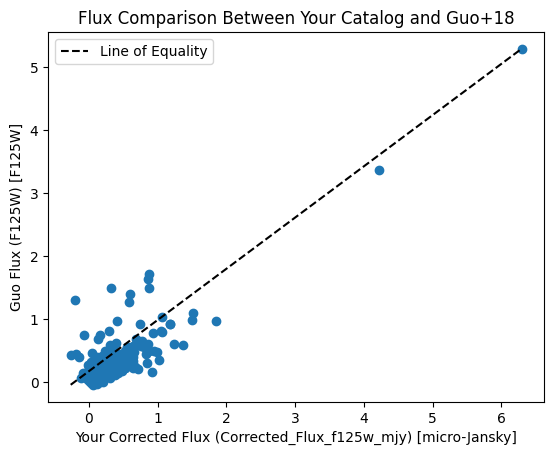

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from astropy.table import Table
from astropy.io import ascii

# Load  catalog
my_catalog_path = '/Users/neal/Documents/PhD/projects/SED-fitting/Clump/results/microjansky_multi_band_photometry_results.csv'
my_catalog = ascii.read(my_catalog_path).to_pandas()

# Load Guo+18 catalog
guo_catalog_path = '/Users/neal/Downloads/asu-2.fit'
guo_catalog = Table.read(guo_catalog_path).to_pandas()

# Assume the Guo+18 catalog starts the relevant data at row 3193 for fiducial background subtraction
guo_catalog_filtered = guo_catalog.iloc[3193:].reset_index(drop=True)

# Ensure that 'F125W' is the correct column name in the Guo+18 catalog
assert 'F125W' in guo_catalog_filtered.columns, "Column F125W not found in Guo+18 catalog"

# Calculate normalized distance for catalog (dist_clump/A)
my_catalog['norm_dist_clump'] = my_catalog['dist_clump'] / my_catalog['A']

# Set a threshold for the difference in normalized distances for matching
distance_threshold = 0.05

# Create an empty list to store matches
matches = []

# Iterate over my catalog and find matches in Guo's catalog based on CANDELS ID and normalized distance
for index, my_clump in my_catalog.iterrows():
    candels_id = my_clump['CANDELS_ID']
    norm_dist_my = my_clump['norm_dist_clump']

    # Find potential matches in Guo's catalog
    guo_matches = guo_catalog_filtered[guo_catalog_filtered['Gal'] == candels_id]
    guo_matches['dist_diff'] = (guo_matches['Dist'] - norm_dist_my).abs()

    # Identify the closest match within the threshold
    close_matches = guo_matches[guo_matches['dist_diff'] <= distance_threshold]
    if not close_matches.empty:
        closest_match = close_matches.loc[close_matches['dist_diff'].idxmin()]
        matches.append((index, closest_match.name, closest_match['dist_diff']))

# Convert matches to a DataFrame
matches_df = pd.DataFrame(matches, columns=['my_Clump_ID', 'Guo_Clump_ID', 'Distance_Difference'])

# Define the flux columns for comparison
my_flux_col = 'Corrected_Flux_f125w_mjy'  # Based on catalog column names
guo_flux_col = 'F125W'  # Based on Guo+18 catalog column names

# Prepare the data for plotting
plot_data = matches_df.merge(my_catalog, left_on='my_Clump_ID', right_index=True)
plot_data = plot_data.merge(guo_catalog_filtered, left_on='Guo_Clump_ID', right_index=True, suffixes=('_my', '_guo'))

# Plot my fluxes vs. Guo's for matched clumps
plt.scatter(plot_data[my_flux_col], plot_data[guo_flux_col])
plt.xlabel(f'my Corrected Flux ({my_flux_col}) [micro-Jansky]')
plt.ylabel(f'Guo Flux ({guo_flux_col}) [F125W]')
plt.title('Flux Comparison Between Catalog and Guo+18')
plt.plot([plot_data[my_flux_col].min(), plot_data[my_flux_col].max()], [plot_data[guo_flux_col].min(), plot_data[guo_flux_col].max()], 'k--', label='Line of Equality')
plt.legend()
plt.show()


## Do this on Other bands:

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from astropy.table import Table
from astropy.io import ascii

# Load catalog
my_catalog = ascii.read('/Users/neal/Documents/PhD/projects/SED-fitting/Clump/results/microjansky_multi_band_photometry_results.csv').to_pandas()

# Load Guo+18 catalog
guo_catalog = Table.read('/Users/neal/Downloads/asu-2.fit').to_pandas()
guo_catalog_filtered = guo_catalog.iloc[3193:].reset_index(drop=True)

# Define my band columns (correct them according to my actual columns)
bands = ['f125w', 'f140w', 'f160w', 'f275w', 'f435w', 'f606w', 'f775w', 'f850lp']
my_band_columns = ['Corrected_Flux_' + band + '_mjy' for band in bands]

# Guo+18 band columns (correct them according to the actual columns)
guo_band_columns = ['F125W', 'F140W', 'F160W', 'F275W', 'F435W', 'F606W', 'F775W', 'F850LP']

# Calculate normalized distance for catalog (dist_clump/A)
my_catalog['norm_dist_clump'] = my_catalog['dist_clump'] /my_catalog['A']

# Set a threshold for the difference in normalized distances for matching
distance_threshold = 0.05

# Create a function to find matches based on CANDELS ID and normalized distance
def find_matches(my_catalog, guo_catalog_filtered, distance_threshold, candels_id_column='CANDELS_ID', norm_dist_column='norm_dist_clump'):
    matches = []
    for index, my_clump in my_catalog.iterrows():
        candels_id = my_clump[candels_id_column]
        norm_dist_my = my_clump[norm_dist_column]

        guo_matches = guo_catalog_filtered[guo_catalog_filtered['Gal'] == candels_id]
        guo_matches['dist_diff'] = (guo_matches['Dist'] - norm_dist_my).abs()

        close_matches = guo_matches[guo_matches['dist_diff'] <= distance_threshold]
        if not close_matches.empty:
            closest_match = close_matches.loc[close_matches['dist_diff'].idxmin()]
            matches.append((index, closest_match.name, closest_match['dist_diff']))

    return pd.DataFrame(matches, columns=['my_Clump_ID', 'Guo_Clump_ID', 'Distance_Difference'])

# Loop over each band to perform matching and plotting
for my_flux_col, guo_flux_col in zip(my_band_columns, guo_band_columns):
    # Make sure the columns exist in the respective catalogs
    if my_flux_col not in my_catalog.columns or guo_flux_col not in guo_catalog_filtered.columns:
        print(f"One or both of the flux columns for band {guo_flux_col} do not exist in the catalogs.")
        continue

    # Find matches for the current band
    matches_df = find_matches(my_catalog, guo_catalog_filtered, distance_threshold)

    # Merge matched flux data
    plot_data = matches_df.merge(my_catalog, left_on='my_Clump_ID', right_index=True)
    plot_data = plot_data.merge(guo_catalog_filtered, left_on='Guo_Clump_ID', right_index=True, suffixes=('_my', '_guo'))

    # Plot myfluxes vs. Guo's for matched clumps in the current band
    plt.figure(figsize=(8, 6))
    plt.scatter(plot_data[your_flux_col], plot_data[guo_flux_col + '_guo'], alpha=0.5, label=f'Band {guo_flux_col}')
    plt.xlabel(f'my Corrected Flux [micro-Jansky]')
    plt.ylabel(f'Guo Flux [{guo_flux_col}]')
    plt.title(f'Flux Comparison in Band {guo_flux_col}')
    plt.legend()
    plt.show()


/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_17367/1013328639.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  guo_matches['dist_diff'] = (guo_matches['Dist'] - norm_dist_your).abs()
/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_17367/1013328639.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  guo_matches['dist_diff'] = (guo_matches['Dist'] - norm_dist_your).abs()
/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_17367/1013328639.py:34: SettingWithCopyWarning: 
A 

KeyError: 'F125W_guo'

<Figure size 800x600 with 0 Axes>

/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_17367/3650915487.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  guo_matches['dist_diff'] = (guo_matches['Dist'] - norm_dist_my).abs()
/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_17367/3650915487.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  guo_matches['dist_diff'] = (guo_matches['Dist'] - norm_dist_my).abs()
/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_17367/3650915487.py:49: SettingWithCopyWarning: 
A valu

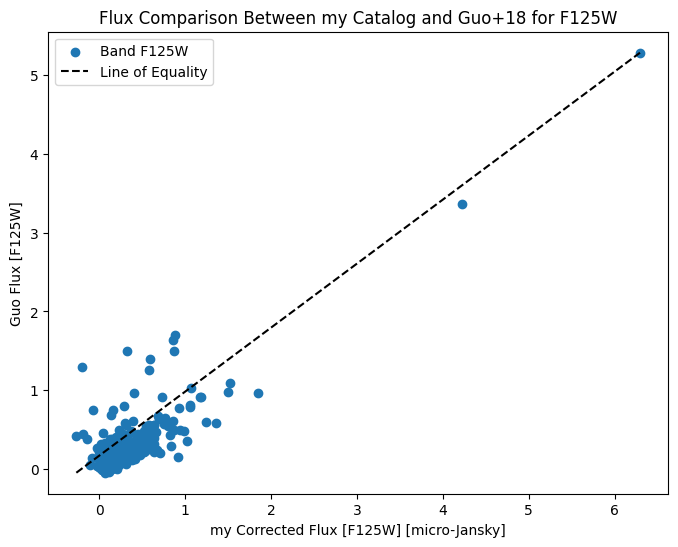

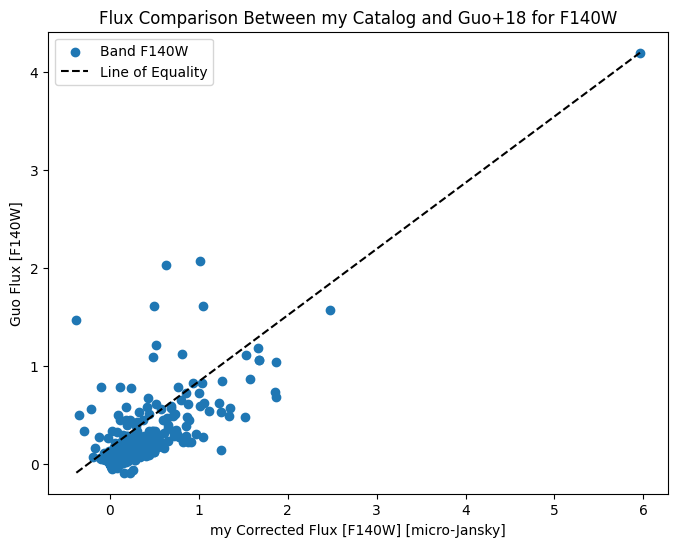

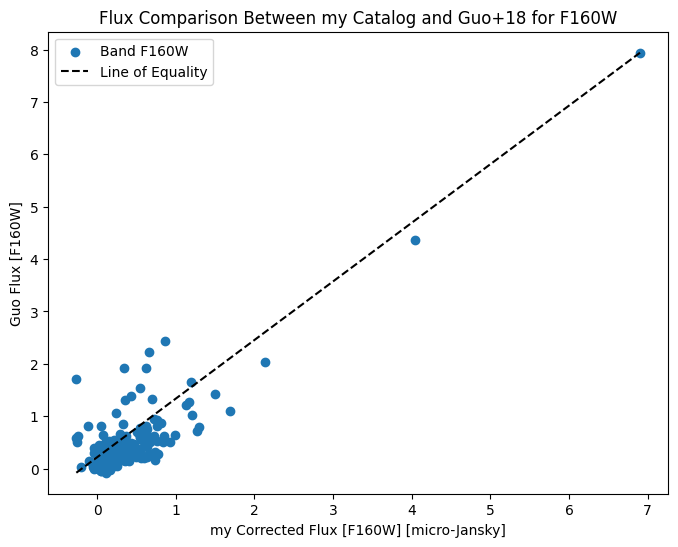

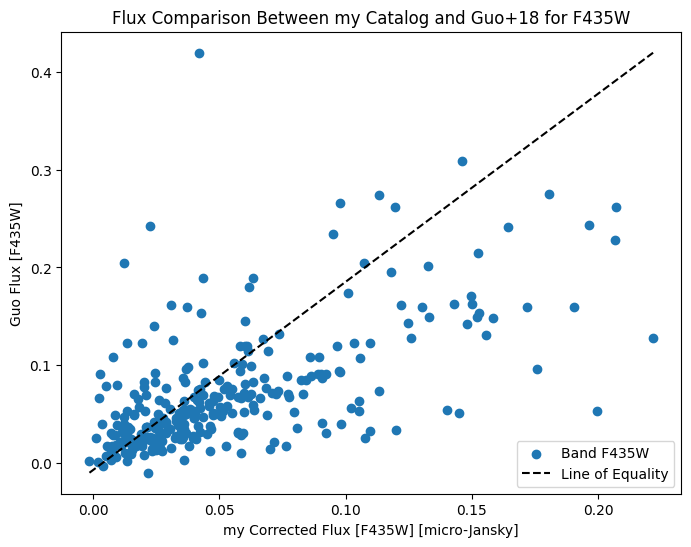

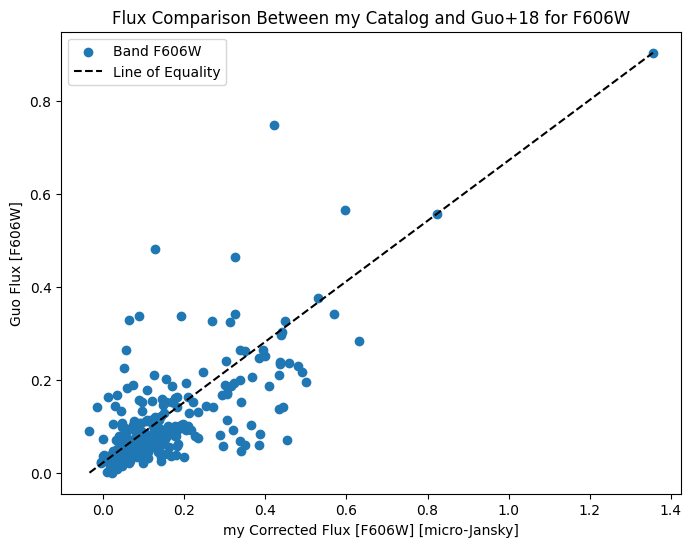

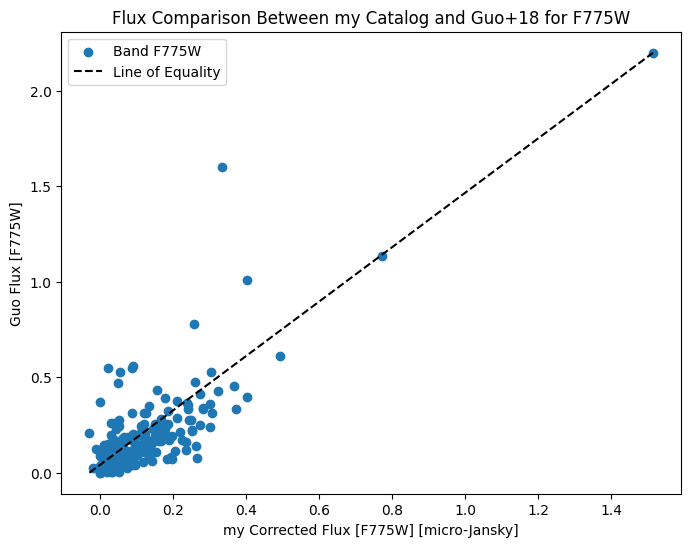

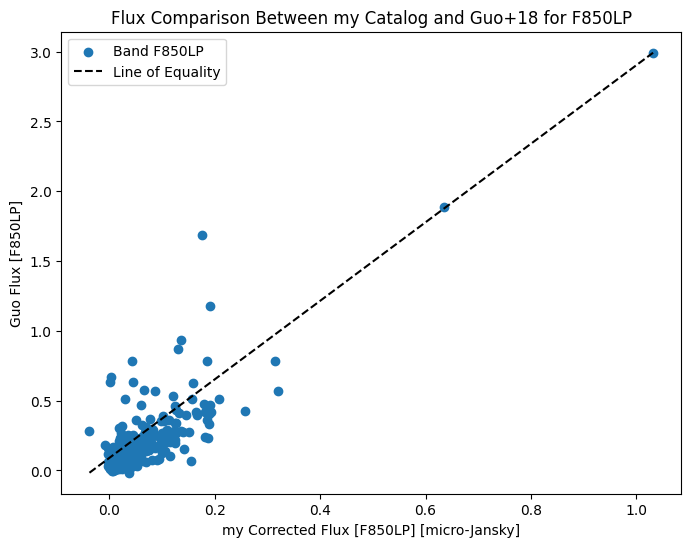

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from astropy.table import Table
# from astropy.io import ascii



# Filter Guo+18 catalog to the section with fiducial background subtraction
guo_catalog_filtered = guo_catalog.iloc[3193:].reset_index(drop=True)

# Define the band suffixes for my catalog and the corresponding column names in Guo+18 catalog
bands = {
    'f125w': 'F125W',
    'f140w': 'F140W',
    'f160w': 'F160W',
    # 'f275w': 'F275W', # Remove or replace with the correct column name if it exists
    'f435w': 'F435W',
    'f606w': 'F606W',
    'f775w': 'F775W',
    'f850lp': 'F850LP',
}

# Remove the bands that do not exist in Guo's catalog
bands = {k: v for k, v in bands.items() if v in guo_catalog_filtered.columns}

# Check all bands exist inmy catalog
for band_suffix in bands.keys():
    my_flux_col = f'Corrected_Flux_{band_suffix}_mjy'
    assert my_flux_col in my_catalog.columns, f"Column '{my_flux_col}' not found in my catalog"

# Continue with the rest of the script for matching and plotting...

# Calculate normalized distance for my catalog (dist_clump/A)
my_catalog['norm_dist_clump'] = my_catalog['dist_clump'] / my_catalog['A']

# Set a threshold for the difference in normalized distances for matching
distance_threshold = 0.05

# Create an empty list to store matches
matches = []

# Iterate over mycatalog and find matches in Guo's catalog based on CANDELS ID and normalized distance
for index, my_clump in my_catalog.iterrows():
    candels_id =my_clump['CANDELS_ID']
    norm_dist_my = my_clump['norm_dist_clump']

    # Find potential matches in Guo's catalog
    guo_matches = guo_catalog_filtered[guo_catalog_filtered['Gal'] == candels_id]
    guo_matches['dist_diff'] = (guo_matches['Dist'] - norm_dist_my).abs()

    # Identify the closest match within the threshold
    close_matches = guo_matches[guo_matches['dist_diff'] <= distance_threshold]
    if not close_matches.empty:
        closest_match = close_matches.loc[close_matches['dist_diff'].idxmin()]
        matches.append((index, closest_match.name, closest_match['dist_diff']))

# Convert matches to a DataFrame
matches_df = pd.DataFrame(matches, columns=['my_Clump_ID', 'Guo_Clump_ID', 'Distance_Difference'])

# Plot the flux comparison for each band
for band_suffix, guo_col_name in bands.items():
    my_flux_col = f'Corrected_Flux_{band_suffix}_mjy'
    
    # Merge matched flux data
    matched_fluxes = pd.merge(matches_df, my_catalog, left_on='my_Clump_ID', right_index=True)
    matched_fluxes = pd.merge(matched_fluxes, guo_catalog_filtered, left_on='Guo_Clump_ID', right_index=True, suffixes=('_my', '_guo'))

    # Plot my fluxes vs. Guo's for matched clumps
    plt.figure(figsize=(8, 6))
    plt.scatter(matched_fluxes[my_flux_col], matched_fluxes[guo_col_name], label=f'Band {band_suffix.upper()}')
    plt.xlabel(f'my Corrected Flux [{band_suffix.upper()}] [micro-Jansky]')
    plt.ylabel(f'Guo Flux [{guo_col_name}]')
    plt.title(f'Flux Comparison Between my Catalog and Guo+18 for {band_suffix.upper()}')
    plt.plot([matched_fluxes[my_flux_col].min(), matched_fluxes[my_flux_col].max()], 
             [matched_fluxes[guo_col_name].min(), matched_fluxes[guo_col_name].max()], 'k--', label='Line of Equality')
    plt.legend()
    plt.show()


In [ ]:
matches_df

,my_Clump_ID,Guo_Clump_ID,Distance_Difference
0,6,998,0.034317
1,8,1001,0.001480
2,14,2,0.035781
3,15,2,0.041633
4,17,2,0.025467
...,...,...,...
288,3977,3181,0.009954
289,3990,3184,0.027149
290,4007,2732,0.045968
291,4035,3189,0.020125


# Lets make the matched df more detailed:

/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_17367/2816492988.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  guo_matches['dist_diff'] = (guo_matches['Dist'] - norm_dist_my).abs()
/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_17367/2816492988.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  guo_matches['dist_diff'] = (guo_matches['Dist'] - norm_dist_my).abs()
/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_17367/2816492988.py:49: SettingWithCopyWarning: 
A valu

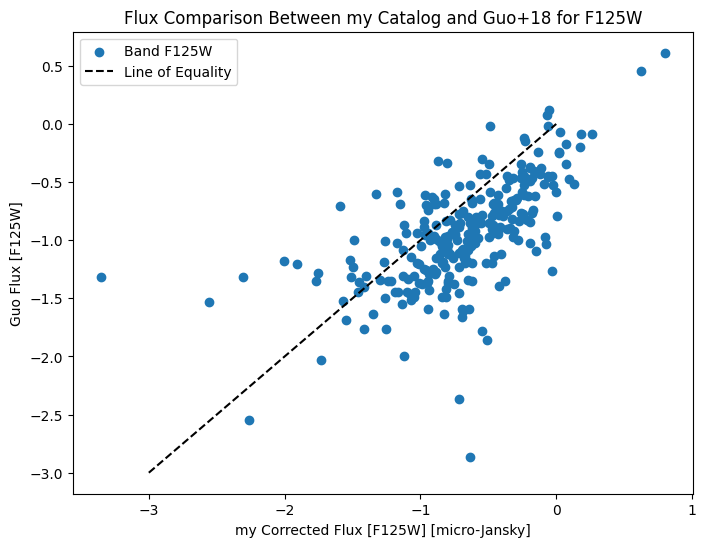

/Users/neal/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/neal/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


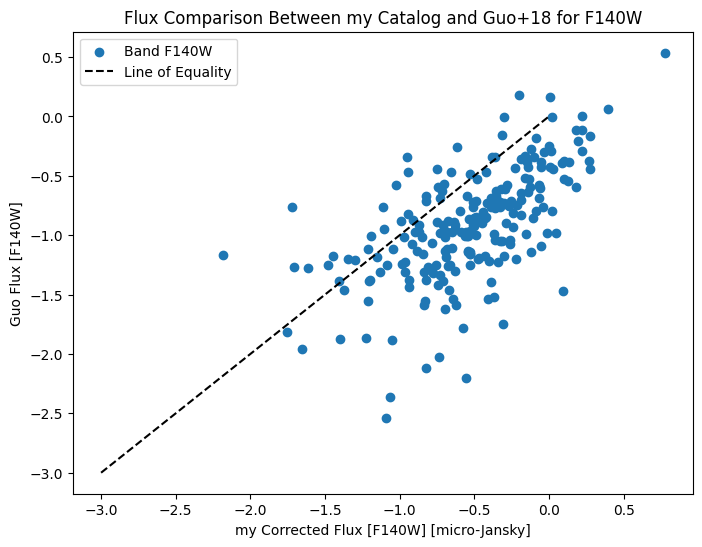

/Users/neal/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


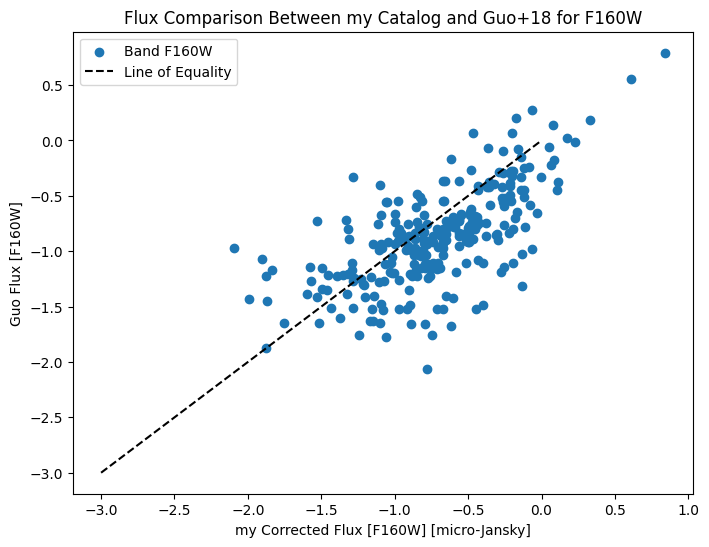

/Users/neal/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/neal/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


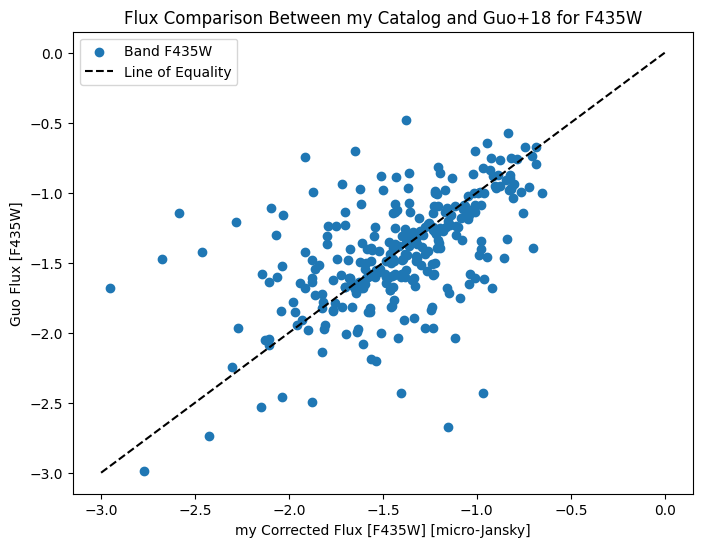

/Users/neal/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


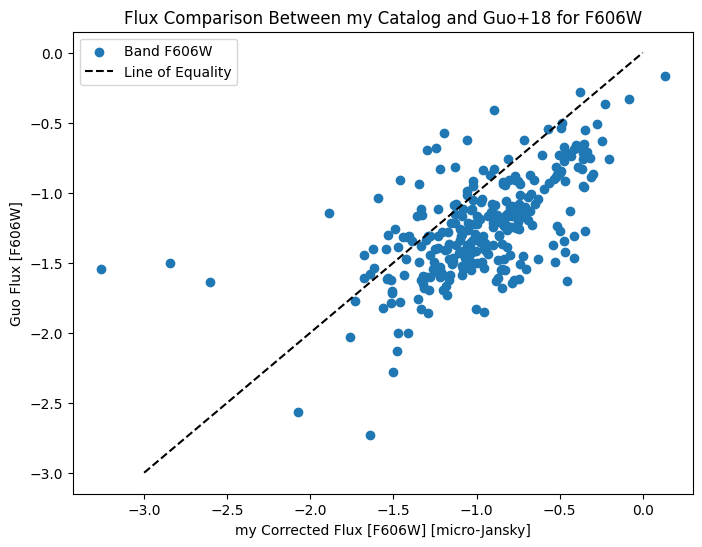

/Users/neal/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/neal/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


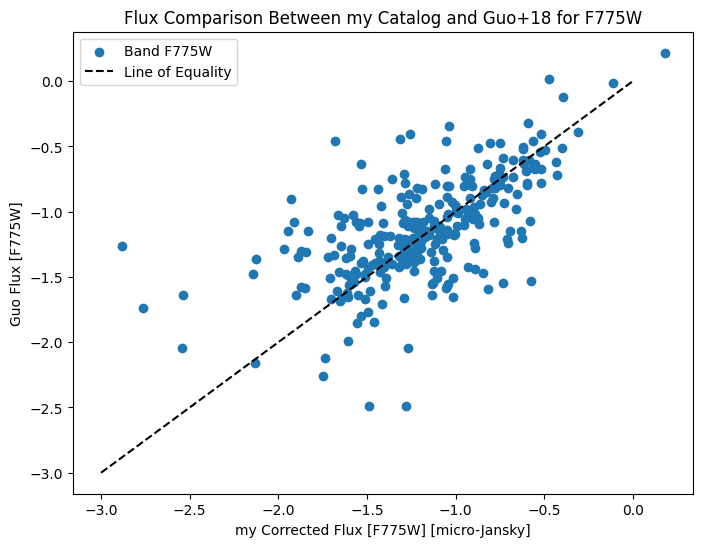

/Users/neal/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


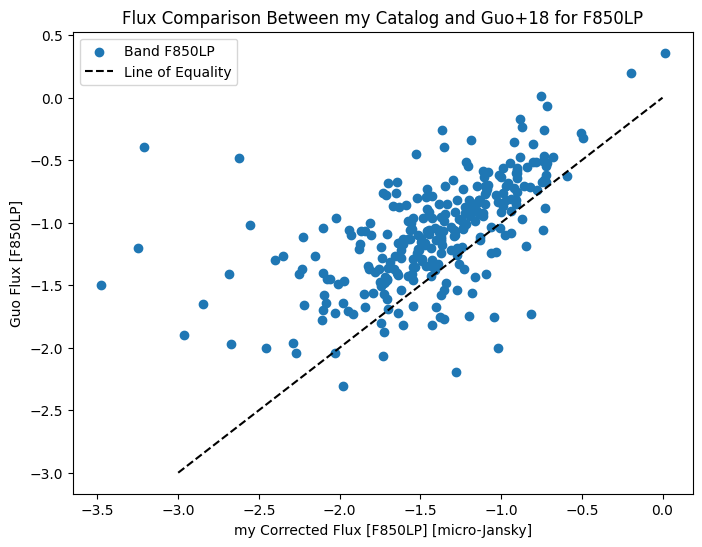

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from astropy.table import Table
# from astropy.io import ascii



# Filter Guo+18 catalog to the section with fiducial background subtraction
guo_catalog_filtered = guo_catalog.iloc[15965:19158].reset_index(drop=True)

# Define the band suffixes formy catalog and the corresponding column names in Guo+18 catalog
bands = {
    'f125w': 'F125W',
    'f140w': 'F140W',
    'f160w': 'F160W',
    # 'f275w': 'F275W', # Remove or replace with the correct column name if it exists
    'f435w': 'F435W',
    'f606w': 'F606W',
    'f775w': 'F775W',
    'f850lp': 'F850LP',
}

# Remove the bands that do not exist in Guo's catalog
bands = {k: v for k, v in bands.items() if v in guo_catalog_filtered.columns}

# Check all bands exist inmy catalog
for band_suffix in bands.keys():
   my_flux_col = f'Corrected_Flux_{band_suffix}_mjy'
   assert my_flux_col in my_catalog.columns, f"Column '{my_flux_col}' not found in my catalog"

# Continue with the rest of the script for matching and plotting...

# Calculate normalized distance for mycatalog (dist_clump/A)
my_catalog['norm_dist_clump'] = my_catalog['dist_clump'] / my_catalog['A']

# Set a threshold for the difference in normalized distances for matching
distance_threshold = 0.05

# Create an empty list to store matches
matches = []

# Iterate over my catalog and find matches in Guo's catalog based on CANDELS ID and normalized distance
for index, my_clump in my_catalog.iterrows():
    candels_id = my_clump['CANDELS_ID']
    norm_dist_my= my_clump['norm_dist_clump']

    # Find potential matches in Guo's catalog
    guo_matches = guo_catalog_filtered[guo_catalog_filtered['Gal'] == candels_id]
    guo_matches['dist_diff'] = (guo_matches['Dist'] - norm_dist_my).abs()

    # Identify the closest match within the threshold
    close_matches = guo_matches[guo_matches['dist_diff'] <= distance_threshold]
    if not close_matches.empty:
        closest_match = close_matches.loc[close_matches['dist_diff'].idxmin()]
        matches.append({
            'my_Catalog_Galaxy_ID': candels_id,
            'my_Clump_ID': index,
            'Guo_Clump_ID': closest_match.name,
            'my_Dist_Norm': norm_dist_my,
            'Guo_Dist_Norm': closest_match['Dist'],
            'Distance_Difference': closest_match['dist_diff']
        })


matches_df = pd.DataFrame(matches)

# Plot the flux comparison for each band
for band_suffix, guo_col_name in bands.items():
    my_flux_col = f'Corrected_Flux_{band_suffix}_mjy'
    
    # Merge matched flux data
    matched_fluxes = pd.merge(matches_df, my_catalog, left_on='my_Clump_ID', right_index=True)
    matched_fluxes = pd.merge(matched_fluxes, guo_catalog_filtered, left_on='Guo_Clump_ID', right_index=True, suffixes=('_my', '_guo'))

    # Plot myfluxes vs. Guo's for matched clumps
    plt.figure(figsize=(8, 6))
    plt.scatter(np.log10(matched_fluxes[my_flux_col]), np.log10(matched_fluxes[guo_col_name]), label=f'Band {band_suffix.upper()}')
    plt.xlabel(f'my Corrected Flux [{band_suffix.upper()}] [micro-Jansky]')
    plt.ylabel(f'Guo Flux [{guo_col_name}]')
    plt.title(f'Flux Comparison Between my Catalog and Guo+18 for {band_suffix.upper()}')
    plt.plot([-3,0 ], 
             [-3, 0], 'k--', label='Line of Equality')
    plt.legend()
    plt.show()


In [ ]:
matches_df

,my_Catalog_Galaxy_ID,my_Clump_ID,Guo_Clump_ID,my_Dist_Norm,Guo_Dist_Norm,Distance_Difference
0,366,65,1028,1.048635,0.999,0.049635
1,366,66,1028,0.963316,0.999,0.035684
2,366,68,1027,1.587715,1.586,0.001715
3,366,69,1028,0.979206,0.999,0.019794
4,656,113,2753,0.939018,0.927,0.012018
...,...,...,...,...,...,...
222,26355,3971,2718,1.441520,1.438,0.003520
223,26459,3977,3180,1.602954,1.593,0.009954
224,26496,3990,3183,1.679149,1.652,0.027149
225,26732,4035,3188,1.696125,1.676,0.020125


## Realized the normalization in guo is done by van der vel 2014. Downloaded it and should add it to my cat and do the match again:

In [ ]:
my_catalog

,Unnamed: 0,Field,CANDELS_ID,z,RA_gal,DEC_gal,A,Clump_ID,dist_clump,flux_ratio,...,Raw_Flux_f775w_mjy,Background_Flux_f775w_mjy,Corrected_Flux_f775w_mjy,Raw_Flux_f850lp_mjy,Background_Flux_f850lp_mjy,Corrected_Flux_f850lp_mjy,Raw_Flux_f140w_mjy,Background_Flux_f140w_mjy,Corrected_Flux_f140w_mjy,norm_dist_clump
11,11,goodss,73,1.531,53.099527,-27.949153,4.154,1,2.415875,0.270392,...,0.109687,0.044777,0.064910,0.073208,0.032684,0.040524,0.755568,0.385884,0.369685,0.581578
29,29,goodss,148,2.533,53.124159,-27.943697,3.563,1,1.420251,0.349514,...,0.189893,0.069610,0.120283,0.100950,0.037090,0.063860,0.872964,0.276051,0.596913,0.398611
30,30,goodss,148,2.533,53.124159,-27.943697,3.563,2,4.432506,0.154356,...,0.116400,0.043373,0.073027,0.058600,0.023533,0.035067,0.357069,0.221409,0.135660,1.244038
31,31,goodss,160,2.077,53.130775,-27.943196,4.056,1,3.411627,0.319625,...,0.177820,0.077635,0.100185,0.097176,0.044449,0.052727,1.117208,0.463328,0.653880,0.841131
35,35,goodss,205,2.485,53.125500,-27.941527,4.886,1,4.936846,0.399455,...,0.253997,0.058284,0.195714,0.132992,0.029581,0.103411,0.821149,0.269333,0.551816,1.010407
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4056,4056,goodss,26755,1.088,53.142848,-27.706937,10.060,1,31.155176,0.019400,...,0.077372,0.036141,0.041231,0.046575,0.026353,0.020222,0.330459,0.277291,0.053168,3.096936
4057,4057,goodss,26755,1.088,53.142848,-27.706937,10.060,2,3.570014,0.306673,...,1.576514,0.849379,0.727135,1.426201,0.846401,0.579800,13.614902,7.950252,5.664650,0.354872
4059,4059,goodss,26783,2.615,53.150381,-27.706844,6.065,1,7.704078,0.052889,...,0.103113,0.047895,0.055218,0.060493,0.025869,0.034625,0.491444,0.257553,0.233891,1.270252
4060,4060,goodss,26783,2.615,53.150381,-27.706844,6.065,2,1.644023,0.161235,...,0.201157,0.087109,0.114048,0.112369,0.048364,0.064005,1.224349,0.534405,0.689944,0.271067


In [ ]:
from astropy.table import Table
my_catalog = ascii.read('/Users/neal/Documents/PhD/projects/SED-fitting/Clump/results/aperturecorrected_changedphotzpall_microjansky_multi_band_photometry_results.csv').to_pandas()


my_vandercat_complete = ascii.read('/Users/neal/Documents/PhD/projects/SED-fitting/Clump/myphotchanged_and_vanderwel_4063.csv').to_pandas()



In [ ]:
print(len(my_vandercat_complete))

4063


In [ ]:
guo_catalog_filtered = guo_catalog[guo_catalog['BSC'] == 'bgsub_v4']


In [ ]:
guo_catalog_filtered = guo_catalog.loc[guo_catalog['BSC'] == 'bgsub_v4']
guo_catalog_filtered

,Gal,RAGdeg,DEGdeg,z,logM_,e_logM_,logSFR,e_logSFR,GUmag,GVmag,...,e_CBmag,CVmag,e_CVmag,logUVSFR,e_logUVSFR,UVE_B-V_,e_UVE_B-V_,VRFlag,BMFlag,EFlag


# Now Do the normalization again with r value:

/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_17367/3591173345.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  guo_matches['dist_diff'] = (guo_matches['Dist'] - norm_dist_my).abs()
/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_17367/3591173345.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  guo_matches['dist_diff'] = (guo_matches['Dist'] - norm_dist_my).abs()
/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_17367/3591173345.py:52: SettingWithCopyWarning: 
A valu

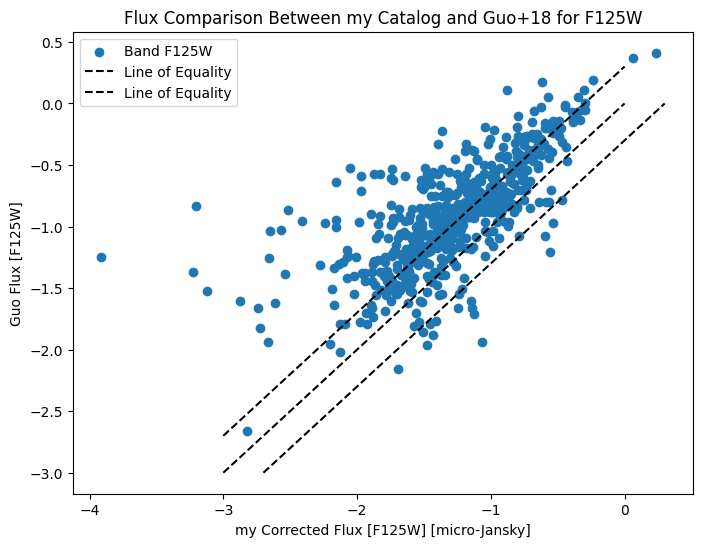

/Users/neal/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/neal/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


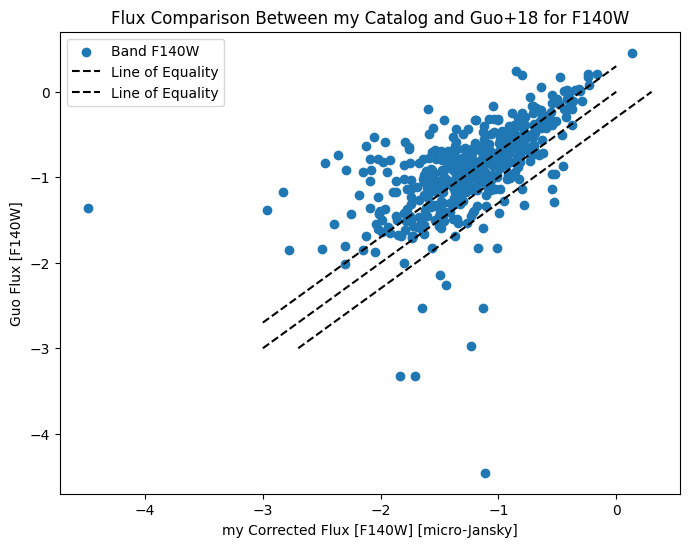

/Users/neal/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


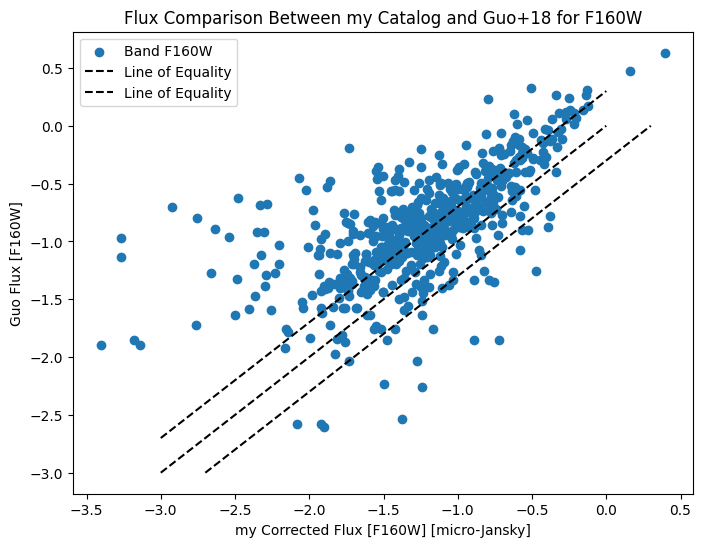

/Users/neal/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/neal/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


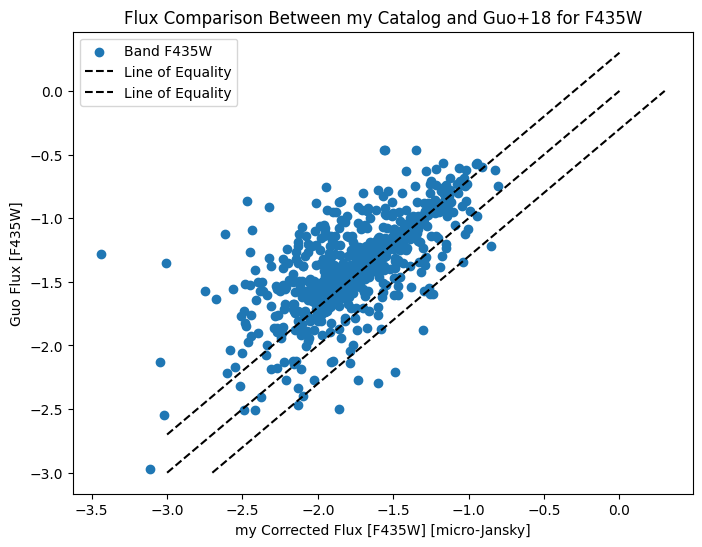

/Users/neal/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


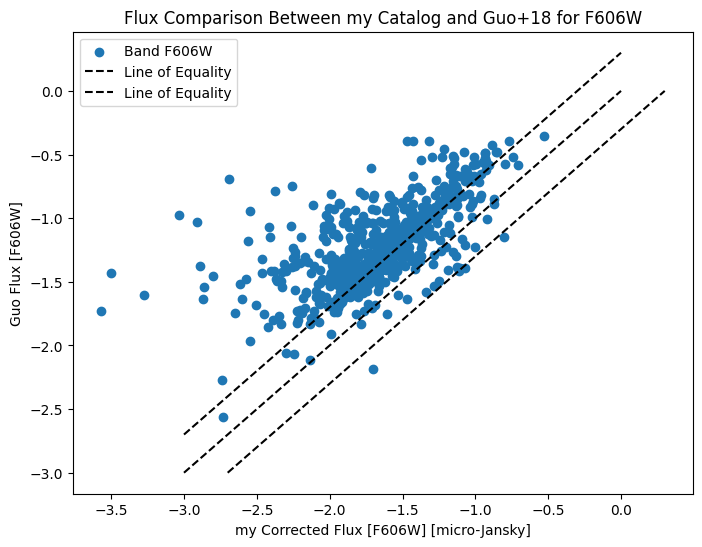

/Users/neal/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/neal/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


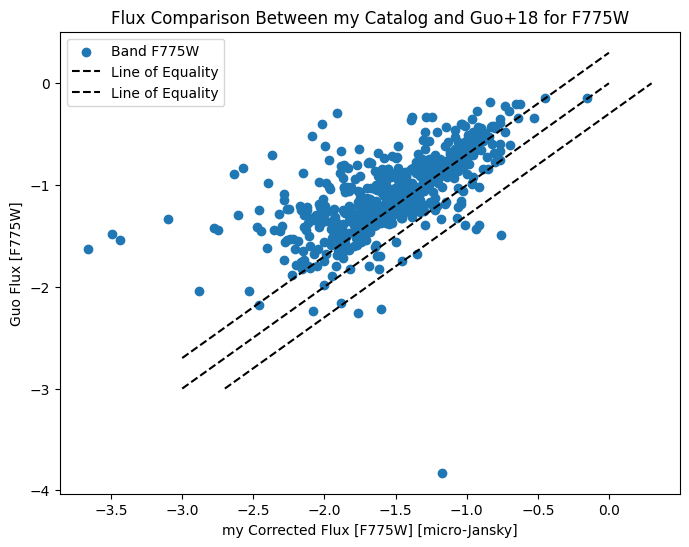

/Users/neal/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


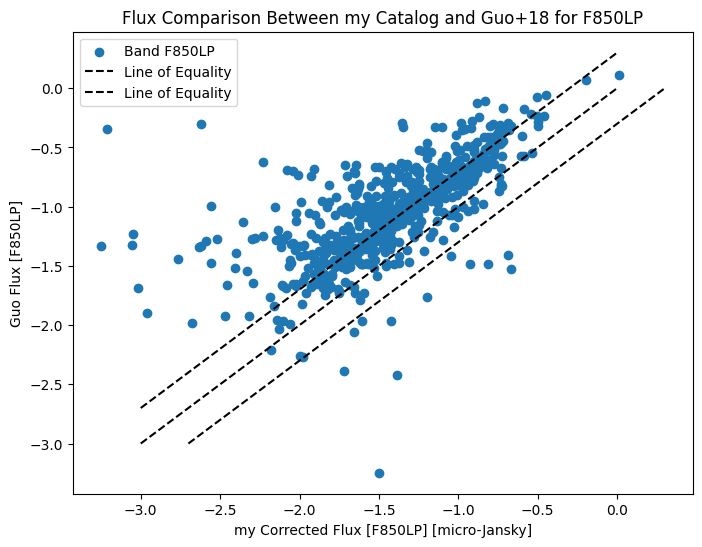

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from astropy.table import Table
# from astropy.io import ascii



# Filter Guo+18 catalog to the section with fiducial background subtraction
# guo_catalog_filtered = guo_catalog.iloc[15965:19158].reset_index(drop=True)
# guo_catalog_filtered = guo_catalog.iloc[9579:12772].reset_index(drop=True)
guo_catalog_filtered = guo_catalog.iloc[12772:15967].reset_index(drop=True)
#guo_catalog_filtered = guo_catalog[guo_catalog['BSC'] == 'bgsub_v4']

# Define the band suffixes formy catalog and the corresponding column names in Guo+18 catalog
bands = {
    'f125w': 'F125W',
    'f140w': 'F140W',
    'f160w': 'F160W',
    # 'f275w': 'F275W', 
    'f435w': 'F435W',
    'f606w': 'F606W',
    'f775w': 'F775W',
    'f850lp': 'F850LP',
}

# Remove the bands that do not exist in Guo's catalog
bands = {k: v for k, v in bands.items() if v in guo_catalog_filtered.columns}

# Check all bands exist inmy catalog
for band_suffix in bands.keys():
   my_flux_col = f'Corrected_Flux_{band_suffix}_mjy'
   assert my_flux_col in my_vandercat_complete.columns, f"Column '{my_flux_col}' not found in my catalog"

# Continue with the rest of the script for matching and plotting...

# Calculate normalized distance for mycatalog (dist_clump/r)
my_vandercat_complete['norm_dist_clump'] =(0.06* my_vandercat_complete['dist_clump']) / my_vandercat_complete['r']

# Set a threshold for the difference in normalized distances for matching
distance_threshold = 0.1

# Create an empty list to store matches
matches = []

# Iterate over my catalog and find matches in Guo's catalog based on CANDELS ID and normalized distance
for index, my_clump in my_vandercat_complete.iterrows():
    candels_id = my_clump['CANDELS_ID']
    norm_dist_my= my_clump['norm_dist_clump']

    # Find potential matches in Guo's catalog
    guo_matches = guo_catalog_filtered[guo_catalog_filtered['Gal'] == candels_id]
    guo_matches['dist_diff'] = (guo_matches['Dist'] - norm_dist_my).abs()

    # Identify the closest match within the threshold
    close_matches = guo_matches[guo_matches['dist_diff'] <= distance_threshold]
    if not close_matches.empty:
        closest_match = close_matches.loc[close_matches['dist_diff'].idxmin()]
        matches.append({
            'my_Catalog_Galaxy_ID': candels_id,
            'my_Clump_ID': index,
            'Guo_Clump_ID': closest_match.name,
            'my_Dist_Norm': norm_dist_my,
            'Guo_Dist_Norm': closest_match['Dist'],
            'Distance_Difference': closest_match['dist_diff']
        })


matches_df = pd.DataFrame(matches)

# Plot the flux comparison for each band
for band_suffix, guo_col_name in bands.items():
    my_flux_col = f'Corrected_Flux_{band_suffix}_mjy'
    
    # Merge matched flux data
    matched_fluxes = pd.merge(matches_df, my_vandercat_complete, left_on='my_Clump_ID', right_index=True)
    matched_fluxes = pd.merge(matched_fluxes, guo_catalog_filtered, left_on='Guo_Clump_ID', right_index=True, suffixes=('_my', '_guo'))

    # Plot myfluxes vs. Guo's for matched clumps
    plt.figure(figsize=(8, 6))
    plt.scatter(np.log10(matched_fluxes[my_flux_col]), np.log10(matched_fluxes[guo_col_name]), label=f'Band {band_suffix.upper()}')
    plt.xlabel(f'my Corrected Flux [{band_suffix.upper()}] [micro-Jansky]')
    plt.ylabel(f'Guo Flux [{guo_col_name}]')
    plt.title(f'Flux Comparison Between my Catalog and Guo+18 for {band_suffix.upper()}')
    plt.plot([-3,0 ], 
             [-3, 0], 'k--', label='Line of Equality')
    plt.plot([-3,0 ], 
             [-2.7, 0.3], 'k--', label='Line of Equality')
    plt.plot([-2.7,0.3 ], 
             [-3, 0], 'k--')
    plt.legend()
    plt.show()



In [ ]:
matched_fluxes

,my_Catalog_Galaxy_ID,my_Clump_ID,Guo_Clump_ID,my_Dist_Norm,Guo_Dist_Norm,Distance_Difference,Unnamed: 0,Field,CANDELS_ID,z_my,...,e_CBmag,CVmag,e_CVmag,logUVSFR,e_logUVSFR,UVE_B-V_,e_UVE_B-V_,VRFlag,BMFlag,EFlag
0,40,4,999,1.820483,1.892,0.071517,4,goodss,40,1.056,...,1.702,-15.333,0.943,0.00000,0.00000,0.000000e+00,0.000000,1,0,0
3,40,8,999,1.978160,1.892,0.086160,8,goodss,40,1.056,...,1.702,-15.333,0.943,0.00000,0.00000,0.000000e+00,0.000000,1,0,0
1,40,5,998,0.823156,0.725,0.098156,5,goodss,40,1.056,...,0.061,-18.785,0.038,0.00000,0.00000,0.000000e+00,0.000000,0,0,0
2,40,6,996,0.431139,0.447,0.015861,6,goodss,40,1.056,...,0.064,-19.100,0.033,0.00000,0.00000,0.000000e+00,0.000000,0,0,0
4,79,14,0,0.989545,1.038,0.048455,14,goodss,79,1.012,...,0.184,-17.410,0.083,0.00000,0.00000,0.000000e+00,0.000000,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
620,26554,4005,2732,1.660756,1.692,0.031244,4005,goodss,26554,1.604,...,0.256,-17.120,0.484,-0.63909,5.11410,4.831600e-02,0.091687,0,0,0
618,26554,4003,2733,1.491554,1.485,0.006554,4003,goodss,26554,1.604,...,0.174,-17.502,0.318,0.11656,0.39492,2.467900e-01,0.109140,0,0,0
619,26554,4004,2734,1.382240,1.453,0.070760,4004,goodss,26554,1.604,...,0.239,-16.919,0.580,-0.43758,0.88992,1.058100e-01,0.114540,0,0,0
621,26732,4036,3188,0.712896,0.736,0.023104,4036,goodss,26732,2.617,...,0.133,-19.275,0.133,-0.14630,5.93160,-6.758200e-07,0.043031,0,0,0


(array([71., 78., 74., 60., 65., 59., 56., 59., 48., 53.]),
 array([1.40751799e-05, 9.89371098e-03, 1.97733468e-02, 2.96529826e-02,
        3.95326184e-02, 4.94122542e-02, 5.92918900e-02, 6.91715258e-02,
        7.90511616e-02, 8.89307974e-02, 9.88104332e-02]),
 <BarContainer object of 10 artists>)

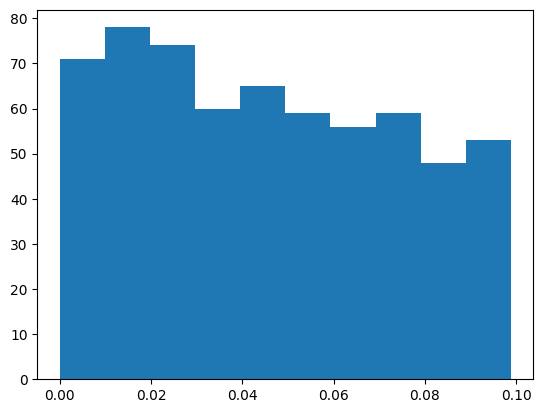

In [ ]:
plt.hist(matched_fluxes['Distance_Difference'])

# Plot flux in different bandpasses

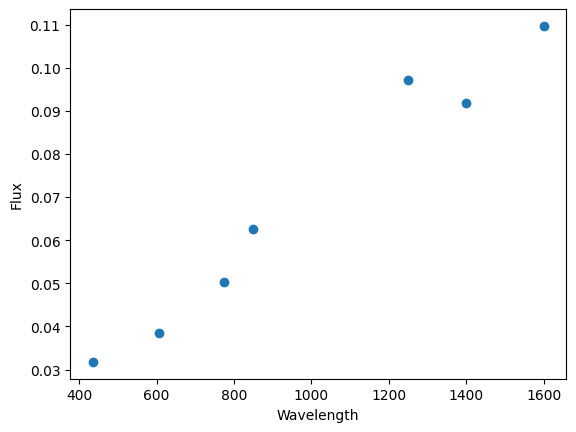

In [ ]:

ten_clump = my_vandercat_complete.iloc[70]

# WL
wavelengths = {
    'f125w': 1250,
    'f140w': 1400,
    'f160w': 1600,
    'f435w': 435,
    'f606w': 606,
    'f775w': 775,
    'f850lp': 850
}


band_wavelengths = {band: wavelengths[band] for band in bands.keys()}

# Get flux data for the first clump
fluxes = [ten_clump[f'Corrected_Flux_{band}_mjy'] for band in band_wavelengths.keys()]

# Plot

plt.scatter(band_wavelengths.values(), fluxes)
plt.xlabel('Wavelength')
plt.ylabel('Flux')
plt.show()


In [ ]:
guo_catalog.columns

Index(['Gal', 'RAGdeg', 'DEGdeg', 'z', 'logM_', 'e_logM_', 'logSFR',
       'e_logSFR', 'GUmag', 'GVmag', 'GJmag', 'Rad', 'e_Rad', 'CID', 'RAJ2000',
       'DEJ2000', 'Det', 'fLUV', 'BSC', 'F435W', 'e_F435W', 'F606W', 'e_F606W',
       'F775W', 'e_F775W', 'F814W', 'e_F814W', 'F850LP', 'e_F850LP', 'F105W',
       'e_F105W', 'F125W', 'e_F125W', 'F140W', 'e_F140W', 'F160W', 'e_F160W',
       'Dist', 'zphot', 'q_zphot', 'CMass', 'b_CMass', 'b_cmass_lc', 'CSFR',
       'b_CSFR', 'b_csfr_lc', 'E_B-V_', 'b_E_B-V_', 'b_e_b-v__lc', 'logAge',
       'b_logAge', 'b_logage_lc', 'logtau', 'b_logtau', 'b_logtau_lc', 'CUmag',
       'e_CUmag', 'CBmag', 'e_CBmag', 'CVmag', 'e_CVmag', 'logUVSFR',
       'e_logUVSFR', 'UVE_B-V_', 'e_UVE_B-V_', 'VRFlag', 'BMFlag', 'EFlag'],
      dtype='object')

In [ ]:
print(guo_catalog['CMass'][0])
[guo_catalog['CMass'][i * 3193 - 1] for i in range(1, 7)]

8.588


[9.24, 9.117, 9.112, 9.184, 9.01, 8.943]

In [ ]:
from astropy.table import Table
my_catalog = ascii.read('/Users/neal/Documents/PhD/projects/SED-fitting/Clump/results/microjansky_multi_band_photometry_results.csv')

my_vandercat_complete = ascii.read('/Users/neal/Documents/PhD/projects/SED-fitting/Clump/myphotchanged_and_vanderwel_4063.csv').to_pandas()



/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_17367/3591173345.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  guo_matches['dist_diff'] = (guo_matches['Dist'] - norm_dist_my).abs()
/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_17367/3591173345.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  guo_matches['dist_diff'] = (guo_matches['Dist'] - norm_dist_my).abs()
/var/folders/by/26kj85kd3w94p3xv_m2206b40000gn/T/ipykernel_17367/3591173345.py:52: SettingWithCopyWarning: 
A valu

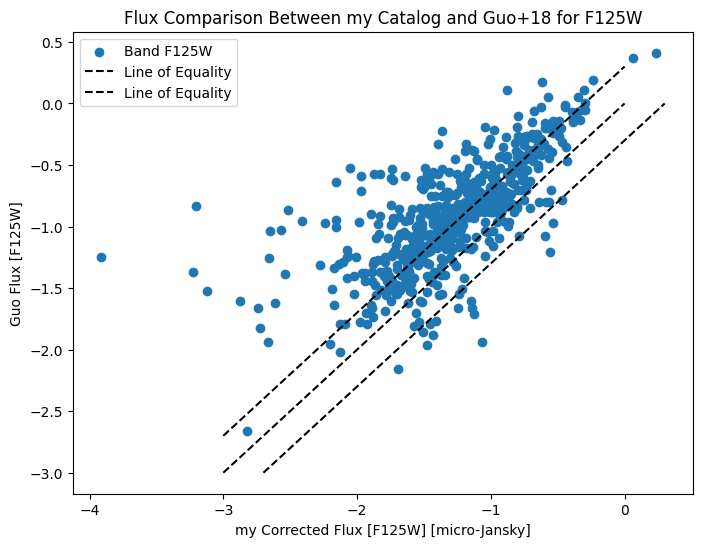

/Users/neal/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/neal/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


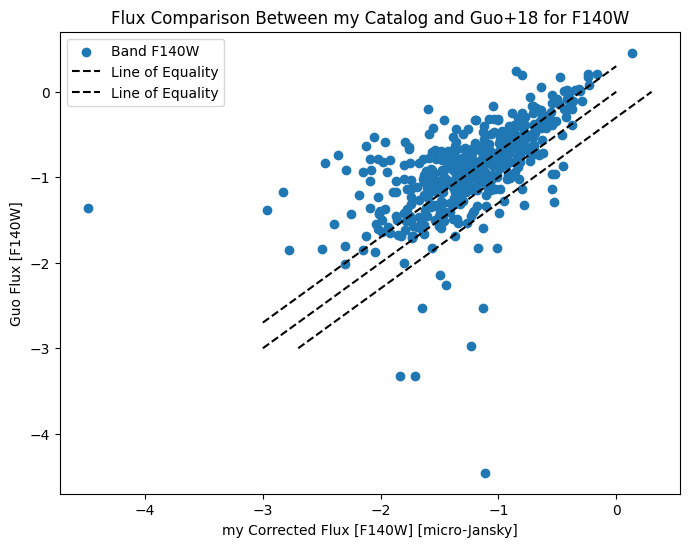

/Users/neal/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


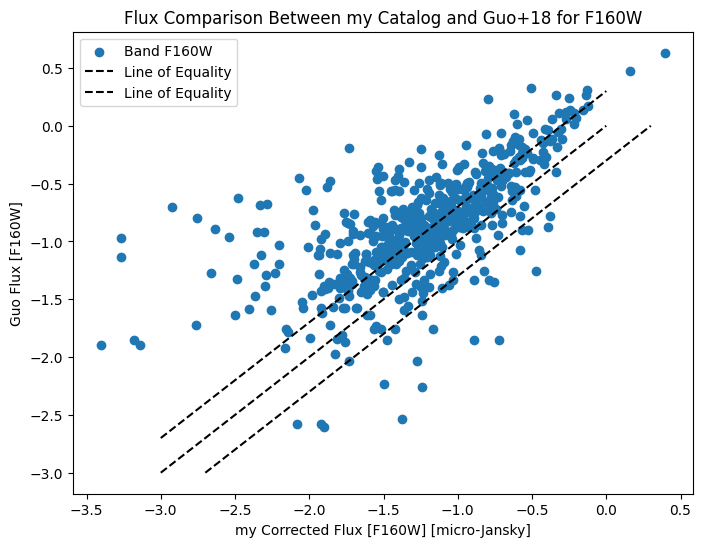

/Users/neal/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/neal/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


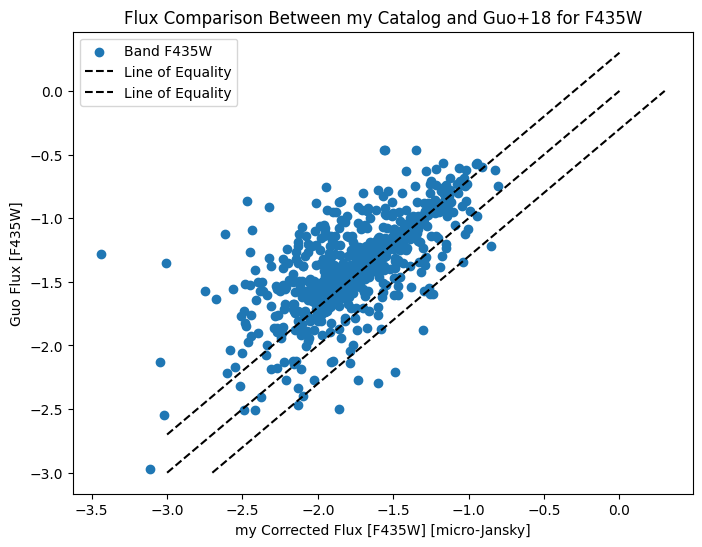

/Users/neal/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


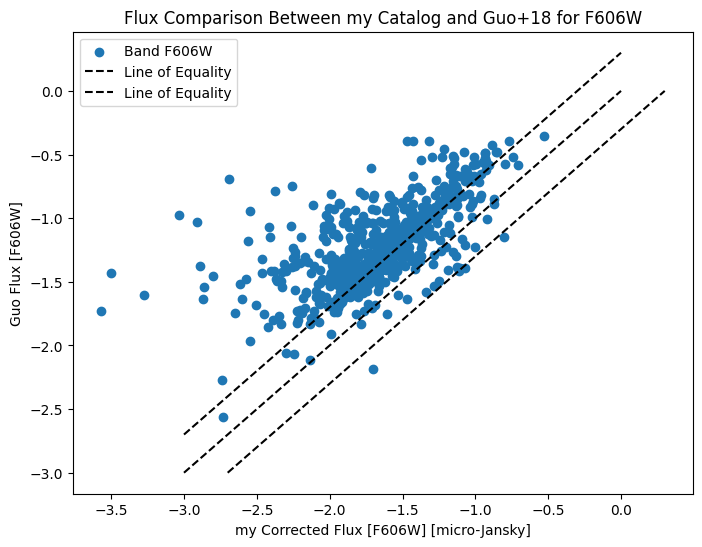

/Users/neal/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/neal/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


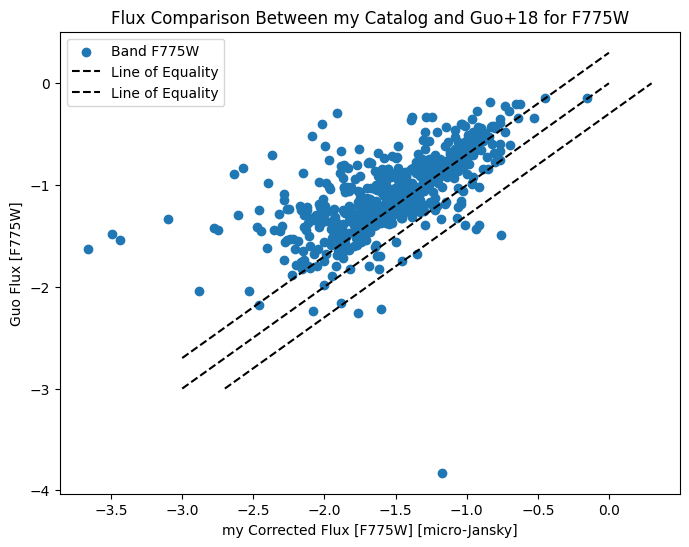

/Users/neal/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


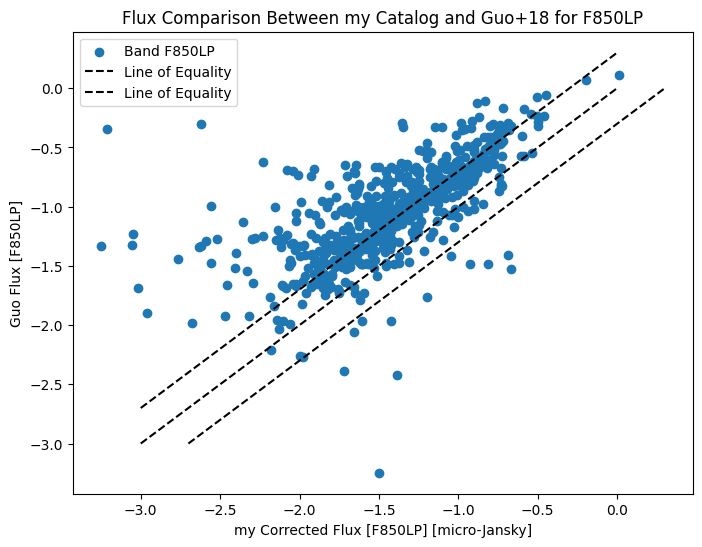

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from astropy.table import Table
# from astropy.io import ascii



# Filter Guo+18 catalog to the section with fiducial background subtraction
# guo_catalog_filtered = guo_catalog.iloc[15965:19158].reset_index(drop=True)
# guo_catalog_filtered = guo_catalog.iloc[9579:12772].reset_index(drop=True)
guo_catalog_filtered = guo_catalog.iloc[12772:15967].reset_index(drop=True)
#guo_catalog_filtered = guo_catalog[guo_catalog['BSC'] == 'bgsub_v4']

# Define the band suffixes formy catalog and the corresponding column names in Guo+18 catalog
bands = {
    'f125w': 'F125W',
    'f140w': 'F140W',
    'f160w': 'F160W',
    # 'f275w': 'F275W', 
    'f435w': 'F435W',
    'f606w': 'F606W',
    'f775w': 'F775W',
    'f850lp': 'F850LP',
}

# Remove the bands that do not exist in Guo's catalog
bands = {k: v for k, v in bands.items() if v in guo_catalog_filtered.columns}

# Check all bands exist inmy catalog
for band_suffix in bands.keys():
   my_flux_col = f'Corrected_Flux_{band_suffix}_mjy'
   assert my_flux_col in my_vandercat_complete.columns, f"Column '{my_flux_col}' not found in my catalog"

# Continue with the rest of the script for matching and plotting...

# Calculate normalized distance for mycatalog (dist_clump/r)
my_vandercat_complete['norm_dist_clump'] =(0.06* my_vandercat_complete['dist_clump']) / my_vandercat_complete['r']

# Set a threshold for the difference in normalized distances for matching
distance_threshold = 0.1

# Create an empty list to store matches
matches = []

# Iterate over my catalog and find matches in Guo's catalog based on CANDELS ID and normalized distance
for index, my_clump in my_vandercat_complete.iterrows():
    candels_id = my_clump['CANDELS_ID']
    norm_dist_my= my_clump['norm_dist_clump']

    # Find potential matches in Guo's catalog
    guo_matches = guo_catalog_filtered[guo_catalog_filtered['Gal'] == candels_id]
    guo_matches['dist_diff'] = (guo_matches['Dist'] - norm_dist_my).abs()

    # Identify the closest match within the threshold
    close_matches = guo_matches[guo_matches['dist_diff'] <= distance_threshold]
    if not close_matches.empty:
        closest_match = close_matches.loc[close_matches['dist_diff'].idxmin()]
        matches.append({
            'my_Catalog_Galaxy_ID': candels_id,
            'my_Clump_ID': index,
            'Guo_Clump_ID': closest_match.name,
            'my_Dist_Norm': norm_dist_my,
            'Guo_Dist_Norm': closest_match['Dist'],
            'Distance_Difference': closest_match['dist_diff']
        })


matches_df = pd.DataFrame(matches)

# Plot the flux comparison for each band
for band_suffix, guo_col_name in bands.items():
    my_flux_col = f'Corrected_Flux_{band_suffix}_mjy'
    
    # Merge matched flux data
    matched_fluxes = pd.merge(matches_df, my_vandercat_complete, left_on='my_Clump_ID', right_index=True)
    matched_fluxes = pd.merge(matched_fluxes, guo_catalog_filtered, left_on='Guo_Clump_ID', right_index=True, suffixes=('_my', '_guo'))

    # Plot myfluxes vs. Guo's for matched clumps
    plt.figure(figsize=(8, 6))
    plt.scatter(np.log10(matched_fluxes[my_flux_col]), np.log10(matched_fluxes[guo_col_name]), label=f'Band {band_suffix.upper()}')
    plt.xlabel(f'my Corrected Flux [{band_suffix.upper()}] [micro-Jansky]')
    plt.ylabel(f'Guo Flux [{guo_col_name}]')
    plt.title(f'Flux Comparison Between my Catalog and Guo+18 for {band_suffix.upper()}')
    plt.plot([-3,0 ], 
             [-3, 0], 'k--', label='Line of Equality')
    plt.plot([-3,0 ], 
             [-2.7, 0.3], 'k--', label='Line of Equality')
    plt.plot([-2.7,0.3 ], 
             [-3, 0], 'k--')
    plt.legend()
    plt.show()



In [ ]:
print(merged_catalog.columns)


Index(['Unnamed: 0', 'Field', 'CANDELS_ID', 'z', 'RA_gal', 'DEC_gal', 'A',
       'Clump_ID', 'dist_clump', 'flux_ratio', 'restuv_flux', 'RA_clump',
       'DEC_clump', 'Raw_Flux_f125w_mjy', 'Background_Flux_f125w_mjy',
       'Corrected_Flux_f125w_mjy', 'Raw_Flux_f160w_mjy',
       'Background_Flux_f160w_mjy', 'Corrected_Flux_f160w_mjy',
       'Raw_Flux_f275w_mjy', 'Background_Flux_f275w_mjy',
       'Corrected_Flux_f275w_mjy', 'Raw_Flux_f435w_mjy',
       'Background_Flux_f435w_mjy', 'Corrected_Flux_f435w_mjy',
       'Raw_Flux_f606w_mjy', 'Background_Flux_f606w_mjy',
       'Corrected_Flux_f606w_mjy', 'Raw_Flux_f775w_mjy',
       'Background_Flux_f775w_mjy', 'Corrected_Flux_f775w_mjy',
       'Raw_Flux_f850lp_mjy', 'Background_Flux_f850lp_mjy',
       'Corrected_Flux_f850lp_mjy', 'Raw_Flux_f140w_mjy',
       'Background_Flux_f140w_mjy', 'Corrected_Flux_f140w_mjy', 'r_x', 'r_y'],
      dtype='object')
